# Подключаем нужные библиотеки

In [1]:
import numpy as np
import pandas as pd
from numpy.linalg import norm
import pickle
import matplotlib.pyplot as plt
import itertools
from scipy.stats import norm as norm_d
from scipy.stats import randint
from scipy.stats import uniform
from scipy.optimize import minimize
from tqdm import tqdm
import copy
import math
import time
from scipy.optimize import minimize
from scipy.sparse.linalg import svds
from scipy.linalg import svdvals
import scipy
from sklearn.datasets import load_svmlight_file
import pickle
from pathlib import Path
from functions import *
from algorithms import *
from tests import *

%matplotlib inline

# Логистическая регрессия

Для удобства продублируем здесь задачу, которую мы решаем
$$
F(x) = f(x) + R(x) = \frac{1}{m}\sum\limits_{i=1}^m\underbrace{\left(\log\left(1 + \exp\left(-y_i\cdot (Ax)_i\right)\right) + \frac{l_2}{2}\|x\|_2^2\right)}_{f_i(x)} + \underbrace{l_1\|x\|_1}_{R(x)} \to \min\limits_{x\in\mathbb{R}^n}
$$

### Объединим подготовку данных в одну функцию

In [2]:
def prepare_data(dataset):
    filename = "datasets/" + dataset + ".txt"

    data = load_svmlight_file(filename)
    A, y = data[0], data[1]
    m, n = A.shape
    
    if (2 in y) & (1 in y):
        y = 2 * y - 3
    if (2 in y) & (4 in y):
        y = y - 3
    assert((-1 in y) & (1 in y))
    
    sparsity_A = A.count_nonzero() / (m * n)
    return A, y, m, n, sparsity_A

In [3]:
def compute_L(dataset, A):
    filename = "dump/"+dataset+"_L.txt"
    file_path = Path(filename)
    if file_path.is_file():
        with open(filename, 'rb') as file:
            L, average_L, worst_L = pickle.load(file)
    else:
        sigmas = svds(A, return_singular_vectors=False)
        m = A.shape[0]
        L = sigmas.max()**2 / (4*m)
        
        worst_L = 0
        average_L = 0
        denseA = A.toarray()
        for i in range(m):
            L_temp = (norm(denseA[i])**2)*1.0 / 4
            average_L += L_temp / m
            if L_temp > worst_L:
                worst_L = L_temp
        with open(filename, 'wb') as file:
            pickle.dump([L, average_L, worst_L],file)
    return L, average_L, worst_L

## Задание 1. Разреженность матрицы

Рассмотрите датасеты $\texttt{a9a}$, $\texttt{gisette}$, $\texttt{australian}$ и ещё любых 2 датасета на ваш вкус из LIBSVM https://www.csie.ntu.edu.tw/~cjlin/libsvmtools/datasets/binary.html. Для каждого выбранного датасета проанализируйте какой тип матрицы лучше использовать -- $\texttt{csr_matrix}$ или $\texttt{numpy.ndarray}$ -- чтобы вычислять для данного датасета 

1) полный градиент и

2) стох. градиент (рассмотреть батчи размера 1, 10, 100).

Как видно из формулы для подсчёта градиента 
$$
\nabla f(x) = -\frac{1}{m}\cdot\frac{A^\top y}{1+\exp(y\odot Ax)}  + l_2 x,
$$
и стох. градиента по батчу $S = \{i_1,i_2,\ldots,i_k\}$
$$
\frac{1}{k}\sum\limits_{j=1}^k \nabla f_{i_j}(x) = -\frac{1}{k}\cdot\frac{A_S^\top y_S}{1+\exp(y_S\odot A_Sx)}  + l_2 x,
$$
необходимо выполнить умножение $A^\top$ (или $A_S^\top$) на вектор и умножение $A$ (или $A_S$) на вектор, чтобы посчитать градиент (стох. градиент). Поэтому анализировать предлагается следующим способом: генерируется 5 случайных векторов размерности $n$, а затем в цикле много раз вычисляются градиенты (стох. градиенты) в указанных точках. Количество подсчётов градиентов выбирайте исходя из того, чтобы все умножения при одном из типов хранения матрицы $A$ занимали от 10 до 40 секунд. Для подсчёта стох. градиентов заранее насэмплируйте при помощи функции $\texttt{randint}$ большую выборку элементов от $0$ до $m-1$ (например, выборку размера $10^7$ элементов), а затем вырезайте из неё подряд идущие непересекающиеся куски длиной $r$, где $r$ -- размер батча. Для удобства считайте, что $l_2 = 0$

In [4]:
%%time
dataset = "a9a"
A, y, m, n, sparsity_A = prepare_data(dataset)
print("Число функций в сумме: ", m, ", размерность задачи: ", n)
L, average_L, worst_L = compute_L(dataset, A) #L может зависеть от запуска, поэтому для каждой задачи нужно сохранить свою константу L
print("Константа гладкости всей функции: ", L)
print("Средняя константа гладкости     : ", average_L)
print("Худшая константа гладкости      : ", worst_L)
print("Доля ненулевых элементов: ", sparsity_A)

Число функций в сумме:  32561 , размерность задачи:  123
Константа гладкости всей функции:  1.5719196992226612
Средняя константа гладкости     :  3.467276803535652
Худшая константа гладкости      :  3.5
Доля ненулевых элементов:  0.11275696922074716
CPU times: user 148 ms, sys: 4.53 ms, total: 153 ms
Wall time: 152 ms


По умолчанию матрица $A$ хранится в формате $\texttt{csr_matrix}$

In [5]:
denseA = A.toarray()
print(type(A))
print(type(denseA))

<class 'scipy.sparse.csr.csr_matrix'>
<class 'numpy.ndarray'>


Насэмплируем индексов для батчей

In [6]:
%%time
batch_indices = randint.rvs(low=0, high=m, size=10000000, random_state=None)

CPU times: user 56.8 ms, sys: 103 ms, total: 159 ms
Wall time: 160 ms


Пример того, как выглядят тесты для полноградиентного случая

In [7]:
%%time
x = norm_d.rvs(size=n)

CPU times: user 188 µs, sys: 0 ns, total: 188 µs
Wall time: 192 µs


In [8]:
num_of_tests = 600

In [9]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        logreg_grad(x, [A, y, 0, True])

CPU times: user 3.95 s, sys: 9.97 ms, total: 3.96 s
Wall time: 3.98 s


In [10]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        logreg_grad(x, [denseA, y, 0, False])

CPU times: user 18.6 s, sys: 12.8 ms, total: 18.6 s
Wall time: 18.6 s


Пример тестов для случая стох. градиентов

In [11]:
batch_size = 1
num_of_tests = 10000

In [12]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
        logreg_grad(x, [A[batch_ind], y[batch_ind], 0, True])

CPU times: user 8.57 s, sys: 75 µs, total: 8.57 s
Wall time: 8.57 s


In [13]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
        logreg_grad(x, [denseA[batch_ind], y[batch_ind], 0, False])

CPU times: user 480 ms, sys: 2 µs, total: 480 ms
Wall time: 479 ms


Зафиксируйте здесь результаты своих экспериментов:

In [7]:
def test_dataset(dataset = "a9a",num_of_tests=100):     
    A, y, m, n, sparsity_A = prepare_data(dataset)
    L, average_L, worst_L = compute_L(dataset, A)
    denseA = A.toarray()
    batch_indices = randint.rvs(low=0, high=m, size=10000000, random_state=None)
    start_gd_A = time.time()
    run = 5
    for _ in range(run):
        x = norm_d.rvs(size=n)
        for i in range(num_of_tests):
            logreg_grad(x, [A, y, 0, True])
    elapsed_gd_A = time.time() - start_gd_A
    start_gd_denseA = time.time()    
    for _ in range(5):
        x = norm_d.rvs(size=n)
        for i in range(num_of_tests):
            logreg_grad(x, [denseA, y, 0, False])
    elapsed_gd_denseA = time.time() - start_gd_denseA
            
    batch_size = 1
    num_of_tests *= 10
    elapsed_sgd_A =[]
    elapsed_sgd_denseA = []
    
    batch_arr = [1, 10, 100]
    for batch_size in batch_arr:
        start_sgd_A = time.time() 
        for _ in range(run):
            x = norm_d.rvs(size=n)
            for i in range(num_of_tests):
                batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
                logreg_grad(x, [A[batch_ind], y[batch_ind], 0, True])
        elapsed_sgd_A.append(time.time() - start_sgd_A)
        start_sgd_denseA = time.time() 

        for _ in range(run):
            x = norm_d.rvs(size=n)
            for i in range(num_of_tests):
                batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
                logreg_grad(x, [denseA[batch_ind], y[batch_ind], 0, False])
        elapsed_sgd_denseA.append(time.time() - start_sgd_denseA)
        
    ans = {'Dataset':dataset,
            'Число функций в сумме':m,
            'размерность задачи':n,
            'Константа гладкости всей функции':L,
            'Средняя константа гладкости':average_L,
            'Худшая константа гладкости':worst_L,
            'Доля ненулевых элементов':sparsity_A,
            'GD Time A':elapsed_gd_A,
            'GD Time denseA':elapsed_gd_denseA,
            'SGD Time A 1':elapsed_sgd_A[0],
            'SGD Time denseA 1':elapsed_sgd_denseA[0],
            'SGD Time A 10':elapsed_sgd_A[1],
            'SGD Time denseA 10':elapsed_sgd_denseA[1],
            'SGD Time A 100':elapsed_sgd_A[2],
            'SGD Time denseA 100':elapsed_sgd_denseA[2]}
    
    return ans

In [18]:
result = test_dataset()
result

{'Dataset': 'a9a',
 'Число функций в сумме': 32561,
 'размерность задачи': 123,
 'Константа гладкости всей функции': 1.5719196992226612,
 'Средняя константа гладкости': 3.467276803535652,
 'Худшая константа гладкости': 3.5,
 'Доля ненулевых элементов': 0.11275696922074716,
 'GD Time A': 0.6019408702850342,
 'GD Time denseA': 3.20794677734375,
 'SGD Time A 1': 0.8676514625549316,
 'SGD Time denseA 1': 0.05083513259887695,
 'SGD Time A 10': 0.908416748046875,
 'SGD Time denseA 10': 0.0597379207611084,
 'SGD Time A 100': 0.9634072780609131,
 'SGD Time denseA 100': 0.13609075546264648}

In [20]:
sets = ['a9a','gisette','australian','breast-cancer','german_numer']
nums = [500, 100, 2000, 4000, 1000]

df=[]
for dtset,n in zip(sets,nums):
    df.append(test_dataset(dtset,n))
    


NameError: name 'pd' is not defined

In [22]:
df_pd = pd.DataFrame(df)
df_pd

,Dataset,Число функций в сумме,размерность задачи,Константа гладкости всей функции,Средняя константа гладкости,Худшая константа гладкости,Доля ненулевых элементов,GD Time A,GD Time denseA,SGD Time A 1,SGD Time denseA 1,SGD Time A 10,SGD Time denseA 10,SGD Time A 100,SGD Time denseA 100
0,a9a,32561,123,1.571920e+00,3.467277e+00,3.500000e+00,0.112757,3.027779,15.487433,4.186194,0.240756,4.368608,0.291410,4.513048,0.618482
1,gisette,6000,5000,8.428680e+02,1.163345e+03,1.201509e+03,0.991000,75.626856,8.745538,0.932666,0.140692,1.520118,0.264078,11.283880,1.829902
2,australian,690,14,7.036285e+06,7.051932e+06,2.500101e+09,0.799586,1.181160,0.196836,16.761241,0.950982,17.036120,1.052700,17.808259,1.287474
3,breast-cancer,683,10,3.859904e+11,3.859904e+11,4.525490e+13,1.000000,2.260141,0.448214,33.539652,1.888011,34.317583,2.045947,36.355606,2.811076
4,german_numer,1000,24,8.436612e+02,9.798927e+02,9.305750e+03,0.749542,0.733951,0.121783,8.578178,0.459780,8.689462,0.499767,9.091253,0.664208


Лучше выбирать разреженную матрицу. Она хуже всего проявила себя один раз на датасете а9а обычным градиентным спуском

## Задание 2. Прокс-оператор

Имплементируйте функцию, вычисляющую $\text{prox}_R(x)$, где $R(x) = \lambda \|x\|_1$, $\lambda \geq 0$. Ваша функция должна брать первым аргументом точку $x$, в которой нужно посчитать прокс, а вторым аргументом -- число $\lambda$.

In [23]:
#напишите код в этой ячейке
def prox_R(x, lamb):
    return np.sign(x) * np.maximum(np.abs(x)- lamb, 0)

Для контроля корректности вызовите фунцию $\texttt{prox}\_\texttt{test}$ из файла $\texttt{tests.py}$. Если какой-то из тестов будет не пройден, то функция вернёт массив $[x, \lambda, \text{prox}_{R}(x)]$, где $x$ и $\lambda$ - параметры, на которых Ваша фукция выдала неправильный ответ, $\text{prox}_{R}(x)$ - это правильный ответ.

In [24]:
prox_test(prox_R)

Все тесты пройдены успешно!


0

## Задание 3. SVRG

Используя заготовку, которая оставлена в файле $\texttt{algorithms.py}$, имплементируйте $\texttt{prox-SVRG}$ с мини-батчингом. Обратите внимание, что в методе можно передавать выборку индексов $\texttt{indices}$ для контроля корректности работы. Однако если передавать $\texttt{None}$ в качестве $\texttt{indices}$, то в методе новые индексы тоже будут сэмплироваться не на каждй итерации. Сделано это осознанно: можн гораздо быстрее насэмплировать i.i.d. выборку размера, скажем, $N$ за один вызов функции, чем сэмплировать $N$ раз подряд выборку размера $1$. Это можно наглядно проверить. Для начала загрузим датасет $\texttt{a9a}$.

In [4]:
%%time
dataset = "a9a"
A, y, m, n, sparsity_A = prepare_data(dataset)
print("Число функций в сумме: ", m, ", размерность задачи: ", n)
L, average_L, worst_L = compute_L(dataset, A) #L может зависеть от запуска, поэтому для каждой задачи нужно сохранить свою константу L
print("Константа гладкости всей функции: ", L)
print("Средняя константа гладкости     : ", average_L)
print("Худшая константа гладкости      : ", worst_L)
print("Доля ненулевых элементов: ", sparsity_A)

Число функций в сумме:  32561 , размерность задачи:  123
Константа гладкости всей функции:  1.5719196992226612
Средняя константа гладкости     :  3.467276803535652
Худшая константа гладкости      :  3.5
Доля ненулевых элементов:  0.11275696922074716
CPU times: user 155 ms, sys: 0 ns, total: 155 ms
Wall time: 154 ms


В нём 32561 функция в сумме. Предположим, что мы запускаем $\texttt{prox-SGD}$ с размером батча $r = 1$ на $1000000$ итераций, что примерно 30 проходов по датасету, то есть не так уж и много. Давайте просэмплируем выборку размера $1000000$ за один раз и $1000000$ раз просэмплируем выборку размера $1$. Сначала просэмплируем сразу большую выборку.

In [5]:
%%time
randint.rvs(low=0, high=m, size=1000000, random_state=None)

CPU times: user 8.91 ms, sys: 4.13 ms, total: 13 ms
Wall time: 12.4 ms


array([ 7641, 24183,  2348, ...,    64,  5866, 18384])

На это ушло 1-3 секунды (зависит от мощности компьютера). А теперь рассмотрим второй вариант. Запустите следущую ячейку, а затем можете сходить заварить себе чай...

In [6]:
%%time
for i in range(1000000):
    randint.rvs(low=0, high=m, size=1, random_state=None)

CPU times: user 45.2 s, sys: 70.8 ms, total: 45.3 s
Wall time: 45.3 s


Таким образом, выгоднее сэмплировать сразу много индексов, чтобы не терять много времени на сэмплирования.

Для проверки корректности работы метода предлагается воспользоваться заранее сгенерированной выборкой индексов и запустить для неё $\texttt{prox-SVRG}$ со следующими параметрами

In [7]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3
save_info_period = 100

#эти 2 параметра выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse_full = False
sparse_stoch = False

In [8]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 945 ms, sys: 20 ms, total: 965 ms
Wall time: 965 ms


Запустите функцию, тестирующую корректность работы

In [9]:
svrg_test(res)

Тесты пройдены!


0

Для удобства тестирования и построения графиков методов Вам предлагается использовать следующие функции.

Данная функция нужна для того, чтобы получить доступ к результатам работы метода.

In [57]:
def read_results_from_file(filename, method, args):
    if method == 'SVRG':
        with open('dump/'+filename+'_SVRG_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])+"_num_of_epochs_"
                  +str(args[3])
              +"_epoch_length_"+str(args[4])+"_batch_size_"+str(args[5])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == 'L-SVRG':
        with open('dump/'+filename+'_L-SVRG_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])+"_num_of_epochs_"
                  +str(args[3])
              +"_prob_"+str(args[4])+"_batch_size_"+str(args[5])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == 'SAGA':
        with open('dump/'+filename+'_SAGA_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])+"_num_of_epochs_"
                  +str(args[3])
              +"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "SGD_const_stepsize":
        with open('dump/'+filename+'_SGD_const_stepsize_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "SGD_decr_stepsize":
        with open('dump/'+filename+'_SGD_decr_stepsize_gamma_'+str(args[0][0])+"_decr_period_"
                  +str(args[0][1])+"_decr_coeff_"+str(args[0][2])
                  +"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "prox-GD":
        with open('dump/'+filename+'_prox-GD_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "GD":
        with open('dump/'+filename+'_GD_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "FISTA":
        with open('dump/'+filename+'_FISTA'+"_l2_"+str(args[0])+"_l1_"+str(args[1])
                  +"_num_of_epochs_"+str(args[2])+".txt", 'rb') as file:
            return pickle.load(file)

Эта функция нужна, чтобы выгрузить решение задачи для данного датасета при заданных $l_2$ и $l_1$.

In [10]:
def save_solution(dataset, l2, l1, x_star, f_star):
    filename = "dump/"+dataset+"_solution_l2_"+str(l2)+"_l1_"+str(l1)+".txt"
    with open(filename, 'wb') as file:
        pickle.dump([x_star, f_star], file)

Эта функция нужна, чтобы выгрузить решение задачи для данного датасета при заданных $l_2$ и $l_1$.

In [11]:
def read_solution(dataset, l2, l1):
    with open('dump/'+dataset+'_solution_l2_'+str(l2)+"_l1_"+str(l1)+".txt", 'rb') as file:
        return pickle.load(file)

Теперь запустите $\texttt{prox-SVRG}$ с теми же параметрами, но на бОльшее число эпох. Сохраните $x^*$ и $f(x^*)$. Параметр $\texttt{indices}$ выставляйте равным $\texttt{None}$. Параметры $l_2$ и $l_1$ выбирайте согласно PDF-документу с заданиями. Посчитайте количество ненулевых значений в найденном решении.

In [13]:
# ваш код здесь
# задать параметры
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 500
save_info_period = 100

#эти 2 параметра выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse_full = False
sparse_stoch = False

In [14]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
print("Найденное значение: ", res['func_vals'][-1])
print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)

Найденное значение:  0.35785681111419754
Процент ненулевых координат в найденном решении:  0.2845528455284553
CPU times: user 2min 29s, sys: 15.8 ms, total: 2min 29s
Wall time: 2min 29s


In [15]:
# ваш код здесь
# сохранить решение x_star и f_star
save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

Сравните найденное значение с тем, которое выдаёт стандартный солвер (сравните результаты для $l_1 = 0$ и $l_1 = \frac{L}{1000}$)

In [16]:
%%time
param = [A, y, l2, True, l1]
res_solver = minimize(F, x_init, args = param, jac=logreg_grad_plus_lasso, 
                      options={'maxiter':5000, 'disp':True}, tol=1e-10)

print(res_solver.fun)

         Current function value: 0.357986
         Iterations: 185
         Function evaluations: 262
         Gradient evaluations: 256
0.35798556341716964
CPU times: user 4.36 s, sys: 56 ms, total: 4.41 s
Wall time: 905 ms


Теперь повторите эксперимент с $S = 3$, но передайте туда найденные при помощи $\texttt{prox-SVRG}$ $x^*$ и $f(x^*)$ в качестве $\texttt{x}{\_}\texttt{star}$ и $\texttt{f}{\_}\texttt{star}$

In [17]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 3
save_info_period = 100

#эти 2 параметра выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse_full = False
sparse_stoch = False

In [18]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 899 ms, sys: 12 ms, total: 911 ms
Wall time: 911 ms


Следующая функция позволяет строить графики

In [35]:
def make_plots(args):
    supported_modes_y = ['squared_distances', 'func_vals']
    supported_modes_x = ['time', 'data_passes', 'iters']
    
    dataset = args[0]
    filename = args[1]
    mode_y = args[2]
    mode_x = args[3]
    figsize = args[4]
    fontsize = args[5]
    title = args[6]
    methods = args[7]
    
    assert(mode_y in supported_modes_y)
    assert(mode_x in supported_modes_x)
    
    plt.figure(figsize=figsize)
    plt.title(title, fontsize=fontsize)
    marker = itertools.cycle(('+', 'd', 'x', 'o', '^', 's', '*', 'p', '<', '>', '^'))
    
    num_of_methods = len(methods)
    for idx, method in enumerate(methods):
        res = read_results_from_file(filename, method[0], method[1])
        if method[3] == None:
            length = len(res['iters'])
        else:
            length = method[3]
        plt.semilogy(res[mode_x][0:length], res[mode_y][0:length] / res[mode_y][0], linewidth=2, marker=next(marker), 
            markersize = 20, 
            markevery=range(-idx*int(length/(10*num_of_methods)), len(res[mode_x][0:length]), int(length/10)), 
            label = method[0]+method[2])
        
    
    plt.legend(bbox_to_anchor=(2,1), loc="upper right", fontsize=fontsize)
    if mode_x == 'time':
        plt.xlabel(r"Time, $s$", fontsize=fontsize)
    if mode_x == 'sampled_grads':
        plt.xlabel(r"Number of sampled gradients / number of data samples", fontsize=fontsize)
    if mode_x == 'iters':
        plt.xlabel(r"Number of iterations", fontsize=fontsize)
    if mode_y == 'squared_distances':
        plt.ylabel(r"$\frac{||x^k - x^*||_2^2}{||x^0 - x^*||_2^2}$", fontsize=fontsize)
    if mode_y == 'func_vals':
        plt.ylabel(r"$\frac{f(x^k)-f(x^())}{f(x^0)-f(x^*)}$", fontsize=fontsize)
    
    plt.xticks(fontsize=fontsize)
    _ = plt.yticks(fontsize=fontsize)

In [20]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 10
gamma = 1.0/(6*(L+l2))

#это массив с методами и их парамтерами, для которых мы хотим построить графики
#в кждом массиве внутри этого массива есть 4 элемента
#первый элемент -- название метода
#второй элемент -- [параметры, чтобы открыть файл]
#третий элемент -- метка, которая будет использоваться в легенде графика
#четвёртый элемент -- None или целое число, если Вы хотите обрезать график справа
methods = [['SVRG', [gamma, l2, l1, 3, int(2*m/10), 10], ' третий аргумент', None],]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]



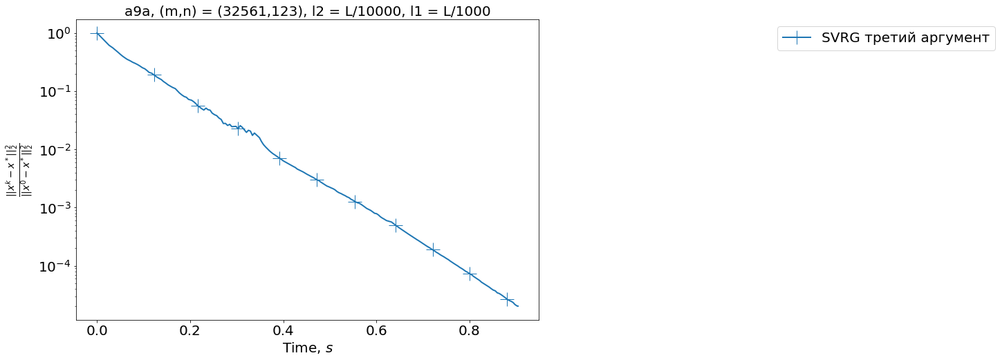

In [21]:
make_plots(args=args_for_plots)

Попробуйте разные размеры батчей и разные $l_2$ и $l_1$, как это указано в задании

In [22]:
%%time
arr_l2 = [L / 100000, L / 10000, L / 1000]
for l2_ in tqdm(arr_l2):
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = None
    f_star = None
    S = 1000
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [14:22<00:00, 287.47s/it]

CPU times: user 14min 21s, sys: 87.9 ms, total: 14min 21s
Wall time: 14min 22s


In [28]:
%%time
r_arr = [1, 10, 100]
for r in r_arr:
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2, l1)[0]
    f_star = read_solution(dataset, l2, l1)[1]
    S = 50
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

CPU times: user 2min 22s, sys: 28 ms, total: 2min 22s
Wall time: 2min 22s


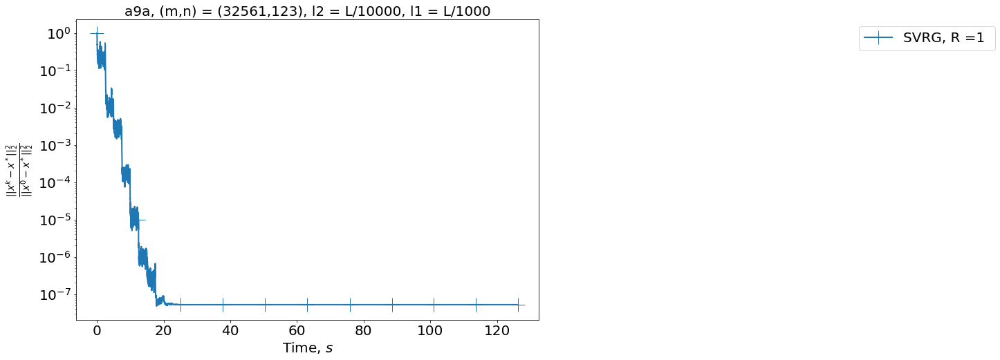

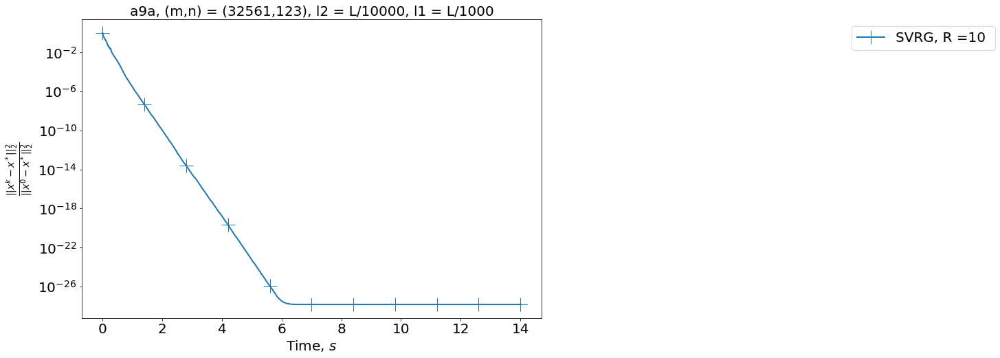

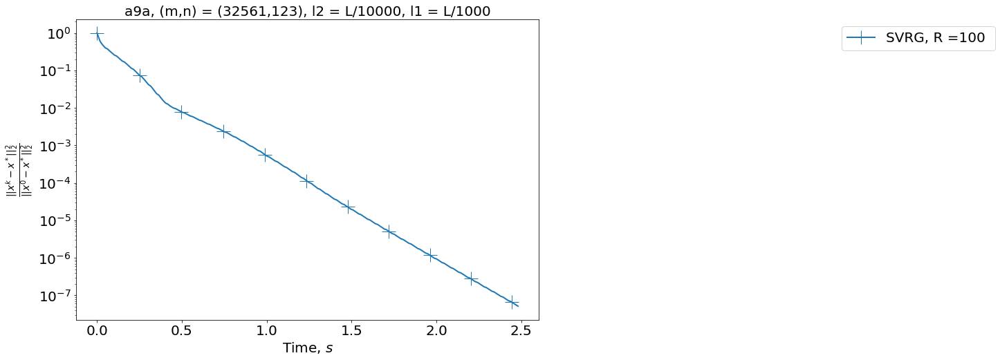

In [29]:
for r in r_arr:
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), r], 
               f', R ={r} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [30]:
%%time
for l2_ in arr_l2:
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

CPU times: user 34.6 s, sys: 4 ms, total: 34.6 s
Wall time: 34.6 s


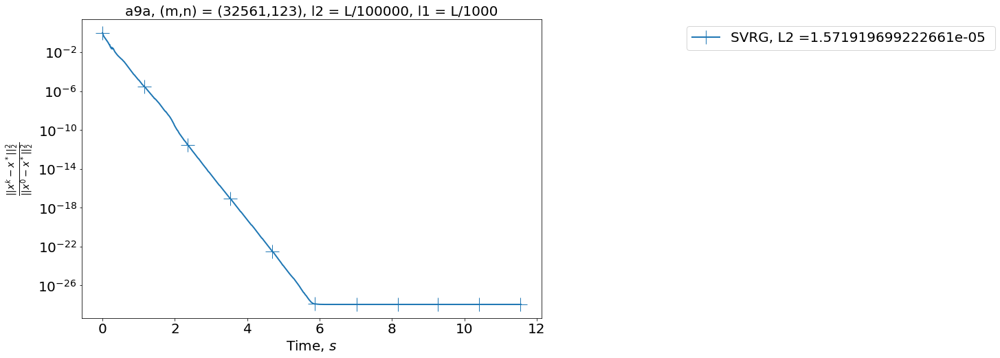

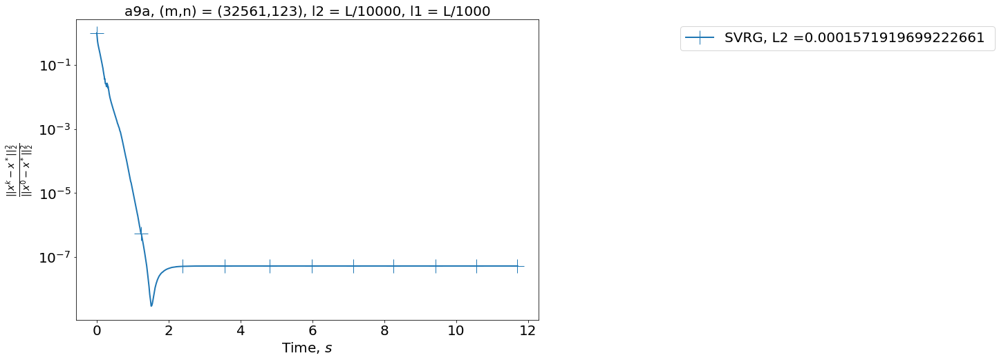

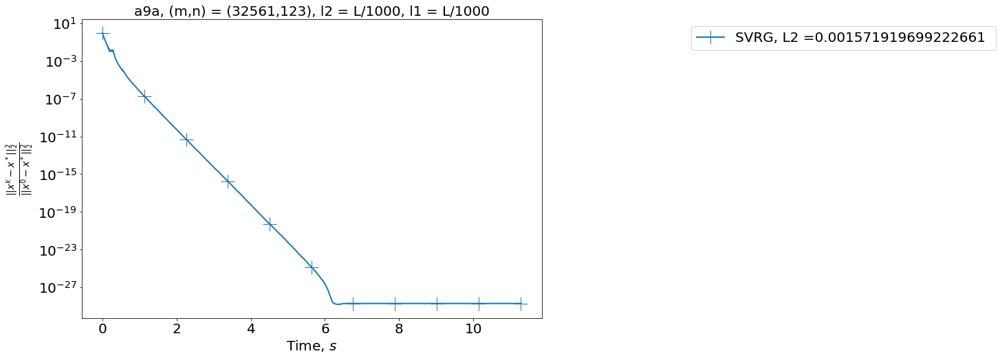

CPU times: user 563 ms, sys: 1 µs, total: 563 ms
Wall time: 561 ms


In [34]:
%%time
for l2_ in arr_l2:
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

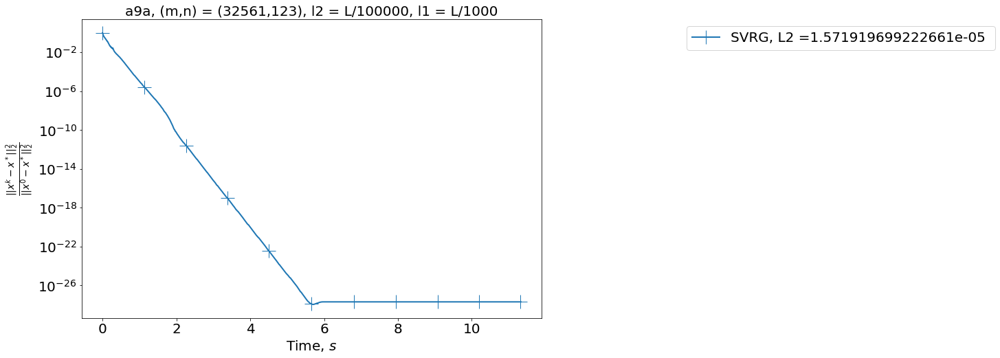

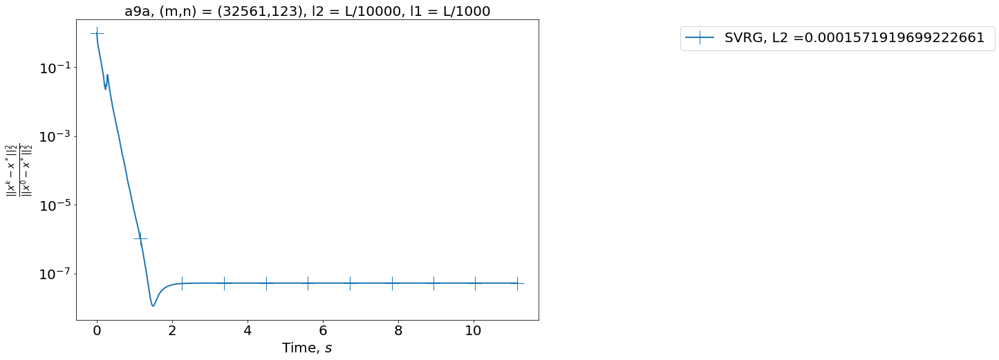

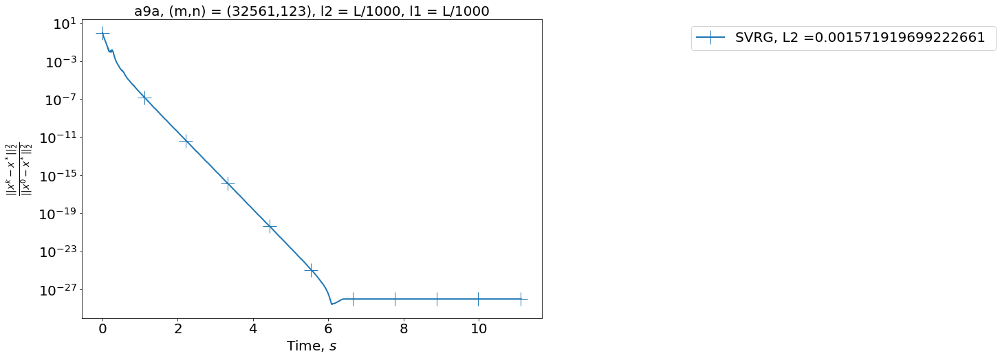

CPU times: user 570 ms, sys: 1e+03 ns, total: 570 ms
Wall time: 569 ms


In [26]:
%%time
for l2_ in arr_l2:
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

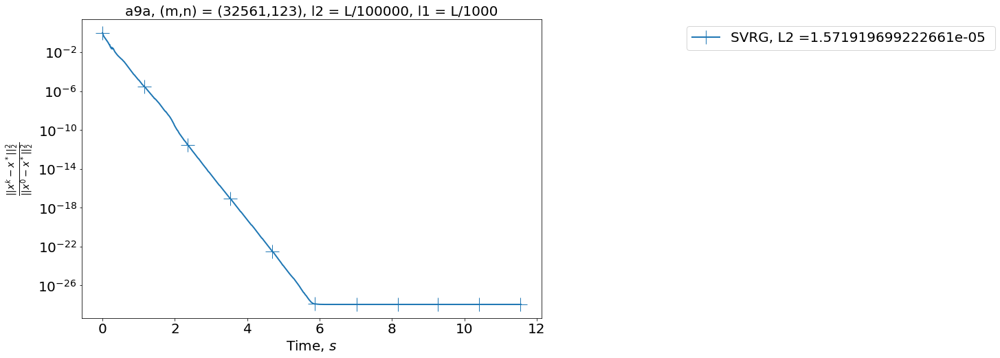

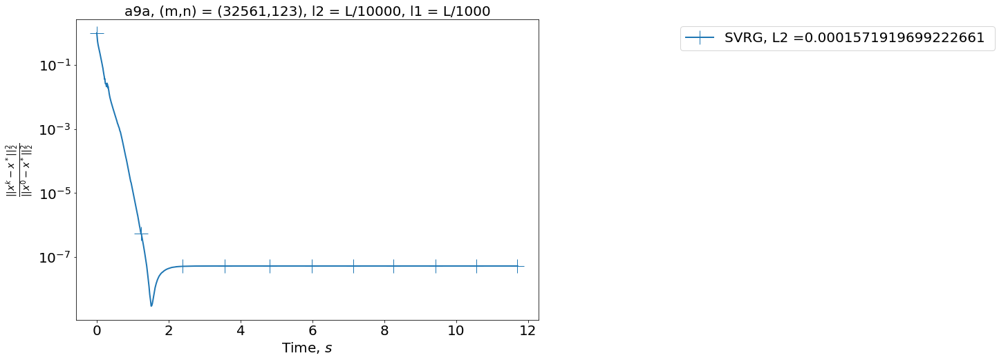

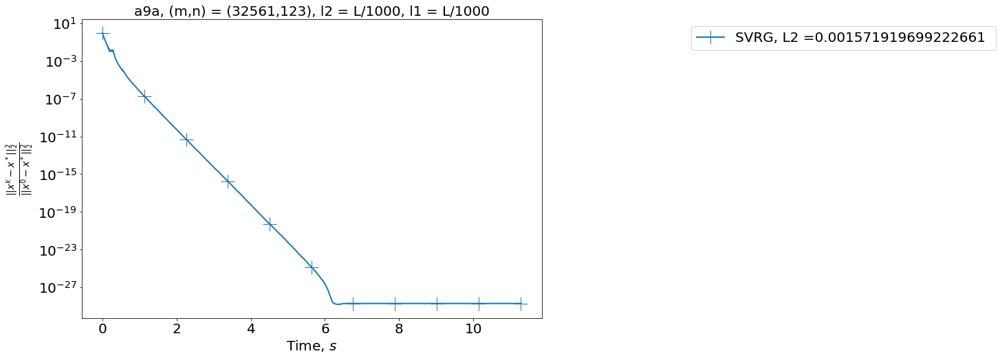

In [35]:
for l2_ in arr_l2:
    dataset = "a9a"
    filename=dataset + "_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0 / (6 * (L + l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2 * m / batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

## Задание 4. SGD

Имплементируйте $\texttt{prox-SGD}$ с мини-батчингом и постоянным шагом. Имплементируйте $\texttt{prox-SGD}$ с мини-батчингом и периодически уменьшающимся шагом.

In [118]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3
save_info_period = 100

#эти 2 параметра выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse_full = True
sparse_stoch = False

In [119]:
%%time
res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 348 ms, sys: 11.9 ms, total: 360 ms
Wall time: 360 ms


Запустите функцию, тестирующую корректность работы

In [120]:
sgd_const_test(res)

Тесты пройдены!


0

In [121]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
gamma_schedule = [gamma, 1, 0.5]
x_star = None
f_star = None
S = 10
save_info_period = 100

#эти 2 параметра выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse_full = True
sparse_stoch = False

In [122]:
%%time
res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.16 s, sys: 11 µs, total: 1.16 s
Wall time: 1.16 s


Запустите функцию, тестирующую корректность работы

In [123]:
sgd_decr_test(res)

Тесты пройдены!


0

Если тесты пройдены успешно, то выполните эксперименты, описанные в задании.

In [124]:
arr_1 = [1.0,0.1,0.01,0.05]

for a in tqdm(arr_1):
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 4/4 [00:43<00:00, 10.86s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

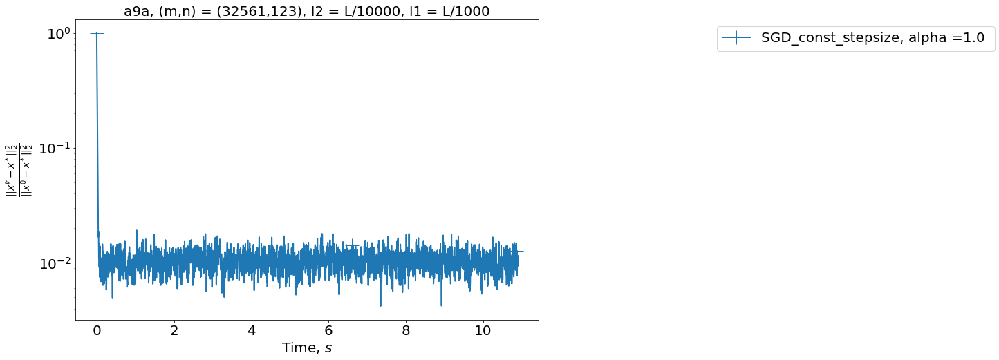

 25%|██▌       | 1/4 [00:00<00:00,  3.93it/s]

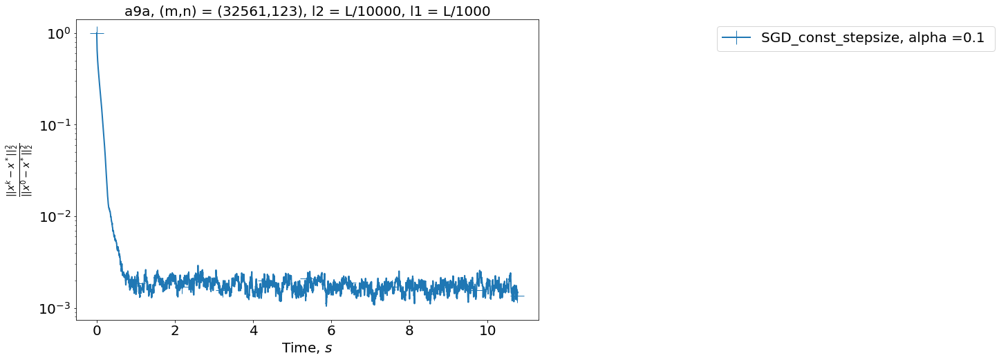

 50%|█████     | 2/4 [00:00<00:00,  2.94it/s]

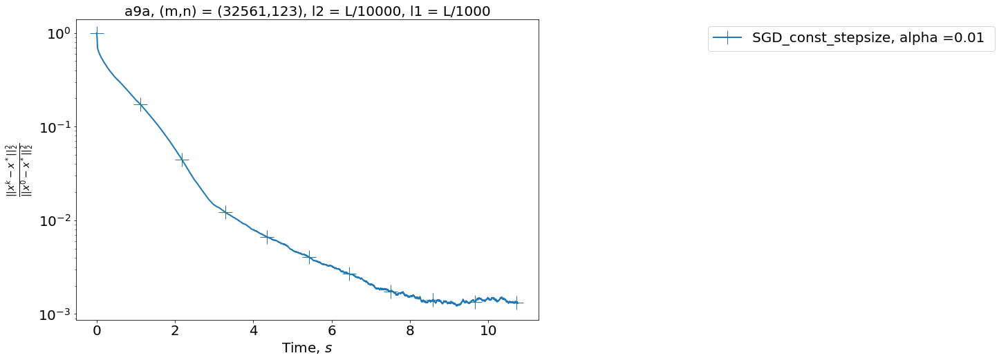

 75%|███████▌  | 3/4 [00:01<00:00,  3.14it/s]

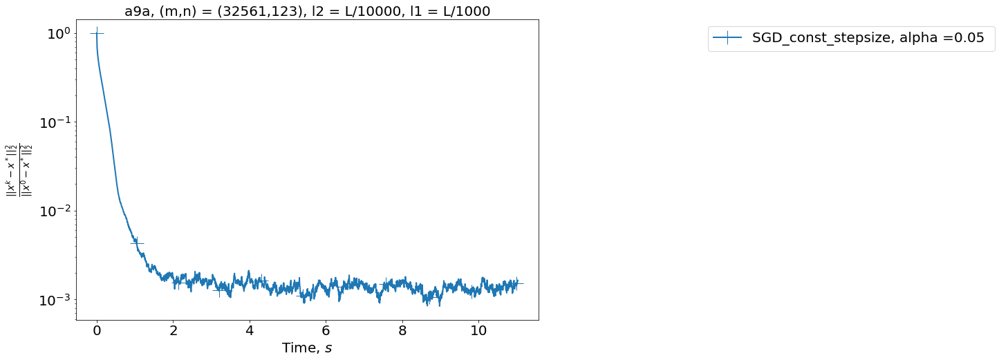

100%|██████████| 4/4 [00:01<00:00,  3.05it/s]


In [125]:
for a in tqdm(arr_1):
    dataset = "a9a"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    
    methods = [
             ['SGD_const_stepsize', [gamma, l2, l1, S, 10], 
               f', alpha ={a} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

при большом значении $\alpha$ заметна осцилляция

In [126]:
gamma = 10 / (6 * (L + l2))
gammas = [[gamma, 10, 0.8],[gamma, 10, 0.5],[gamma, 5, 0.5],[gamma, 5, 0.9],[gamma, 2, 0.9],[gamma, 15, 0.9]]


for schedule in tqdm(gammas):
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 10/(6*(L+l2))
    gamma_schedule = schedule
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 6/6 [01:06<00:00, 11.02s/it]


  0%|          | 0/6 [00:00<?, ?it/s]

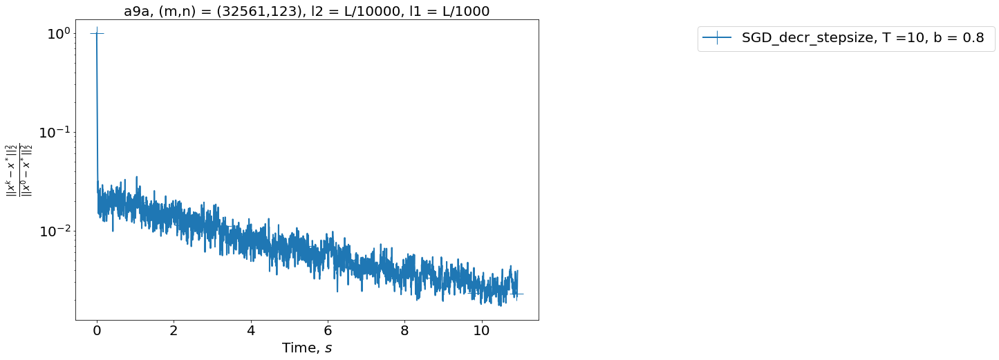

 17%|█▋        | 1/6 [00:00<00:01,  4.11it/s]

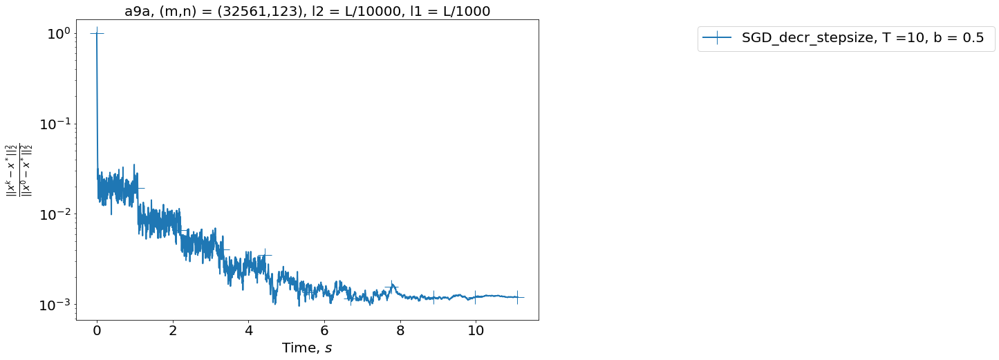

 33%|███▎      | 2/6 [00:00<00:01,  3.89it/s]

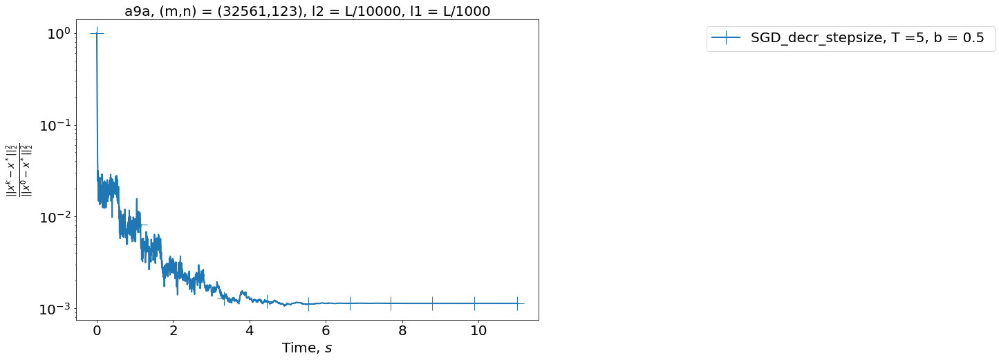

 50%|█████     | 3/6 [00:00<00:00,  3.87it/s]

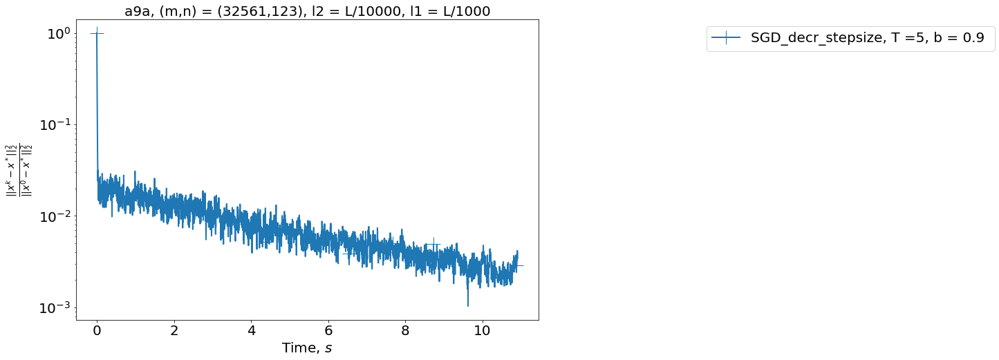

 67%|██████▋   | 4/6 [00:01<00:00,  3.87it/s]

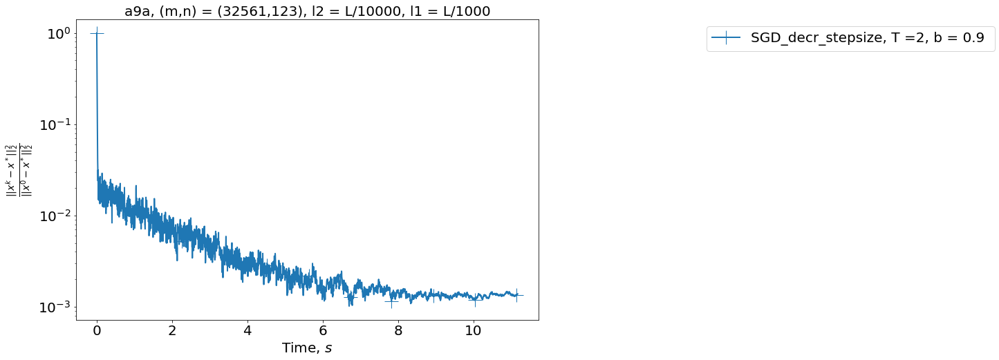

 83%|████████▎ | 5/6 [00:01<00:00,  3.84it/s]

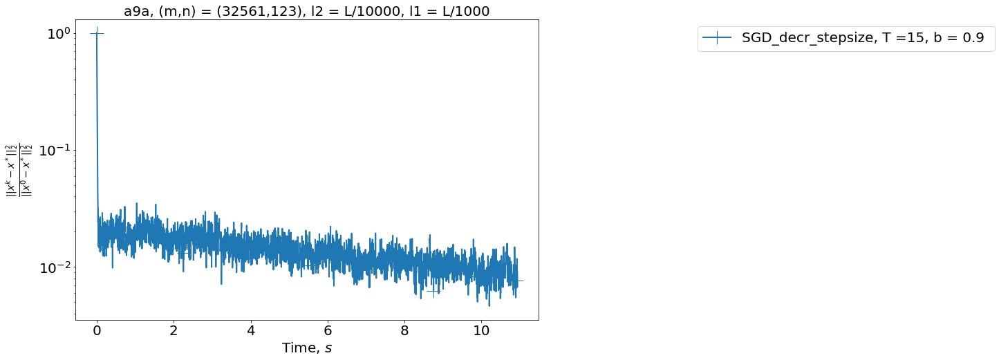

100%|██████████| 6/6 [00:01<00:00,  3.83it/s]


In [127]:
for schedule in tqdm(gammas):
    dataset = "a9a"
    filename=dataset + "_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2 * m / batch_size)
    gamma = 10 / (6 * (L + l2))
    gamma_schedule = schedule
    S = 100
    save_info_period = 100
    
    methods = [
             ['SGD_decr_stepsize', [schedule, l2, l1, S, 10], 
               f', T ={schedule[1]}, b = {schedule[2]} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset + ", (m,n) = (" + str(m)+ "," + str(n) + "), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

## Задание 5. L-SVRG

Имплементируйте $\texttt{prox-L-SVRG}$ с мини-батчингом.

Для $\texttt{prox-L-SVRG}$ для тестирования корректности используйте заранее насэмплированную выборку bernoulli_exp из распределения Бернулли с нужным параметром. Этот массив нужен, чтобы определять, нужно ли обновлять $w$ на текущей итерации или нет. Если обновляется $w$, то нужно пересчитать полный градиент в точке $w$, чтобы потом его можно было использовать. Как и в случае сэмплирования индексов для выбора слагаемых, гораздо быстрее сгенерировать выборку некоторого размера $N$ из распределения Бернулли, чем сэмплировать $N$ раз, поэтому предлагается периодически сэмплировать выборку из распределения Бернулли некоторого разумного размера, нежели сэмплировать выборку размера $1$ на каждой итерации. Кроме того, возможность передавать массив bernoulli_exp в метод введена для того, чтобы можно было проконтроллировать правильность работы Вашей имплементации, т.к. в таком случае для метода заранее определено (на первых len(bernoulli_exp) итерациях), в какие моменты происходит обновление $w$.

In [8]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)
with open("dump/bernoulli_test.txt", 'rb') as file:
    bernoulli_exp = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
p = 1.0*batch_size / m
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3
save_info_period = 100

#эти 2 параметра выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse_full = False
sparse_stoch = False

In [9]:
%%time
res = l_svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, p=p, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, bernoulli_exp=bernoulli_exp,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1min, sys: 37.7 ms, total: 1min
Wall time: 1min 1s


Запустите функцию, тестирующую корректность работы

In [10]:
l_svrg_test(res)

Некорректная последняя точка


1

$\texttt{Не знаю, где я ошибся} $

Если тесты пройдены успешно, то выполните эксперименты, описанные в задании.

## Задание 6. prox-GD, FISTA и GD

Имплементируйте $\texttt{prox-GD}$, $\texttt{FISTA}$ и $\texttt{GD}$

In [11]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = None
f_star = None
S = 1000
save_info_period = 10

#этото параметр выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse = False

In [12]:
%%time
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.1 s, sys: 3.98 ms, total: 1.11 s
Wall time: 1.11 s


Запустите функцию, тестирующую корректность работы

In [13]:
prox_gd_test(res)

Тесты пройдены!


0

In [14]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = None
f_star = None
S = 1000
save_info_period = 10

#этото параметр выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse = True

In [15]:
%%time
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.6 s, sys: 3.97 ms, total: 1.6 s
Wall time: 1.61 s


Запустите функцию, тестирующую корректность работы

In [16]:
fista_test(res)

Тесты пройдены!


0

In [17]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = None
f_star = None
S = 1000
save_info_period = 10

#этото параметр выставите в соответствии с вашими экспериментами по разреженности матрицы
sparse = True

In [18]:
%%time
res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.67 s, sys: 0 ns, total: 1.67 s
Wall time: 1.67 s


Запустите функцию, тестирующую корректность работы

In [19]:
gd_test(res)

Тесты пройдены!


0

Если тесты пройдены успешно, то выполните эксперименты, описанные в задании.

In [22]:
x_init = np.ones(n)
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S=np.sqrt(L/l2)*np.log((delta_f+l2*res['squared_distances'][0])/epsilon)

In [24]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
S = int(S)
save_info_period = 10
sparse = True
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

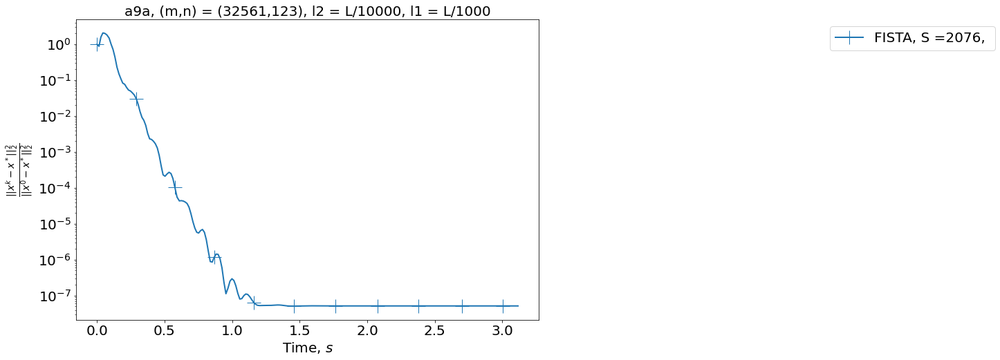

In [36]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['FISTA', [l2, l1, S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

Метод очень быстро сошелся!

In [43]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
save_info_period = 10


In [48]:
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S = np.sqrt(L / l2) * np.log((delta_f + l2 * res['squared_distances'][0]) / epsilon)
S = int(S)

In [49]:
sparse = False
gamma = 1/L
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

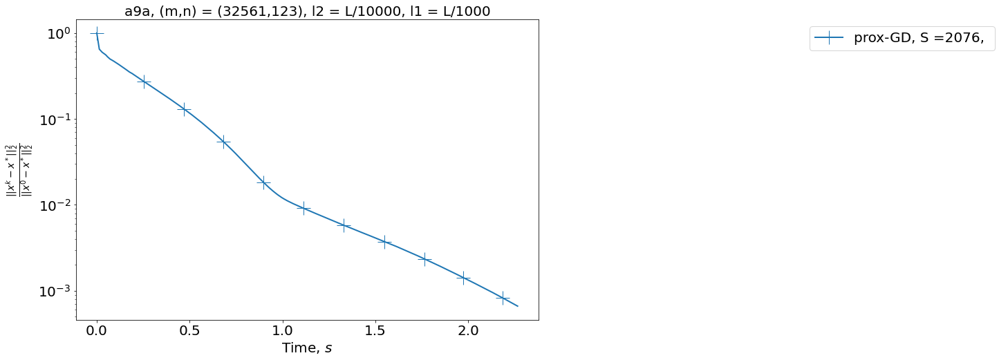

In [50]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['prox-GD', [gamma, l2, l1,S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

сходится хуже предыдущего

In [51]:
gamma_arr = [0.1, 0.5, 1.5, 2., 2.3, 2.5, 2.8, 3, 3.1]

In [53]:
for g in tqdm(gamma_arr):
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    gamma = g / (L + l2)
    S = 12000
    save_info_period = 10
    sparse = False
    res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
         sparse=sparse, l1=l1, S=S, max_t=np.inf,
         save_info_period=save_info_period, 
         x_star=x_star, f_star=f_star)

100%|██████████| 9/9 [01:58<00:00, 13.16s/it]


  0%|          | 0/9 [00:00<?, ?it/s]

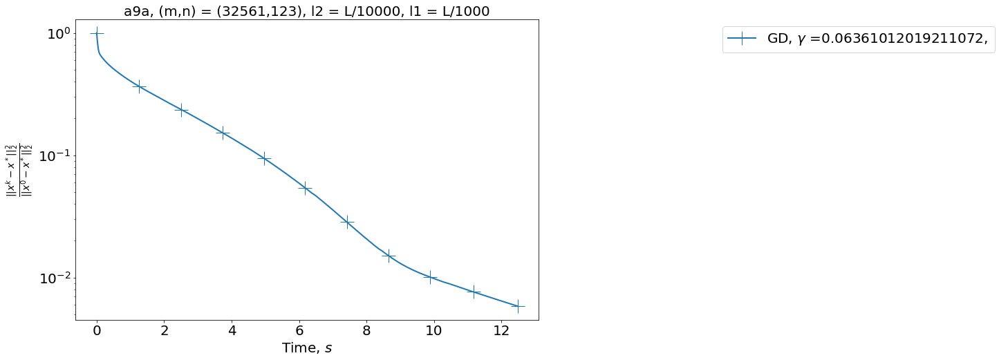

 11%|█         | 1/9 [00:00<00:01,  4.53it/s]

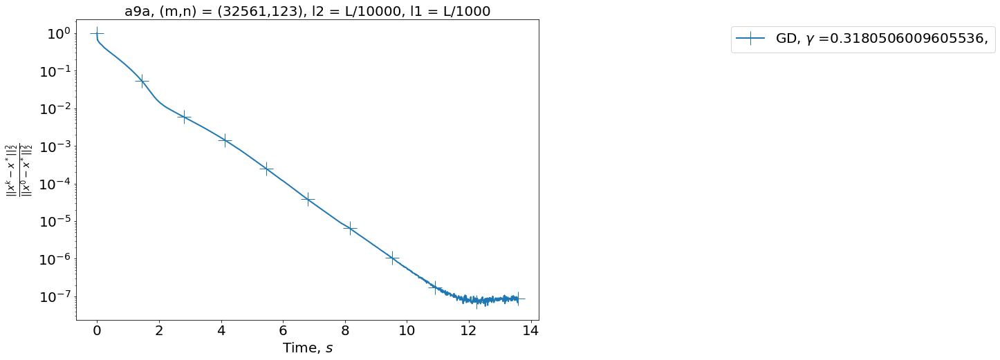

 22%|██▏       | 2/9 [00:00<00:01,  3.64it/s]

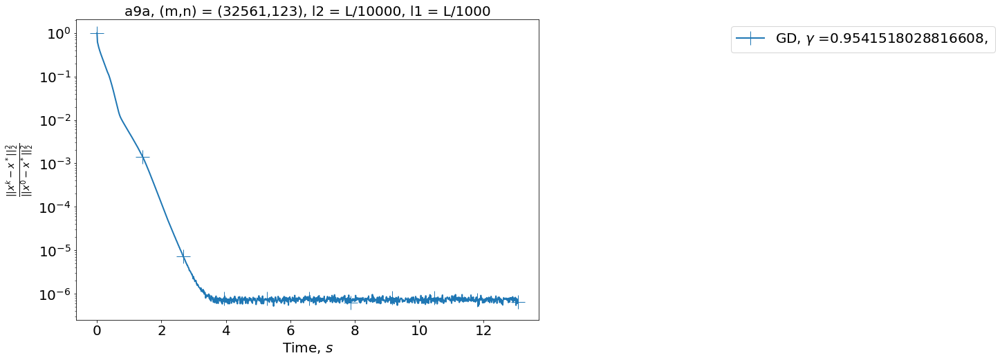

 33%|███▎      | 3/9 [00:00<00:01,  3.53it/s]

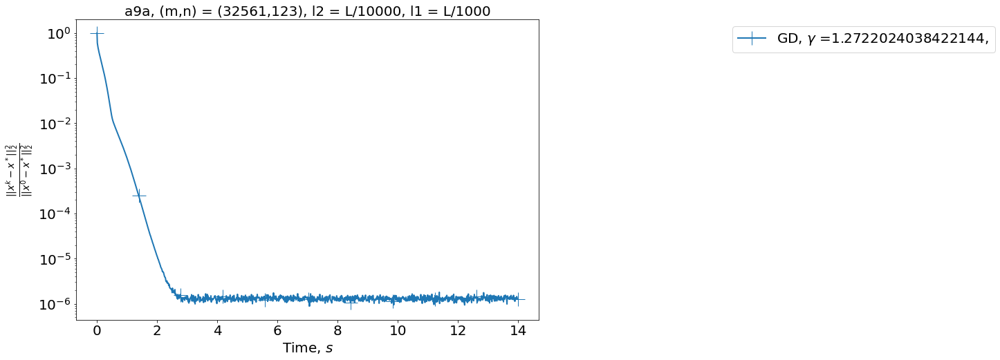

 44%|████▍     | 4/9 [00:01<00:01,  3.41it/s]

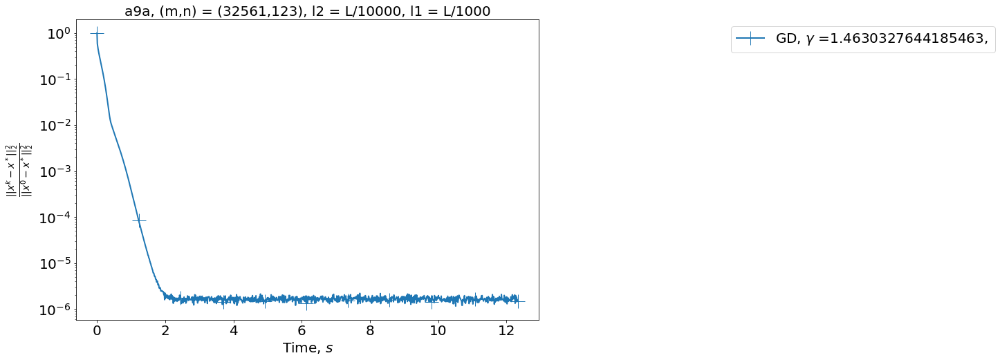

 56%|█████▌    | 5/9 [00:01<00:01,  3.28it/s]

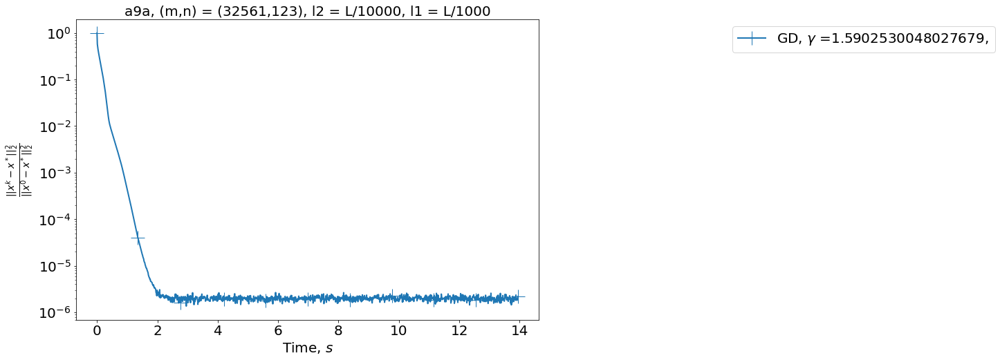

 67%|██████▋   | 6/9 [00:01<00:00,  3.02it/s]

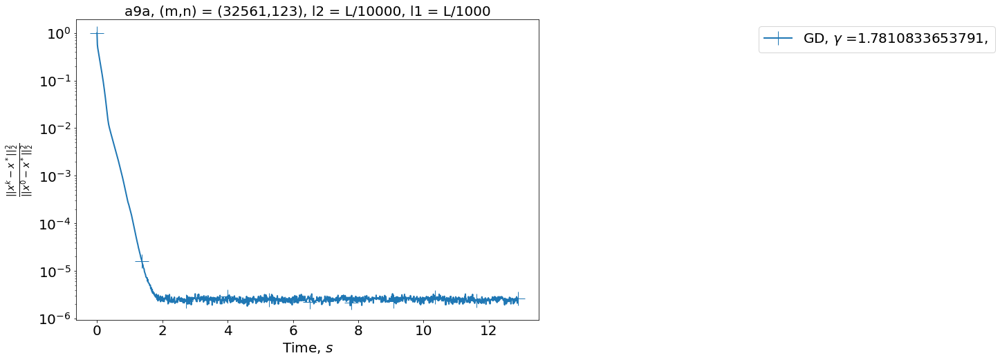

 78%|███████▊  | 7/9 [00:02<00:00,  3.06it/s]

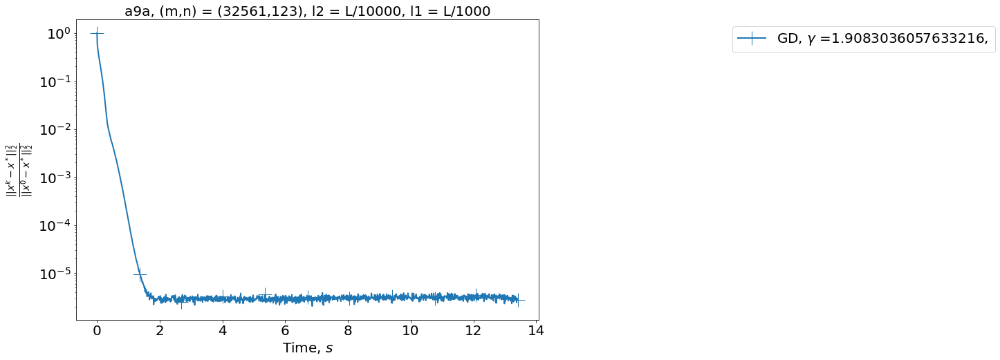

 89%|████████▉ | 8/9 [00:02<00:00,  3.13it/s]

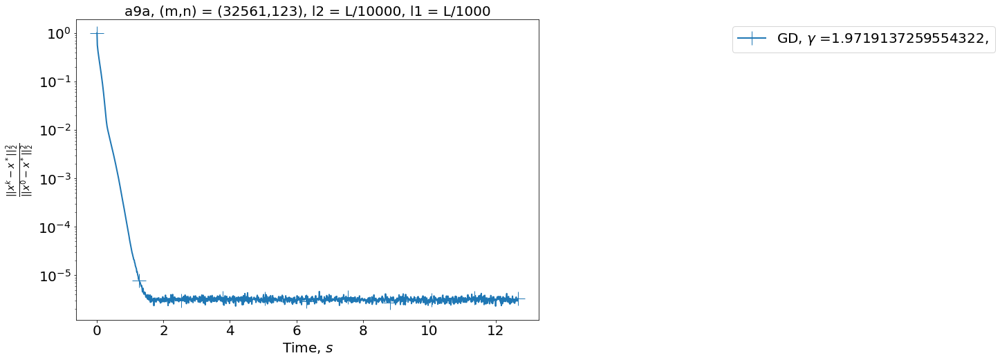

100%|██████████| 9/9 [00:02<00:00,  3.13it/s]


In [54]:
for g in tqdm(gamma_arr):
    gamma = g / (L + l2)
    methods = [
             ['GD', [gamma,l2, l1, S], 
               f', $\gamma$ ={gamma}, ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

Возьмем $\gamma$ = 1.453

## Задание 7. Сравнение методов

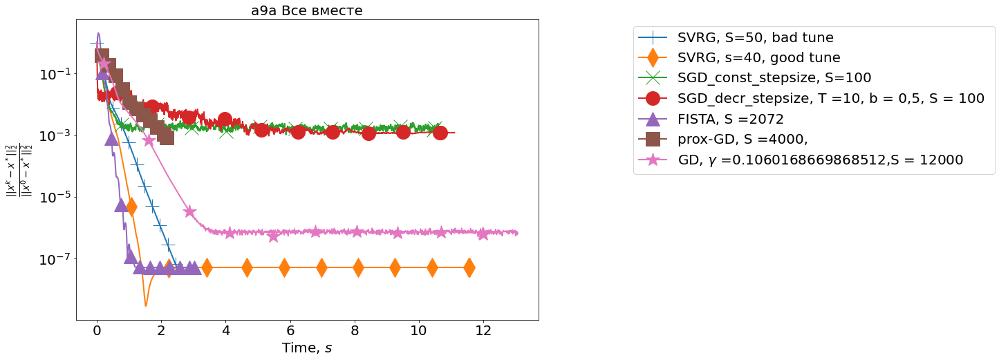

In [61]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 100
gamma = 1.0/(6*(L+l2))
S=50
methods = [
    ['SVRG', [gamma, L / 10000, L / 1000, 50, int(2*m/100), 100], f', S=50, bad tune', None],
    ['SVRG', [gamma, L/10000, L / 1000, 40, int(2*m/10), 10], f', s=40, good tune', None],
    ['SGD_const_stepsize', [0.1/((L+l2)), l2, l1, 100, 10], f', S=100 ', None],
    ['SGD_decr_stepsize', [[10/(6*(L+l2)), 10, 0.5], l2, l1, 100, 10], f', T =10, b = 0,5, S = 100 ', None],
    ['FISTA', [l2, l1, 2076], f', S =2072 ', None],
    ['prox-GD', [1/L, l2, l1, 2076], f', S =4000, ', None],
    ['GD', [1.5/((L+l2)),l2, l1, 12000], f', $\gamma$ ={gamma},S = 12000 ', None]
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+" Все вместе"

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

## Задание 8. Эксперименты с другими датасетами

### 8.1 Australian

#### 8.1.1 Australian SVRG

In [28]:
%%time
arr_l2 = [L / 100000, L / 10000, L / 1000]
for l2_ in tqdm(arr_l2):
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = None
    f_star = None
    S = 1000
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [14:14<00:00, 284.94s/it]

CPU times: user 14min 14s, sys: 56 ms, total: 14min 14s
Wall time: 14min 14s


In [61]:
%%time
r_arr = [1, 10, 100]
for r in tqdm(r_arr):
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2, l1)[0]
    f_star = read_solution(dataset, l2, l1)[1]
    S = 50
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [02:21<00:00, 47.15s/it] 

CPU times: user 2min 21s, sys: 96 ms, total: 2min 21s
Wall time: 2min 21s


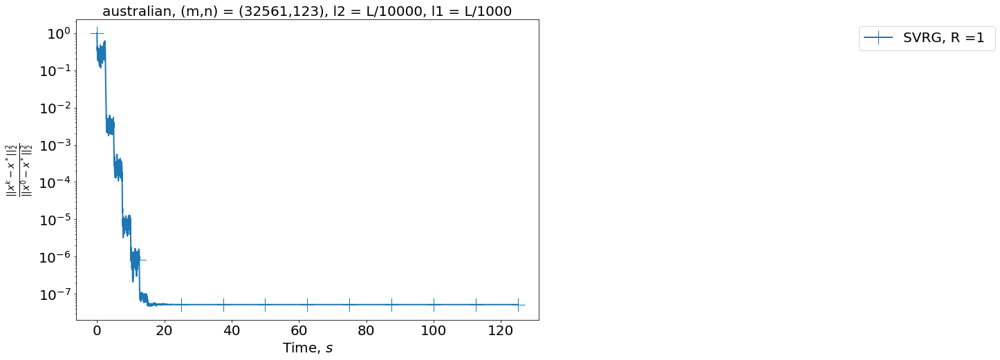

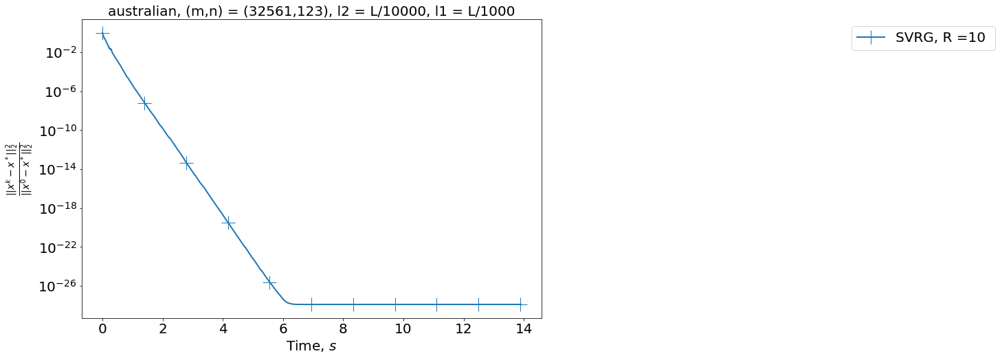

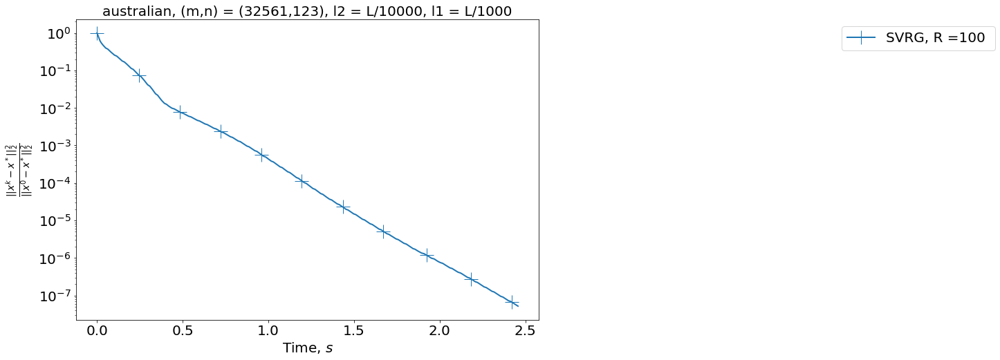

In [62]:
for r in r_arr:
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), r], 
               f', R ={r} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [63]:
%%time
for l2_ in arr_l2:
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

CPU times: user 33.7 s, sys: 4 ms, total: 33.7 s
Wall time: 33.7 s


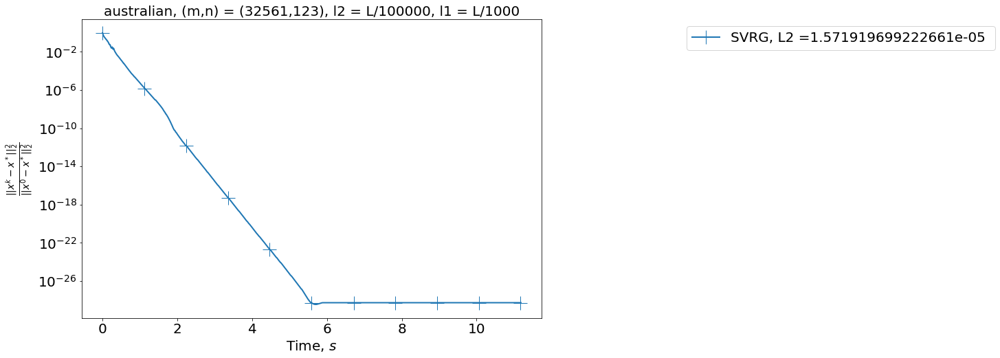

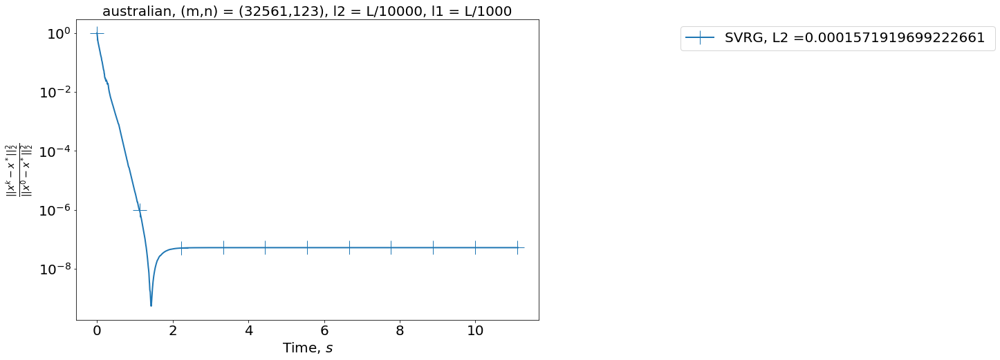

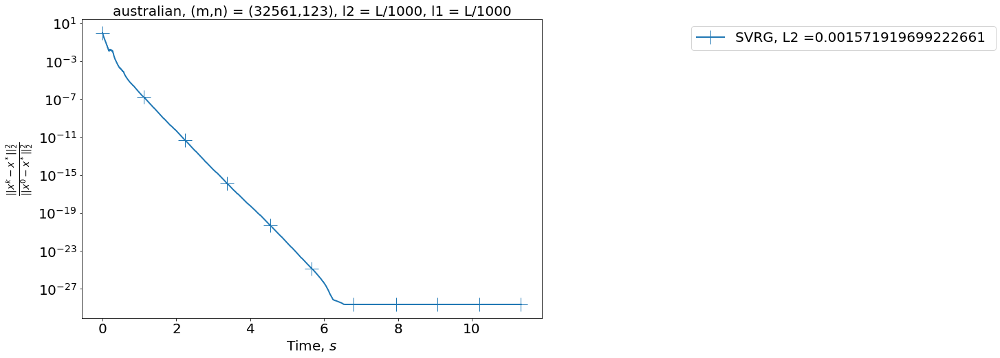

CPU times: user 603 ms, sys: 8 ms, total: 611 ms
Wall time: 615 ms


In [59]:
%%time
for l2_ in arr_l2:
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [52]:
%%time
for l2_ in tqdm(arr_l2):
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

100%|██████████| 3/3 [00:33<00:00, 11.22s/it]

CPU times: user 33.6 s, sys: 7.99 ms, total: 33.6 s
Wall time: 33.7 s


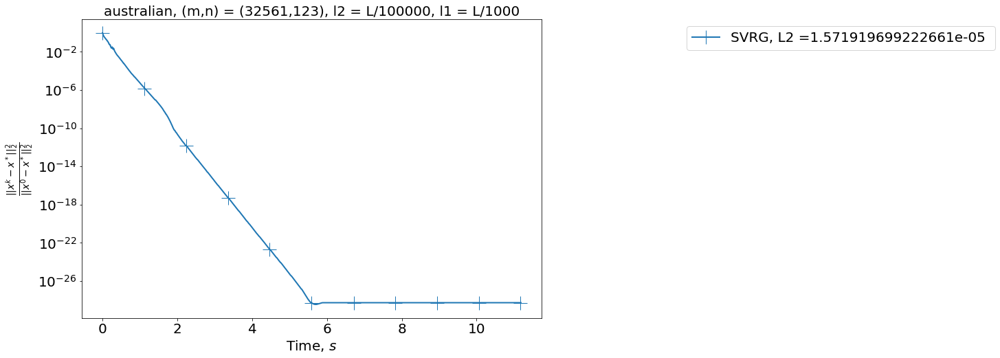

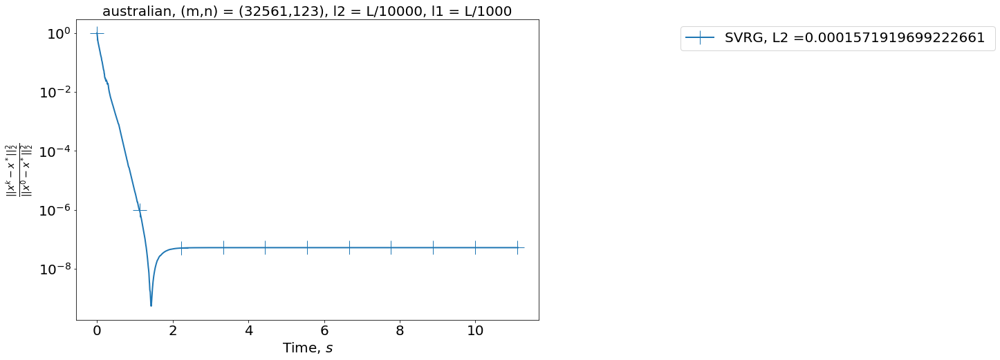

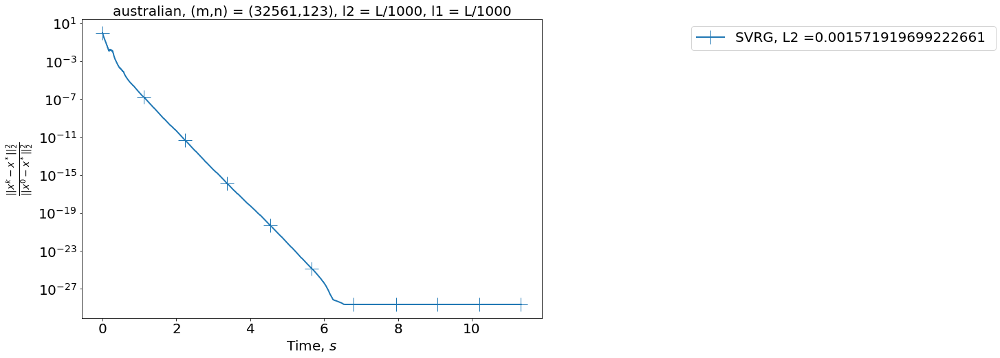

CPU times: user 684 ms, sys: 8 ms, total: 692 ms
Wall time: 691 ms


In [58]:
%%time
for l2_ in arr_l2:
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.1.2 Australian SGD

In [65]:
arr_1 = [1.0,0.1,0.01,0.05]

for a in tqdm(arr_1):
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 4/4 [00:40<00:00, 10.17s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

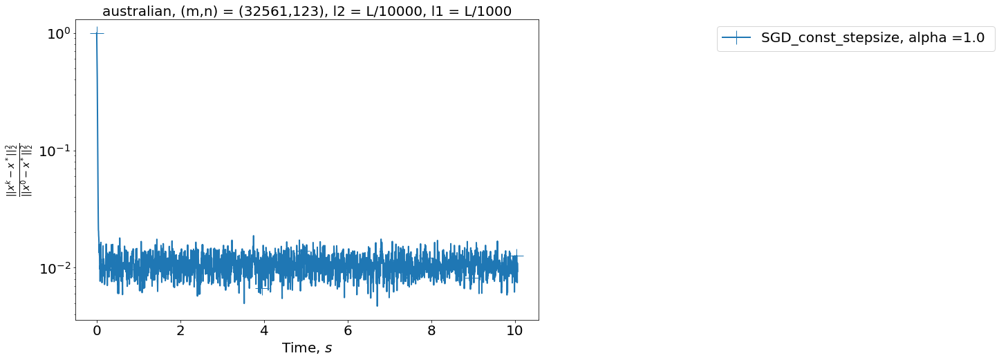

 25%|██▌       | 1/4 [00:00<00:00,  3.07it/s]

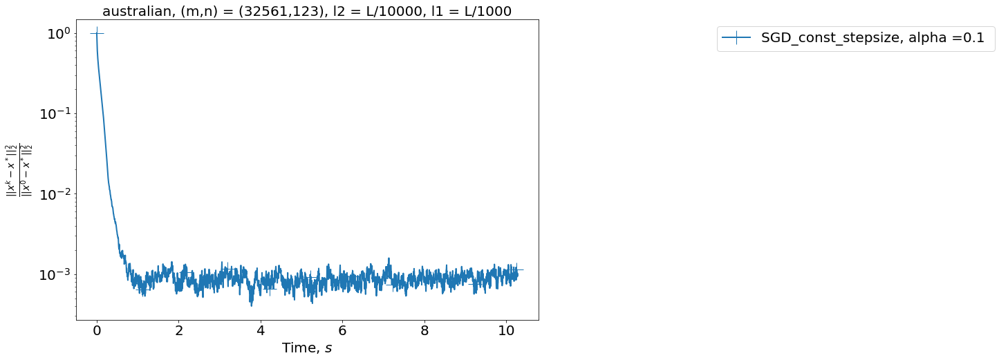

 50%|█████     | 2/4 [00:00<00:00,  3.31it/s]

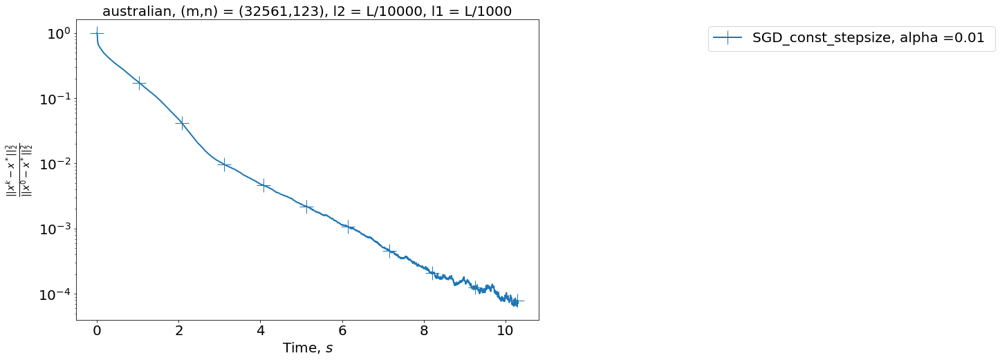

 75%|███████▌  | 3/4 [00:00<00:00,  3.46it/s]

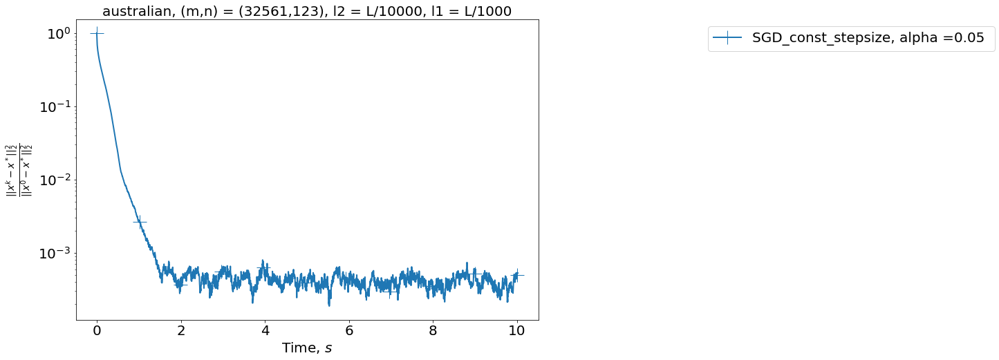

100%|██████████| 4/4 [00:01<00:00,  3.71it/s]


In [66]:
for a in tqdm(arr_1):
    dataset = "australian"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    
    methods = [
             ['SGD_const_stepsize', [gamma, l2, l1, S, 10], 
               f', alpha ={a} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [67]:
gamma = 10 / (6 * (L + l2))
gammas = [[gamma, 10, 0.8],[gamma, 10, 0.5],[gamma, 5, 0.5],[gamma, 5, 0.9],[gamma, 2, 0.9],[gamma, 15, 0.9]]


for schedule in tqdm(gammas):
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 10/(6*(L+l2))
    gamma_schedule = schedule
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 6/6 [00:58<00:00,  9.79s/it]


  0%|          | 0/6 [00:00<?, ?it/s]

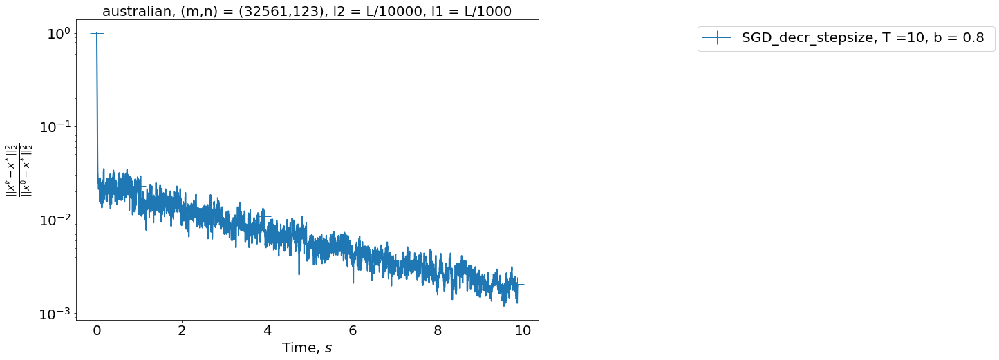

 17%|█▋        | 1/6 [00:00<00:01,  4.20it/s]

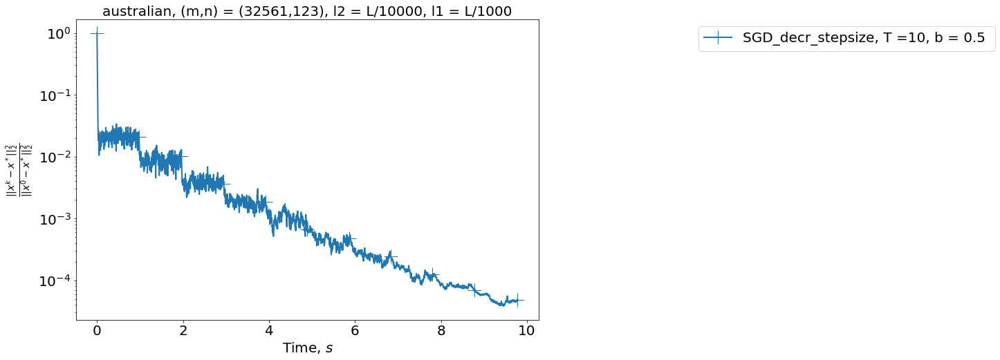

 33%|███▎      | 2/6 [00:00<00:00,  4.03it/s]

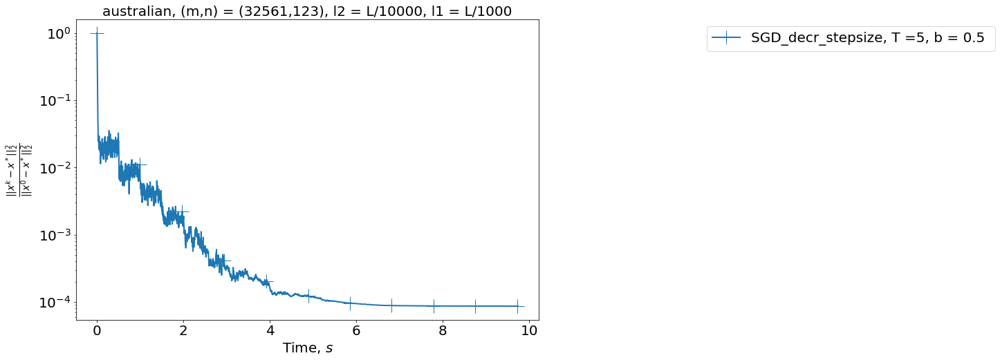

 50%|█████     | 3/6 [00:00<00:00,  3.62it/s]

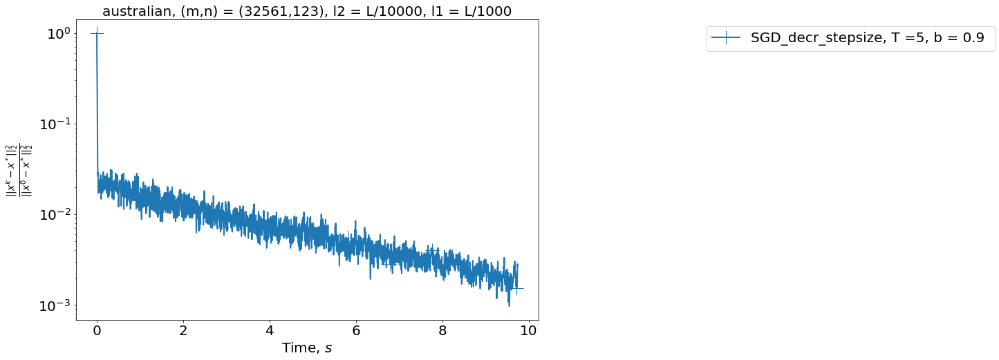

 67%|██████▋   | 4/6 [00:01<00:00,  3.78it/s]

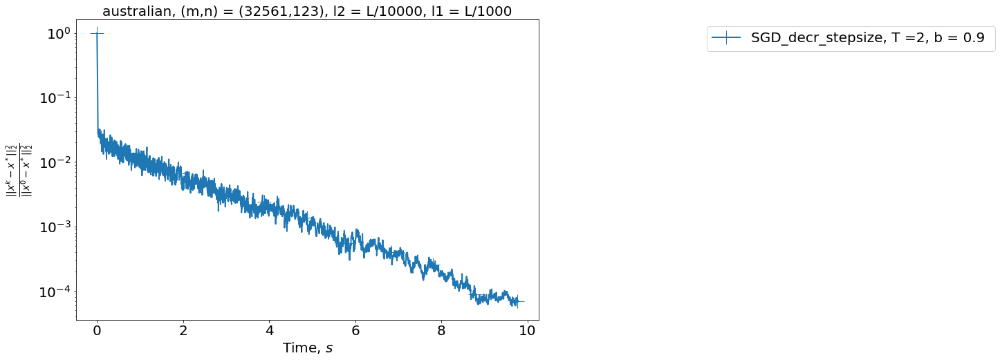

 83%|████████▎ | 5/6 [00:01<00:00,  3.79it/s]

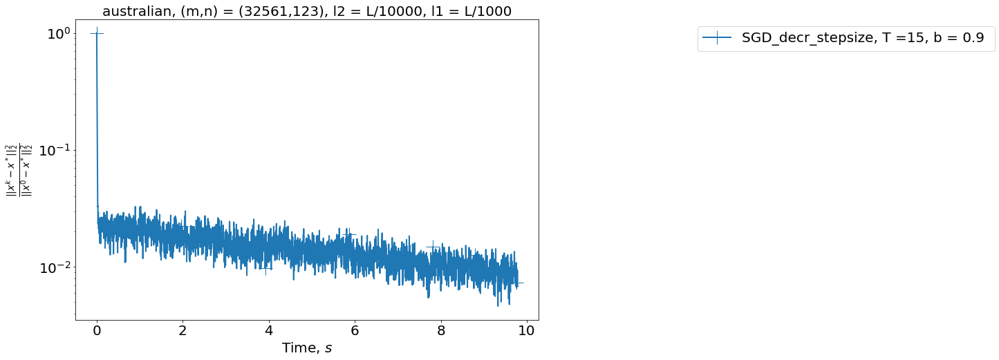

100%|██████████| 6/6 [00:01<00:00,  3.79it/s]


In [68]:
for schedule in tqdm(gammas):
    dataset = "australian"
    filename=dataset + "_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2 * m / batch_size)
    gamma = 10 / (6 * (L + l2))
    gamma_schedule = schedule
    S = 100
    save_info_period = 100
    
    methods = [
             ['SGD_decr_stepsize', [schedule, l2, l1, S, 10], 
               f', T ={schedule[1]}, b = {schedule[2]} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset + ", (m,n) = (" + str(m)+ "," + str(n) + "), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.1.3 Australian L-SVRG

In [69]:
dataset = "australian"
x_init = np.ones(n)
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S=np.sqrt(L/l2)*np.log((delta_f+l2*res['squared_distances'][0])/epsilon)

In [70]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
S = int(S)
save_info_period = 10
sparse = True
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

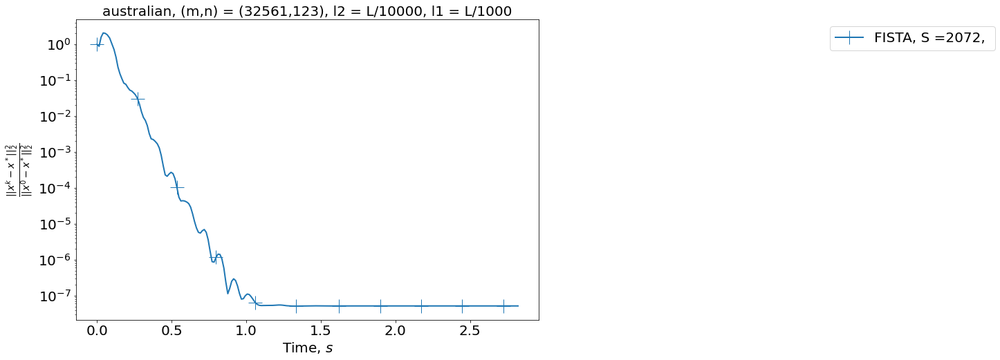

In [71]:

filename=dataset+"_x_init_all_ones"

methods = [
         ['FISTA', [l2, l1, S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

In [72]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
save_info_period = 10


In [73]:
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S = np.sqrt(L / l2) * np.log((delta_f + l2 * res['squared_distances'][0]) / epsilon)
S = int(S)

In [74]:
sparse = False
gamma = 1/L
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

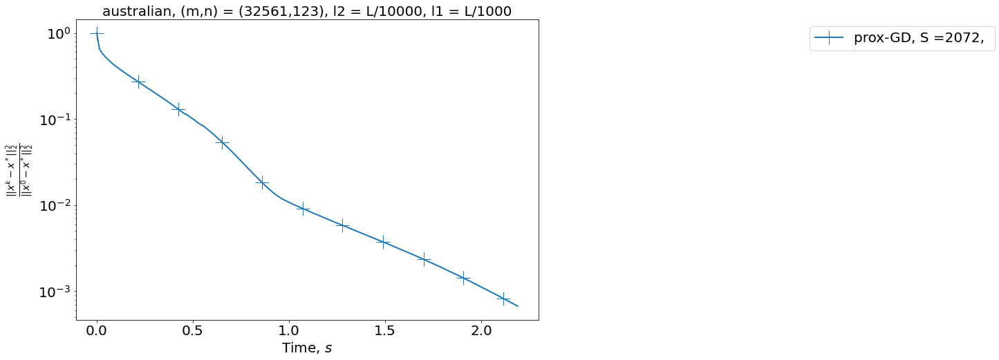

In [75]:

filename=dataset+"_x_init_all_ones"

methods = [
         ['prox-GD', [gamma, l2, l1,S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

сходится хуже предыдущего

In [76]:
gamma_arr = [0.1, 0.5, 1.5, 2., 2.3, 2.5, 2.8, 3, 3.1]

In [77]:
for g in tqdm(gamma_arr):
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    gamma = g / (L + l2)
    S = 12000
    save_info_period = 10
    sparse = False
    res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
         sparse=sparse, l1=l1, S=S, max_t=np.inf,
         save_info_period=save_info_period, 
         x_star=x_star, f_star=f_star)

100%|██████████| 9/9 [01:53<00:00, 12.61s/it]


  0%|          | 0/9 [00:00<?, ?it/s]

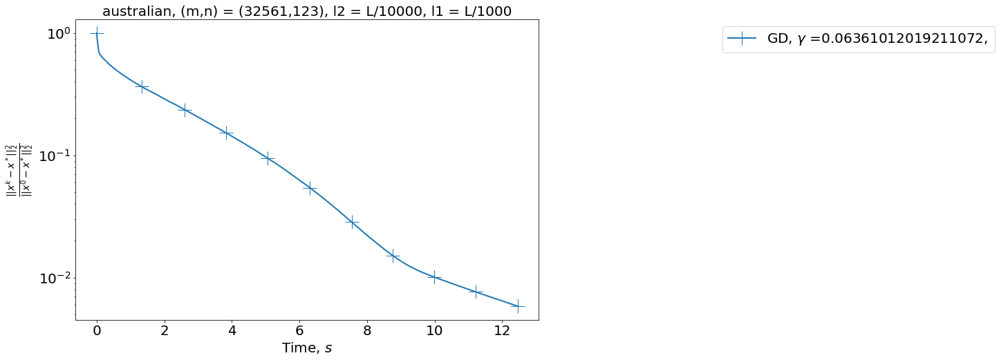

 11%|█         | 1/9 [00:00<00:01,  4.55it/s]

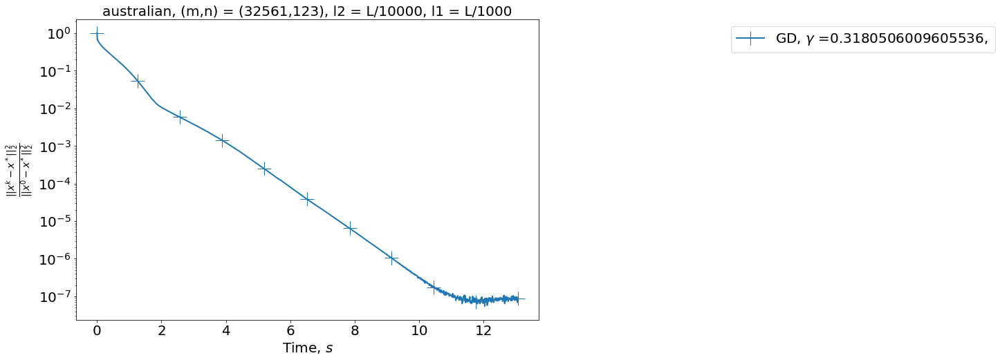

 22%|██▏       | 2/9 [00:00<00:01,  3.95it/s]

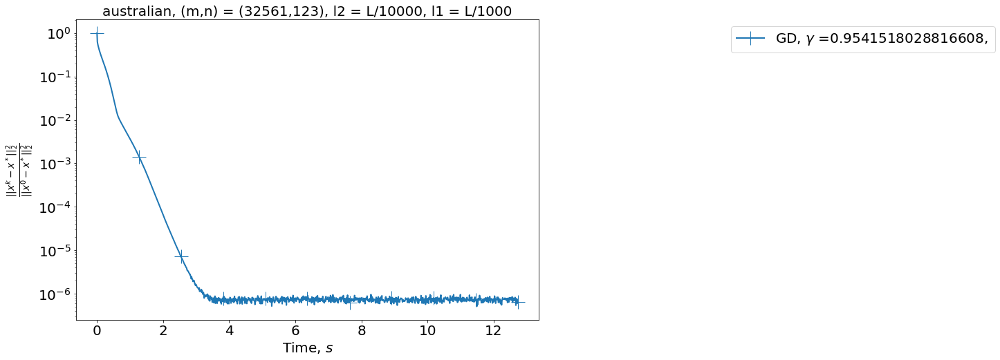

 33%|███▎      | 3/9 [00:00<00:01,  3.65it/s]

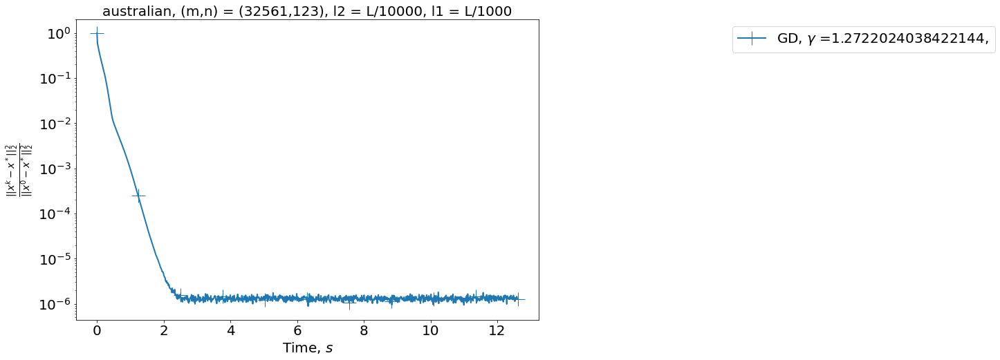

 44%|████▍     | 4/9 [00:01<00:01,  3.17it/s]

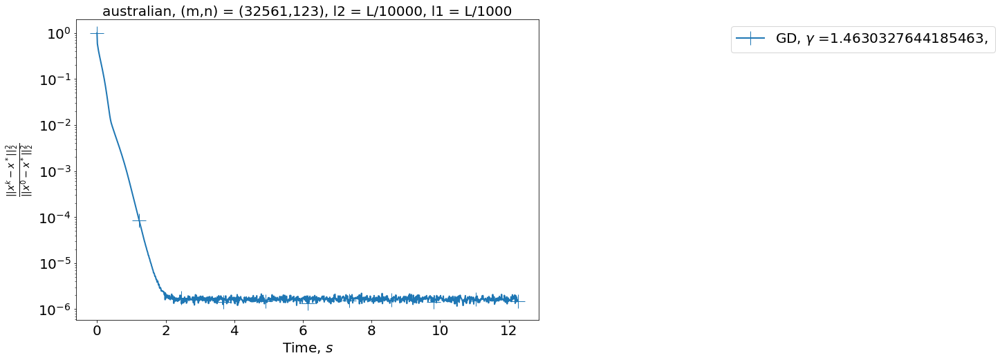

 56%|█████▌    | 5/9 [00:01<00:01,  3.14it/s]

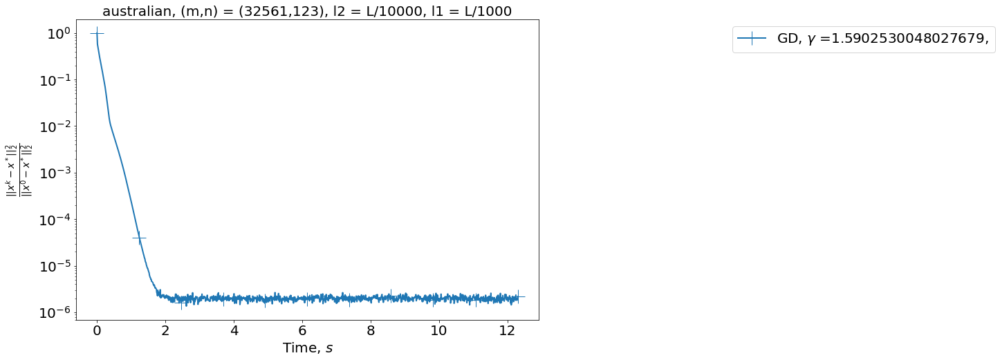

 67%|██████▋   | 6/9 [00:01<00:00,  3.15it/s]

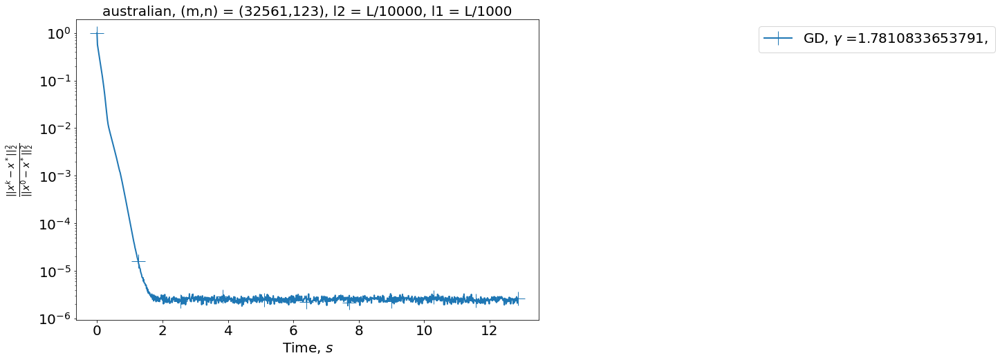

 78%|███████▊  | 7/9 [00:02<00:00,  3.14it/s]

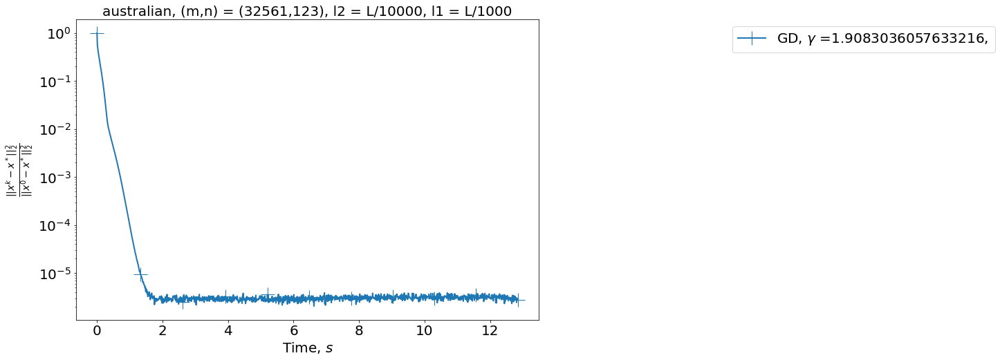

 89%|████████▉ | 8/9 [00:02<00:00,  3.21it/s]

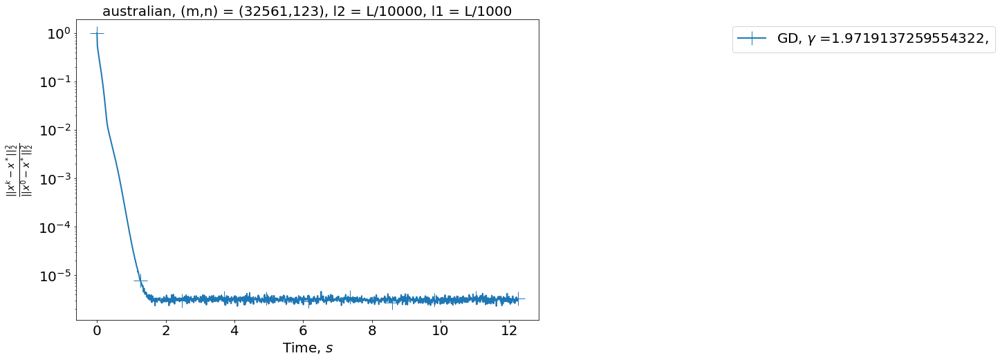

100%|██████████| 9/9 [00:02<00:00,  3.08it/s]


In [78]:
for g in tqdm(gamma_arr):
    gamma = g / (L + l2)
    methods = [
             ['GD', [gamma,l2, l1, S], 
               f', $\gamma$ ={gamma}, ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.1.4 Сравнение

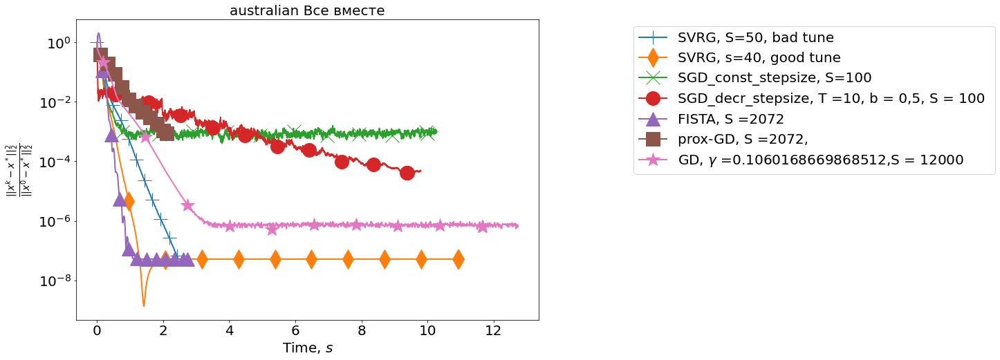

In [82]:
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 100
gamma = 1.0/(6*(L+l2))
S=50
methods = [
    ['SVRG', [gamma, L / 10000, L / 1000, 50, int(2*m/100), 100], f', S=50, bad tune', None],
    ['SVRG', [gamma, L/10000, L / 1000, 40, int(2*m/10), 10], f', s=40, good tune', None],
    ['SGD_const_stepsize', [0.1/((L+l2)), l2, l1, 100, 10], f', S=100 ', None],
    ['SGD_decr_stepsize', [[10/(6*(L+l2)), 10, 0.5], l2, l1, 100, 10], f', T =10, b = 0,5, S = 100 ', None],
    ['FISTA', [l2, l1, 2072], f', S =2072 ', None],
    ['prox-GD', [1/L, l2, l1, 2072], f', S =2072, ', None],
    ['GD', [1.5/((L+l2)),l2, l1, 12000], f', $\gamma$ ={gamma},S = 12000 ', None]
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+" Все вместе"

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### 8.2 Gisette

#### 8.2.1 Gisette SVRG

In [83]:
%%time
arr_l2 = [L / 100000, L / 10000, L / 1000]
for l2_ in tqdm(arr_l2):
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = None
    f_star = None
    S = 1000
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [14:13<00:00, 284.48s/it]

CPU times: user 14min 12s, sys: 108 ms, total: 14min 13s
Wall time: 14min 13s


In [84]:
%%time
r_arr = [1, 10, 100]
for r in tqdm(r_arr):
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2, l1)[0]
    f_star = read_solution(dataset, l2, l1)[1]
    S = 50
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [02:25<00:00, 48.34s/it] 

CPU times: user 2min 24s, sys: 84 ms, total: 2min 24s
Wall time: 2min 25s


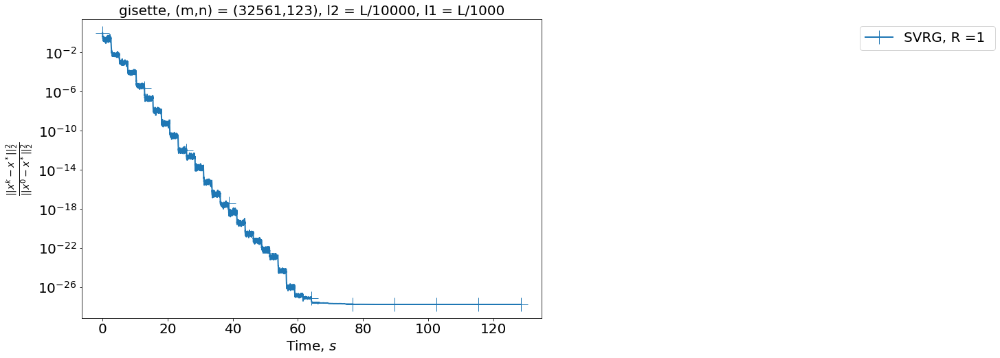

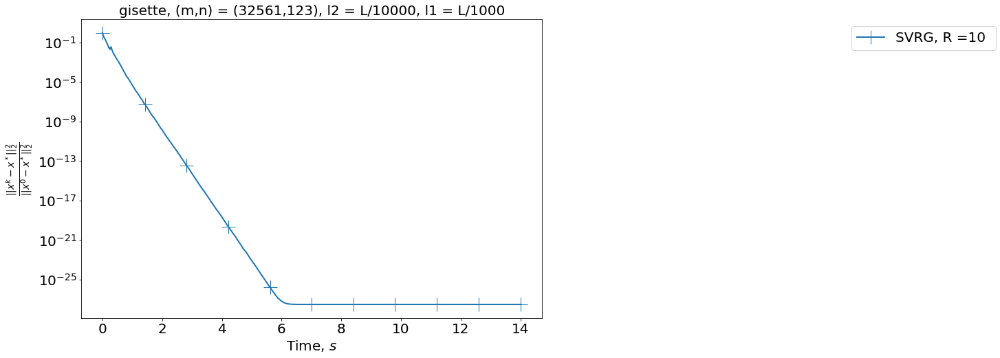

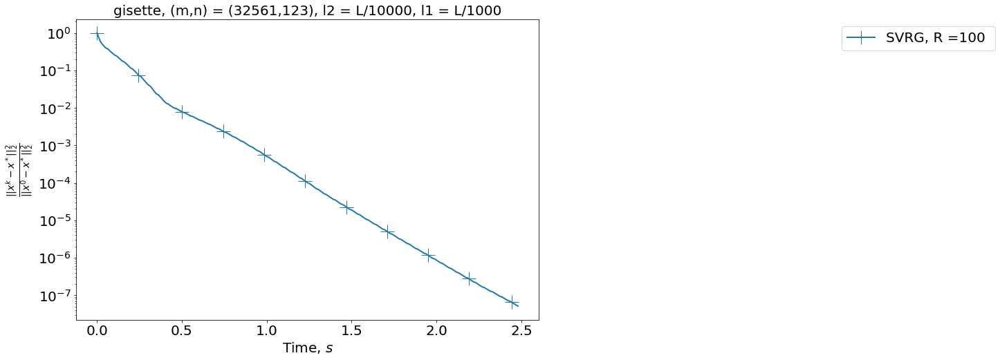

In [85]:
for r in r_arr:
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), r], 
               f', R ={r} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [86]:
%%time
for l2_ in arr_l2:
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

CPU times: user 33.8 s, sys: 0 ns, total: 33.8 s
Wall time: 33.8 s


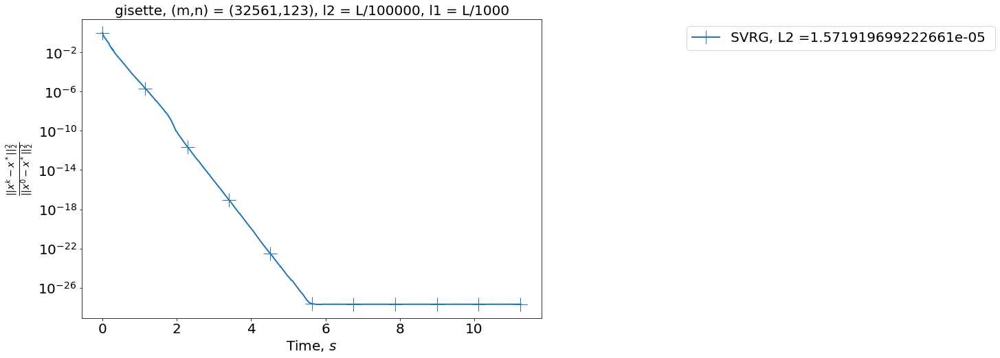

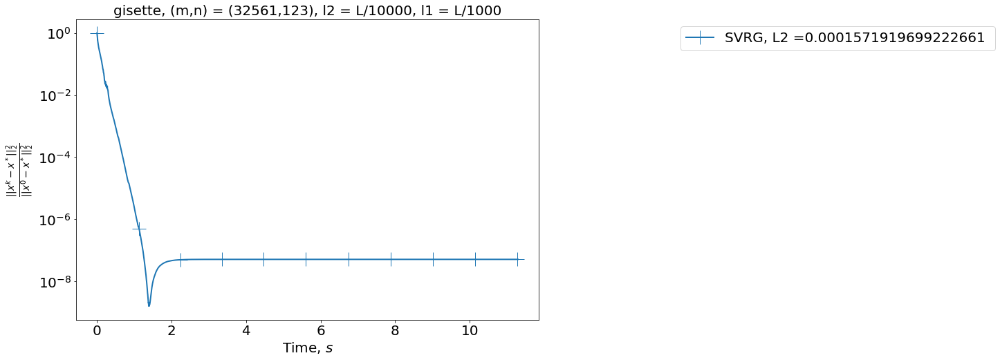

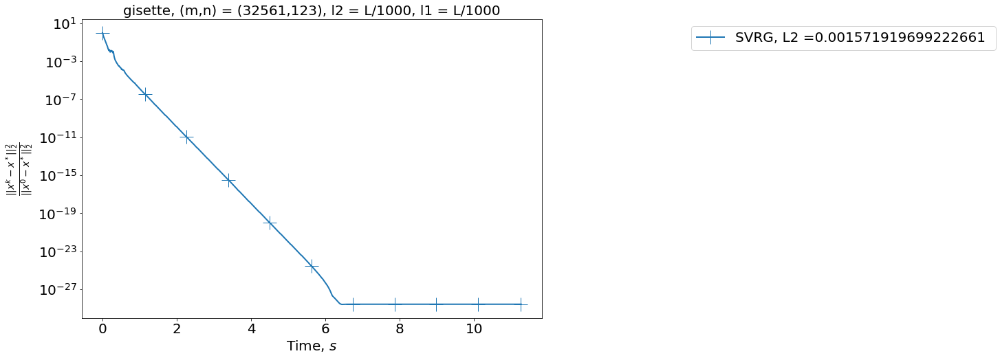

CPU times: user 543 ms, sys: 0 ns, total: 543 ms
Wall time: 542 ms


In [87]:
%%time
for l2_ in arr_l2:
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [90]:
%%time
for l2_ in tqdm(arr_l2):
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

100%|██████████| 3/3 [00:33<00:00, 11.27s/it]

CPU times: user 33.8 s, sys: 4 ms, total: 33.8 s
Wall time: 33.8 s


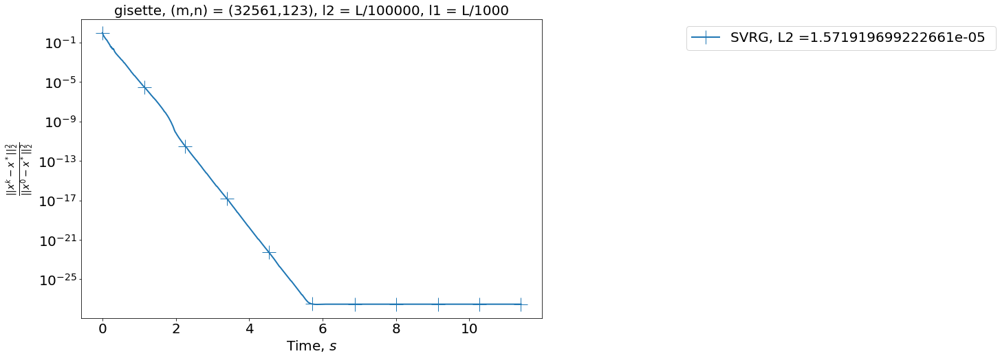

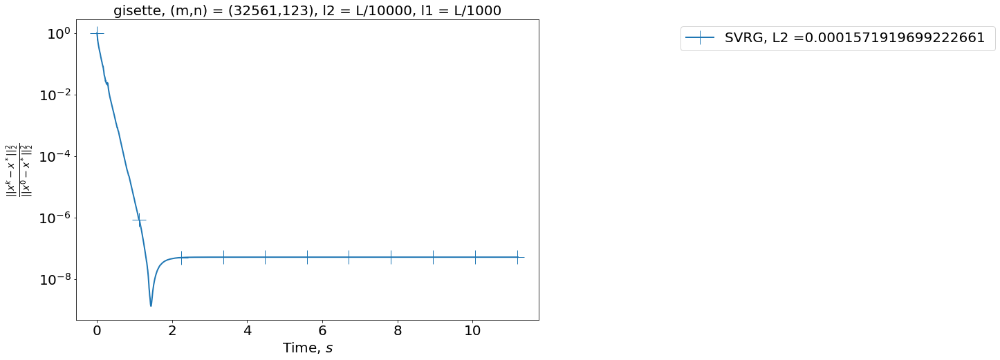

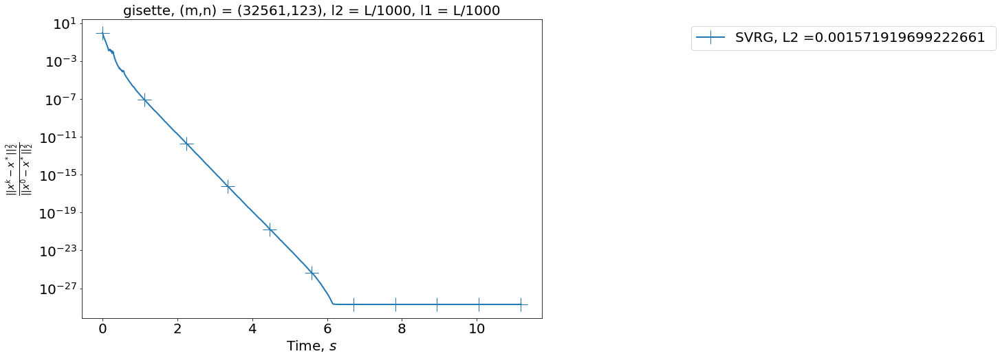

CPU times: user 617 ms, sys: 0 ns, total: 617 ms
Wall time: 614 ms


In [91]:
%%time
for l2_ in arr_l2:
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.2.2 Gisette SGD

In [92]:
arr_1 = [1.0,0.1,0.01,0.05]

for a in tqdm(arr_1):
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 4/4 [00:39<00:00,  9.85s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

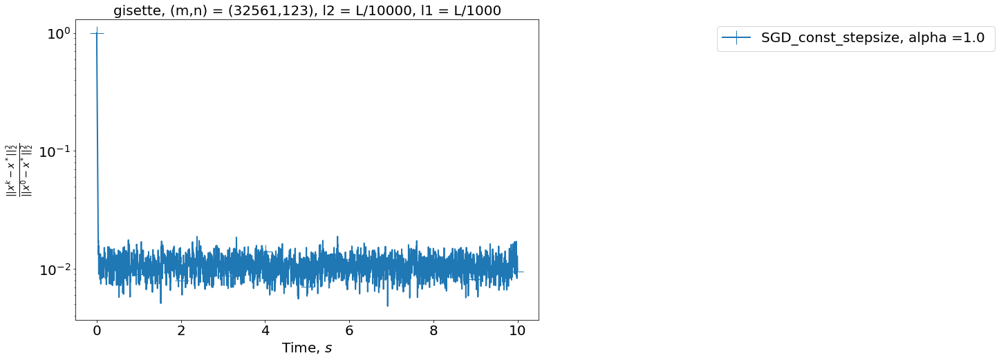

 25%|██▌       | 1/4 [00:00<00:00,  4.50it/s]

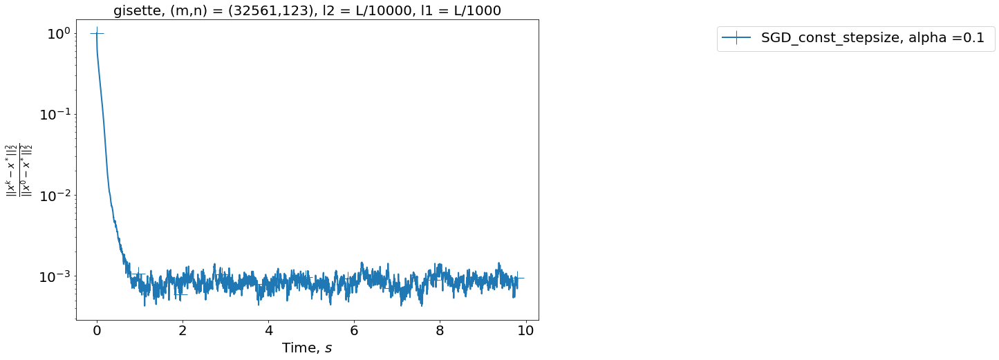

 50%|█████     | 2/4 [00:00<00:00,  4.39it/s]

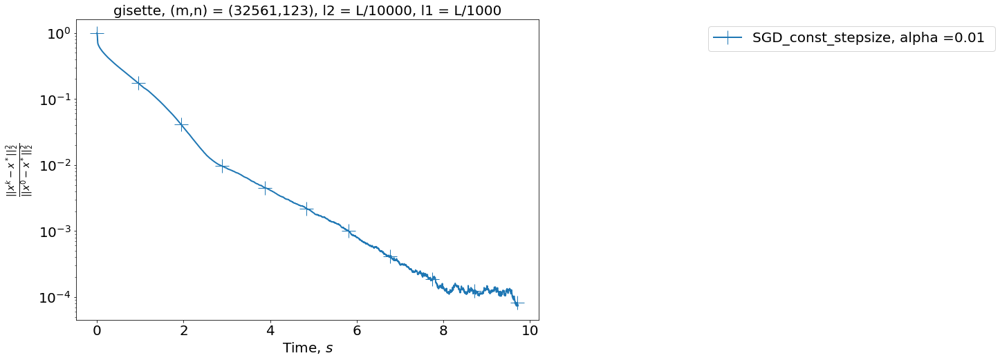

 75%|███████▌  | 3/4 [00:00<00:00,  4.13it/s]

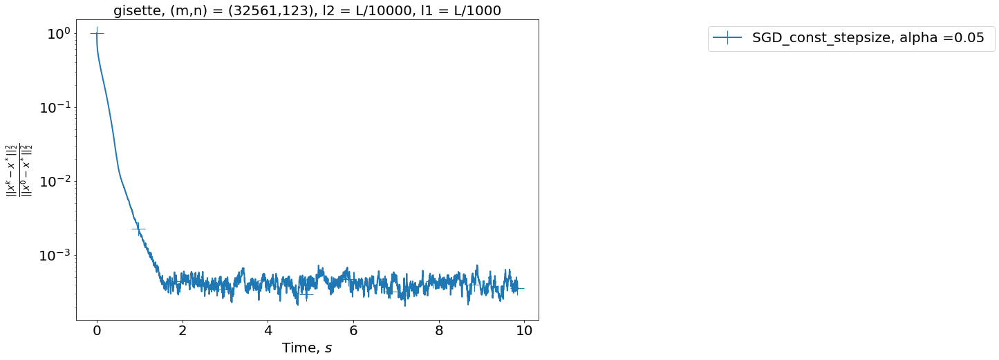

100%|██████████| 4/4 [00:01<00:00,  3.77it/s]


In [93]:
for a in tqdm(arr_1):
    dataset = "gisette"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    
    methods = [
             ['SGD_const_stepsize', [gamma, l2, l1, S, 10], 
               f', alpha ={a} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [94]:
gamma = 10 / (6 * (L + l2))
gammas = [[gamma, 10, 0.8],[gamma, 10, 0.5],[gamma, 5, 0.5],[gamma, 5, 0.9],[gamma, 2, 0.9],[gamma, 15, 0.9]]


for schedule in tqdm(gammas):
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 10/(6*(L+l2))
    gamma_schedule = schedule
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 6/6 [00:59<00:00,  9.92s/it]


  0%|          | 0/6 [00:00<?, ?it/s]

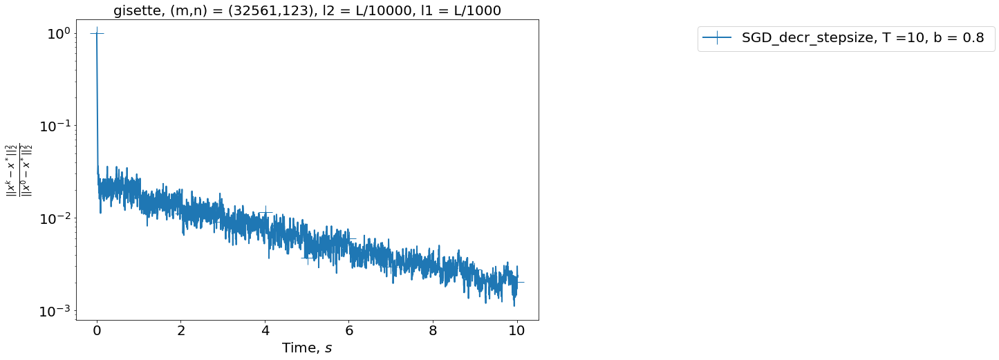

 17%|█▋        | 1/6 [00:00<00:01,  4.14it/s]

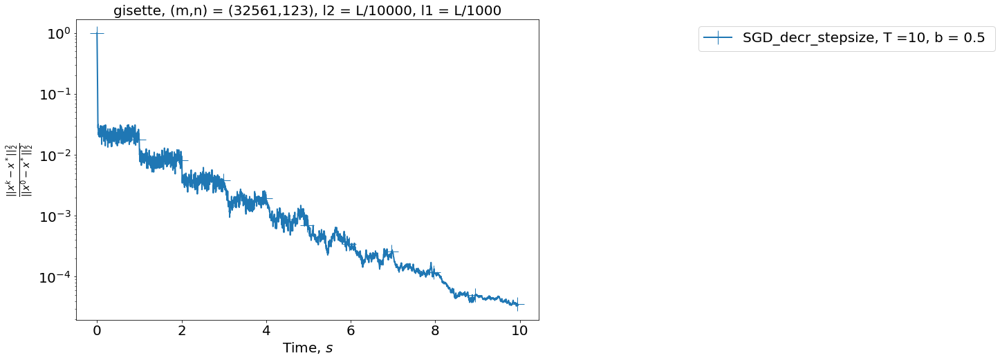

 33%|███▎      | 2/6 [00:00<00:00,  4.00it/s]

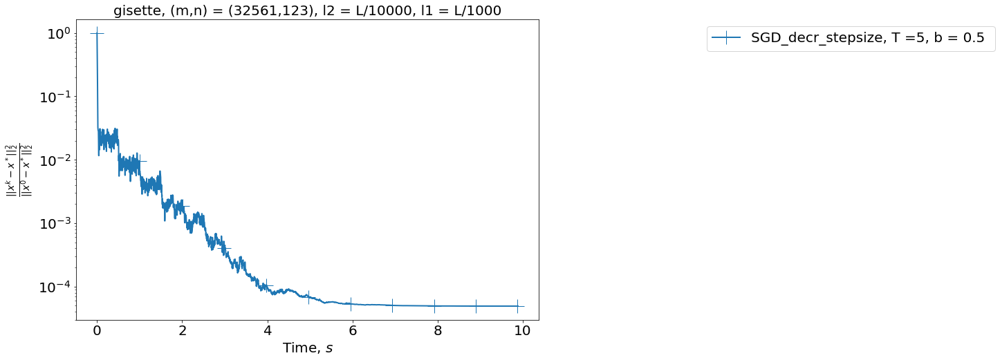

 50%|█████     | 3/6 [00:00<00:00,  3.93it/s]

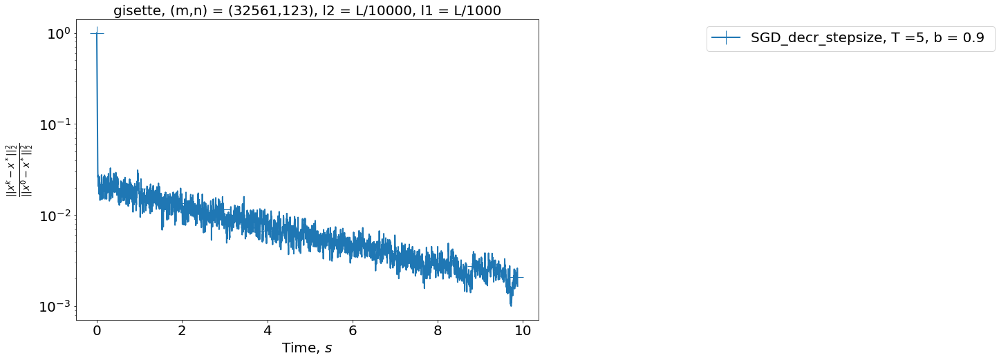

 67%|██████▋   | 4/6 [00:01<00:00,  3.69it/s]

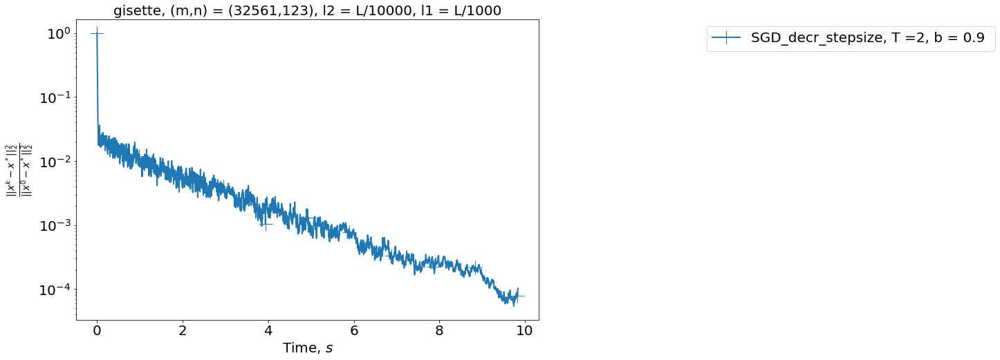

 83%|████████▎ | 5/6 [00:01<00:00,  3.74it/s]

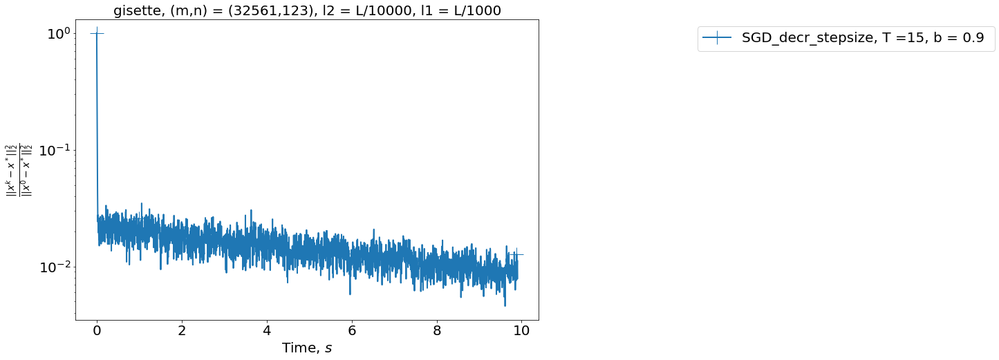

100%|██████████| 6/6 [00:01<00:00,  3.82it/s]


In [95]:
for schedule in tqdm(gammas):
    dataset = "gisette"
    filename=dataset + "_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2 * m / batch_size)
    gamma = 10 / (6 * (L + l2))
    gamma_schedule = schedule
    S = 100
    save_info_period = 100
    
    methods = [
             ['SGD_decr_stepsize', [schedule, l2, l1, S, 10], 
               f', T ={schedule[1]}, b = {schedule[2]} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset + ", (m,n) = (" + str(m)+ "," + str(n) + "), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.2.3 Gisette L-SVRG

In [96]:
dataset = "gisette"
x_init = np.ones(n)
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S=np.sqrt(L/l2)*np.log((delta_f+l2*res['squared_distances'][0])/epsilon)

In [97]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
S = int(S)
save_info_period = 10
sparse = True
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

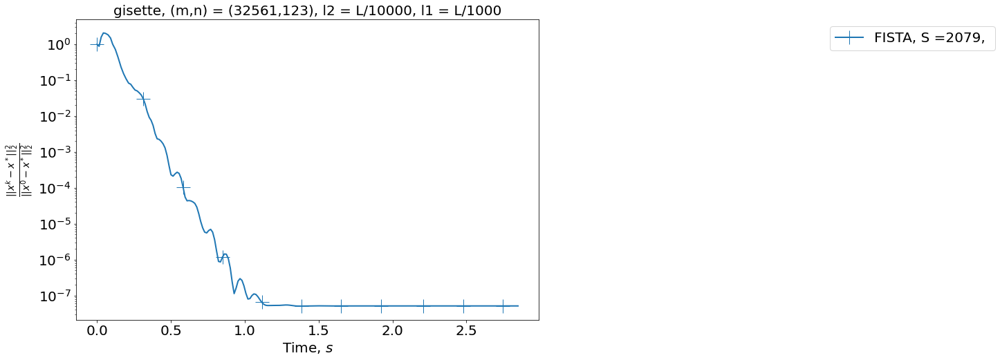

In [98]:

filename=dataset+"_x_init_all_ones"

methods = [
         ['FISTA', [l2, l1, S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

In [99]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
save_info_period = 10


In [100]:
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S = np.sqrt(L / l2) * np.log((delta_f + l2 * res['squared_distances'][0]) / epsilon)
S = int(S)

In [101]:
sparse = False
gamma = 1/L
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

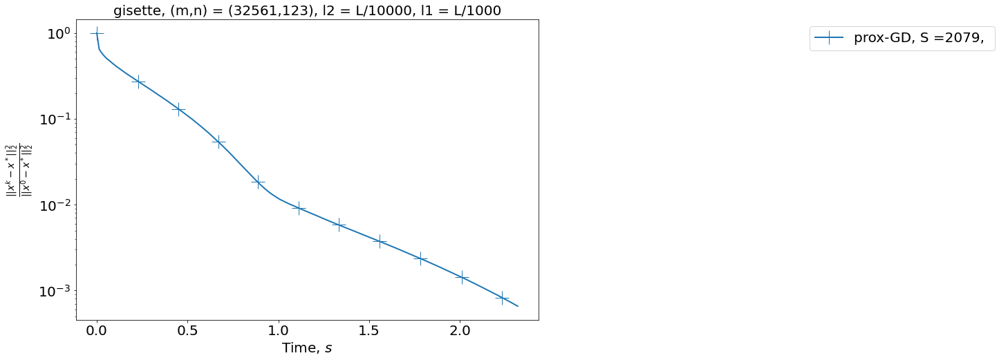

In [102]:

filename=dataset+"_x_init_all_ones"

methods = [
         ['prox-GD', [gamma, l2, l1,S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

сходится хуже предыдущего

In [103]:
gamma_arr = [0.1, 0.5, 1.5, 2., 2.3, 2.5, 2.8, 3, 3.1]

In [104]:
for g in tqdm(gamma_arr):
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    gamma = g / (L + l2)
    S = 12000
    save_info_period = 10
    sparse = False
    res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
         sparse=sparse, l1=l1, S=S, max_t=np.inf,
         save_info_period=save_info_period, 
         x_star=x_star, f_star=f_star)

100%|██████████| 9/9 [02:03<00:00, 13.73s/it]


  0%|          | 0/9 [00:00<?, ?it/s]

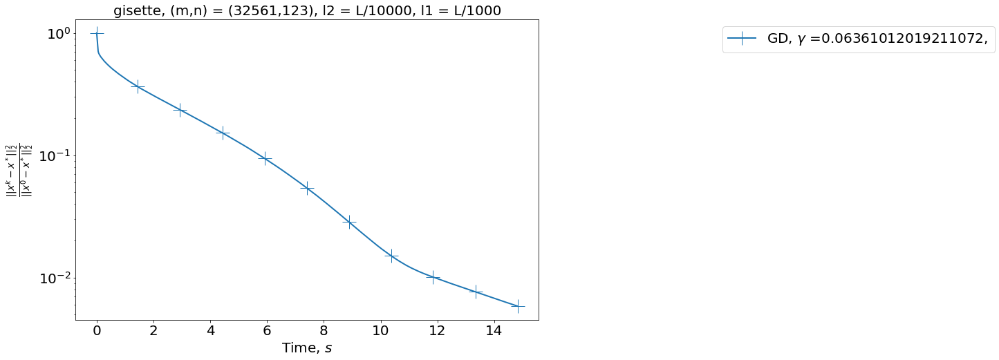

 11%|█         | 1/9 [00:00<00:02,  3.37it/s]

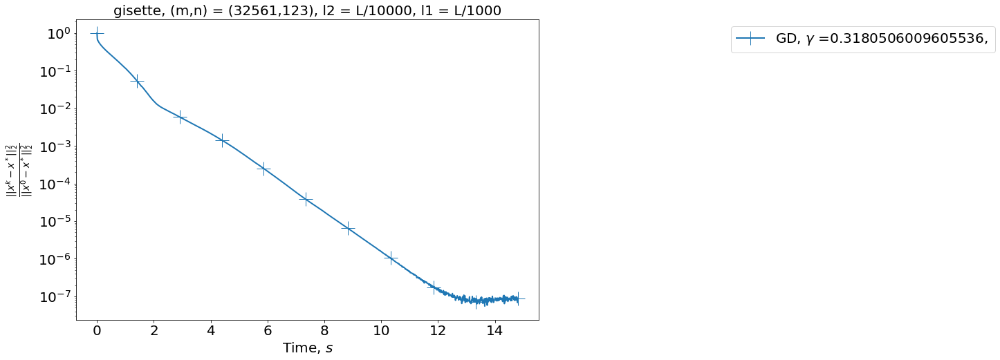

 22%|██▏       | 2/9 [00:00<00:02,  3.21it/s]

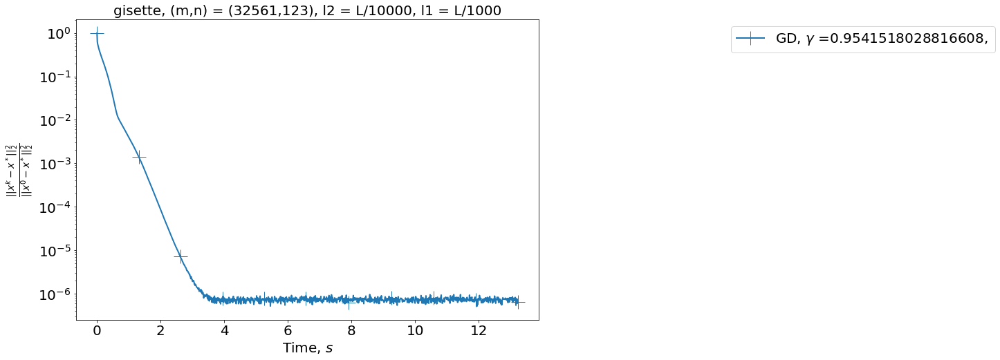

 33%|███▎      | 3/9 [00:00<00:01,  3.21it/s]

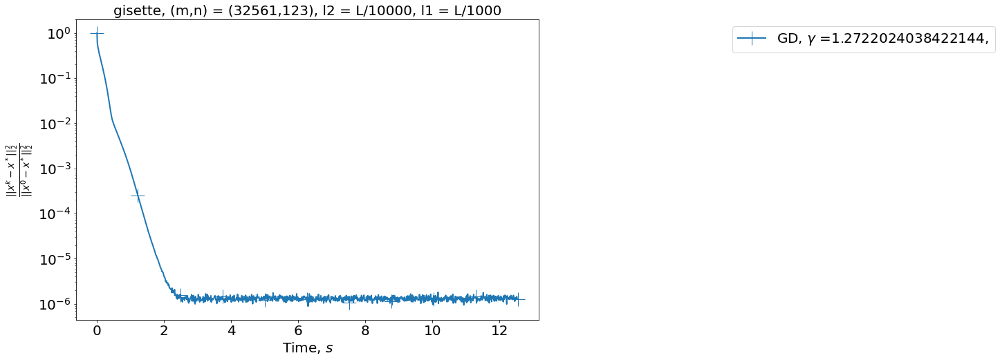

 44%|████▍     | 4/9 [00:01<00:01,  3.20it/s]

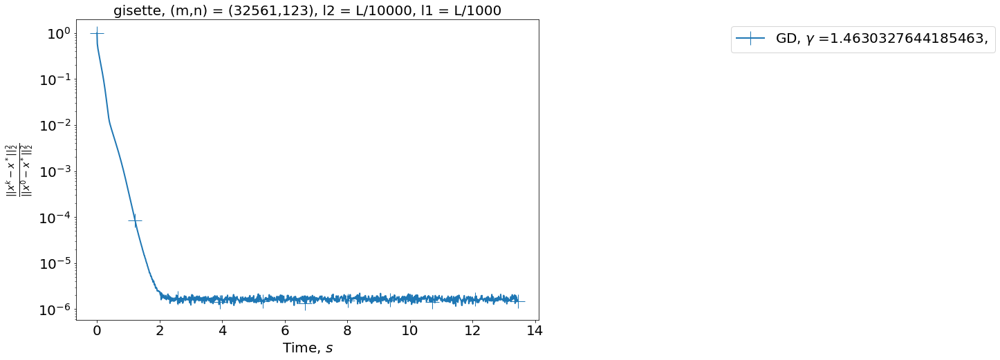

 56%|█████▌    | 5/9 [00:01<00:01,  3.00it/s]

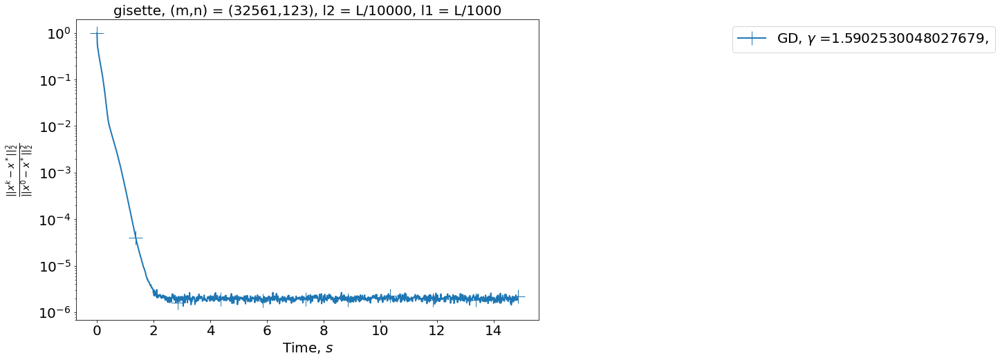

 67%|██████▋   | 6/9 [00:01<00:00,  3.07it/s]

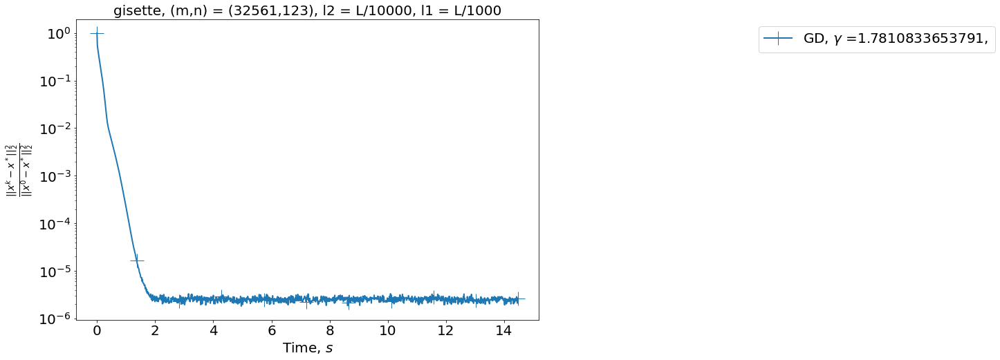

 78%|███████▊  | 7/9 [00:02<00:00,  3.14it/s]

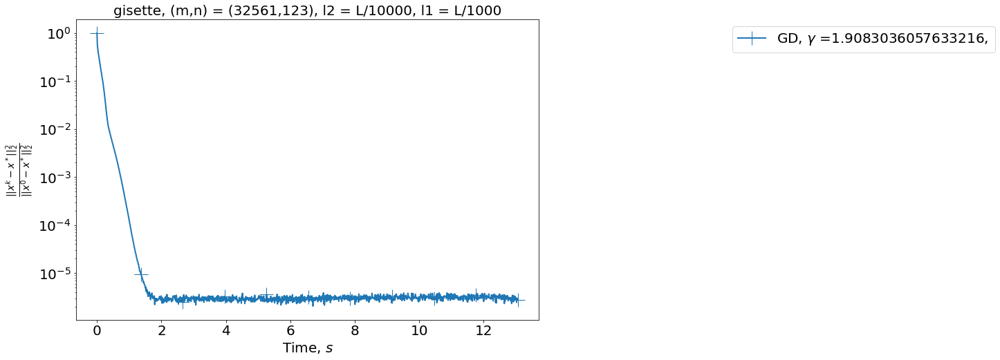

 89%|████████▉ | 8/9 [00:02<00:00,  3.25it/s]

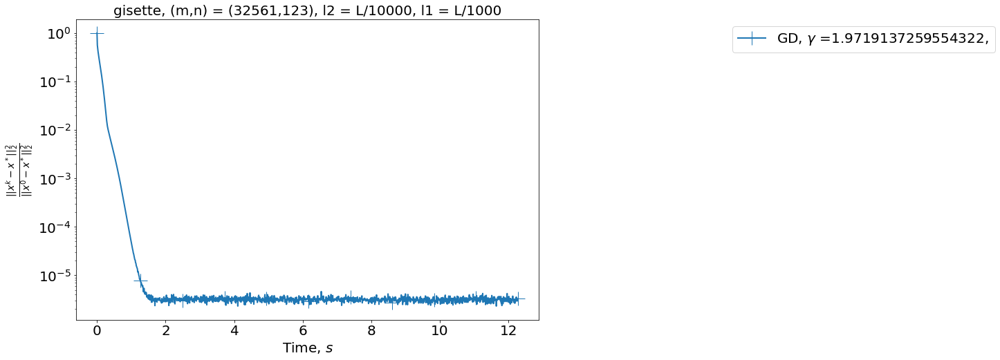

100%|██████████| 9/9 [00:02<00:00,  3.18it/s]


In [105]:
for g in tqdm(gamma_arr):
    gamma = g / (L + l2)
    methods = [
             ['GD', [gamma,l2, l1, S], 
               f', $\gamma$ ={gamma}, ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.2.4 Сравнение

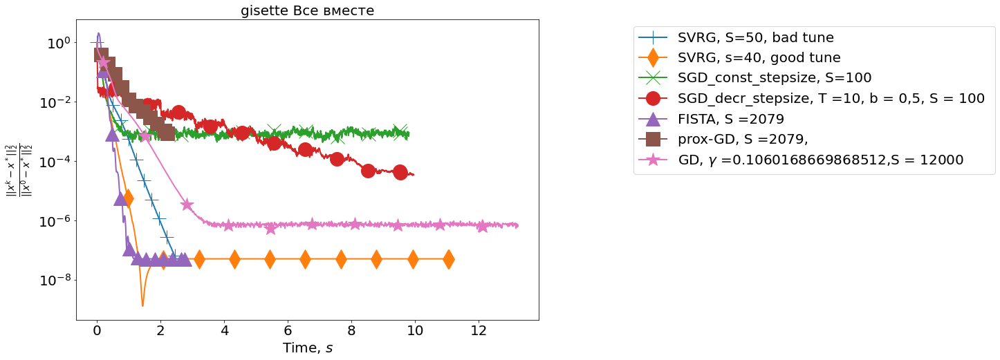

In [108]:
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 100
gamma = 1.0/(6*(L+l2))
S=50
methods = [
    ['SVRG', [gamma, L / 10000, L / 1000, 50, int(2*m/100), 100], f', S=50, bad tune', None],
    ['SVRG', [gamma, L/10000, L / 1000, 40, int(2*m/10), 10], f', s=40, good tune', None],
    ['SGD_const_stepsize', [0.1/((L+l2)), l2, l1, 100, 10], f', S=100 ', None],
    ['SGD_decr_stepsize', [[10/(6*(L+l2)), 10, 0.5], l2, l1, 100, 10], f', T =10, b = 0,5, S = 100 ', None],
    ['FISTA', [l2, l1, 2079], f', S =2079 ', None],
    ['prox-GD', [1/L, l2, l1, 2079], f', S =2079, ', None],
    ['GD', [1.5/((L+l2)),l2, l1, 12000], f', $\gamma$ ={gamma},S = 12000 ', None]
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+" Все вместе"

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### 8.2 german_numer

#### 8.3.1 german_numer SVRG

In [109]:
%%time
arr_l2 = [L / 100000, L / 10000, L / 1000]
for l2_ in tqdm(arr_l2):
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = None
    f_star = None
    S = 1000
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [14:39<00:00, 293.06s/it]

CPU times: user 14min 38s, sys: 140 ms, total: 14min 38s
Wall time: 14min 39s


In [110]:
%%time
r_arr = [1, 10, 100]
for r in tqdm(r_arr):
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2, l1)[0]
    f_star = read_solution(dataset, l2, l1)[1]
    S = 50
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    save_solution(dataset, l2, l1, res['last_iter'], res['func_vals'][-1])

100%|██████████| 3/3 [02:27<00:00, 49.28s/it] 

CPU times: user 2min 27s, sys: 36 ms, total: 2min 27s
Wall time: 2min 27s


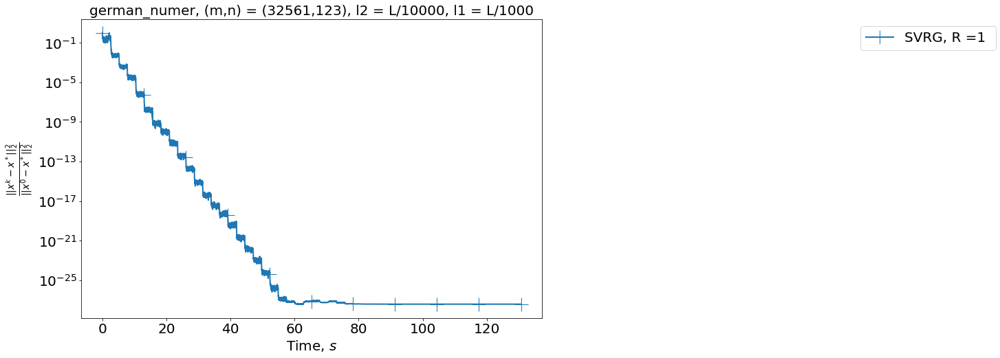

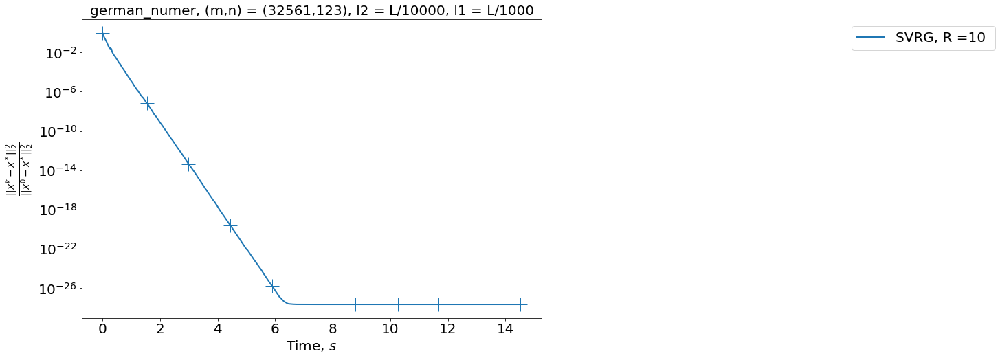

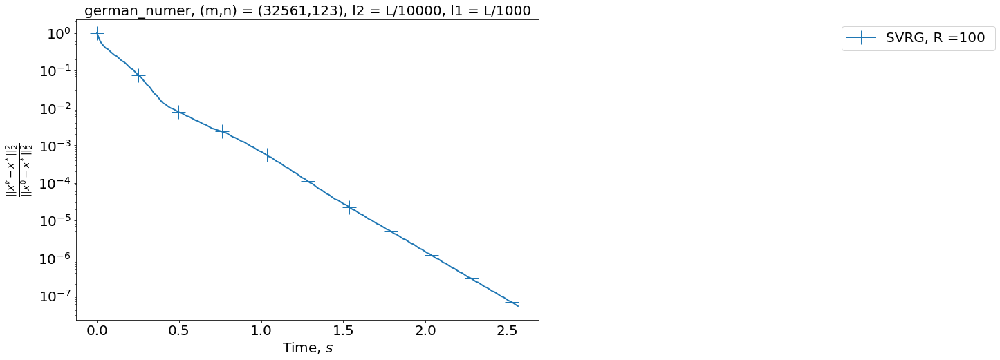

In [111]:
for r in r_arr:
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = r
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), r], 
               f', R ={r} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [112]:
%%time
for l2_ in arr_l2:
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

CPU times: user 34.9 s, sys: 4 µs, total: 34.9 s
Wall time: 34.9 s


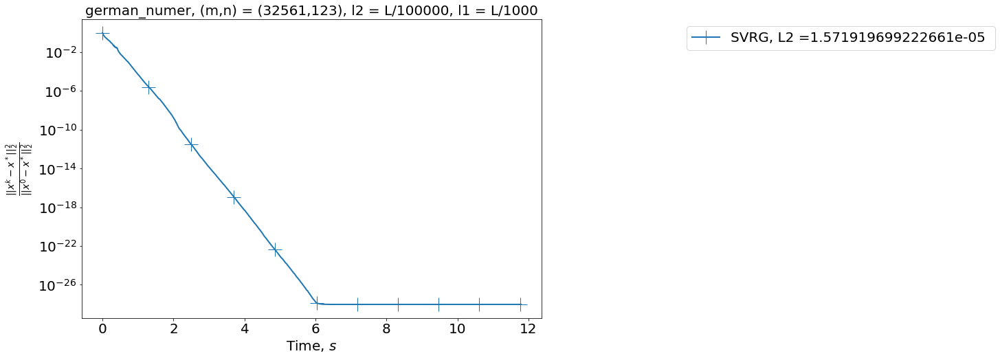

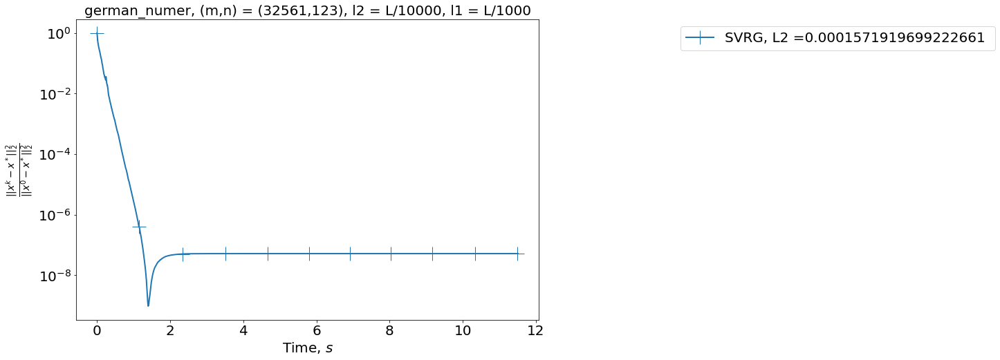

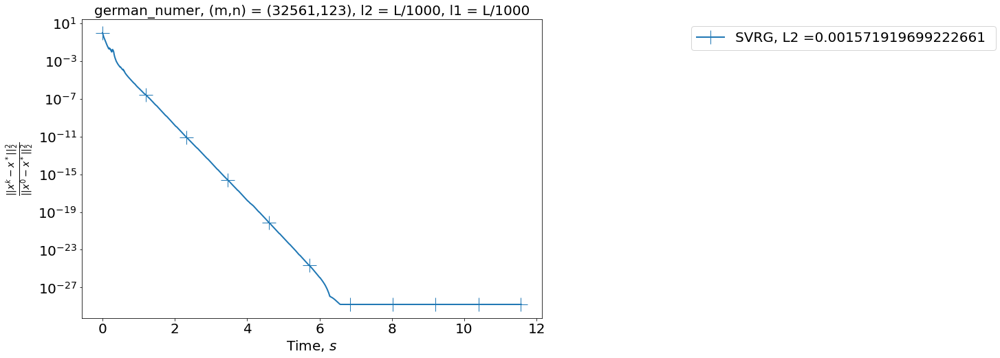

CPU times: user 596 ms, sys: 4 ms, total: 600 ms
Wall time: 598 ms


In [113]:
%%time
for l2_ in arr_l2:
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [114]:
%%time
for l2_ in tqdm(arr_l2):
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    test_indices = None
    x_init = np.ones(n)
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 1.0/(6*(L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 40
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
                 sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                 l1=l1, S=S, M=M, max_t=np.inf,
                 batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                 x_star=x_star, f_star=f_star)

100%|██████████| 3/3 [00:35<00:00, 11.89s/it]

CPU times: user 35.6 s, sys: 20 ms, total: 35.6 s
Wall time: 35.7 s


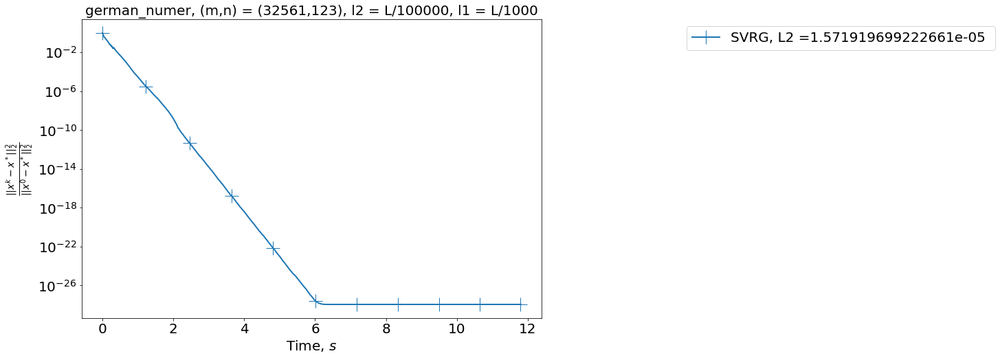

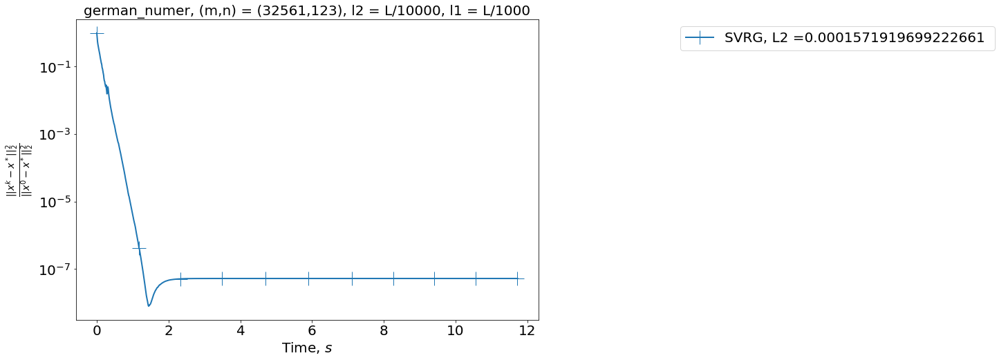

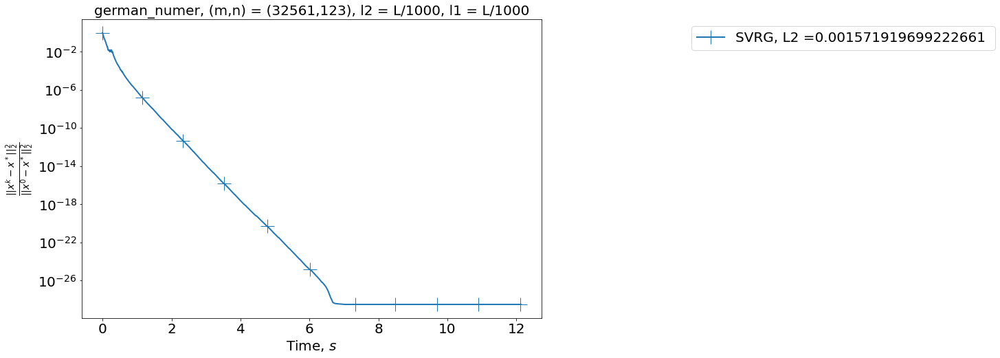

CPU times: user 647 ms, sys: 4 ms, total: 651 ms
Wall time: 649 ms


In [115]:
%%time
for l2_ in arr_l2:
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    l2 = l2_
    l1 = L / 1000
    batch_size = 10
    gamma = 1.0/(6*(L+l2))
    methods = [
             ['SVRG', [gamma, l2, l1, S, int(2*m/batch_size), 10], 
               f', L2 ={l2_} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.3.2 Gisette SGD

In [116]:
arr_1 = [1.0,0.1,0.01,0.05]

for a in tqdm(arr_1):
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 4/4 [00:41<00:00, 10.38s/it]


  0%|          | 0/4 [00:00<?, ?it/s]

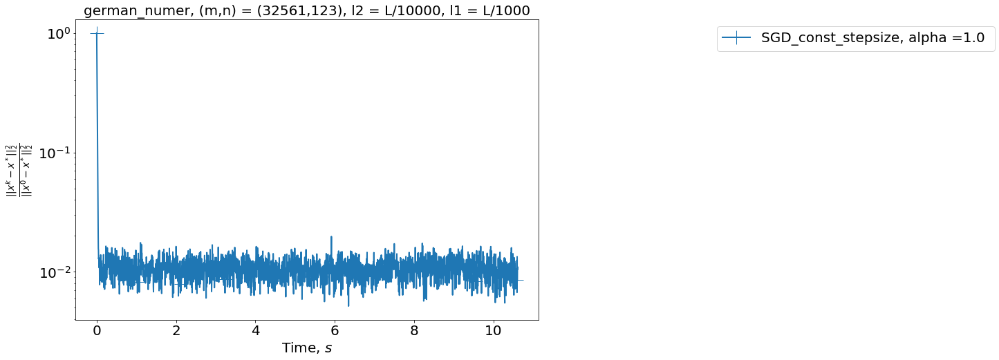

 25%|██▌       | 1/4 [00:00<00:00,  4.27it/s]

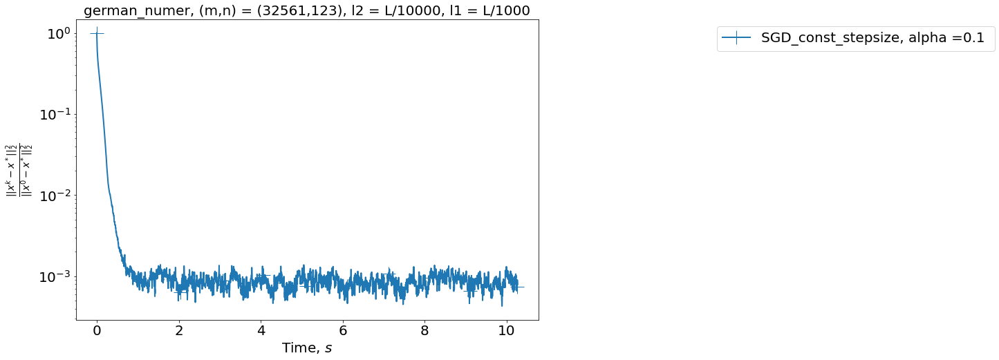

 50%|█████     | 2/4 [00:00<00:00,  4.19it/s]

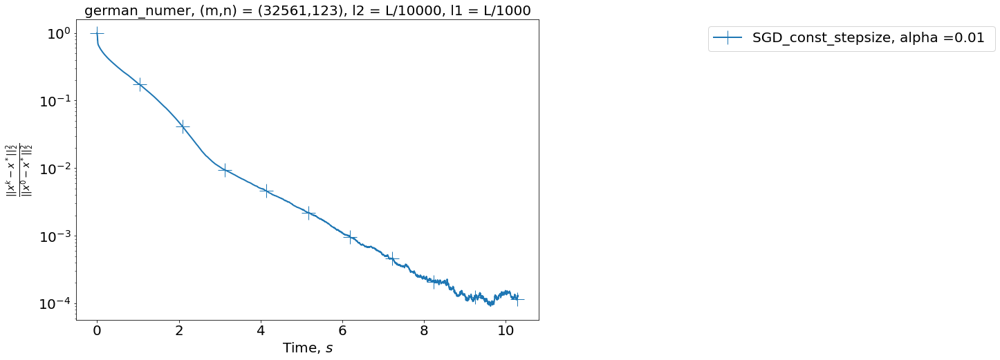

 75%|███████▌  | 3/4 [00:00<00:00,  4.05it/s]

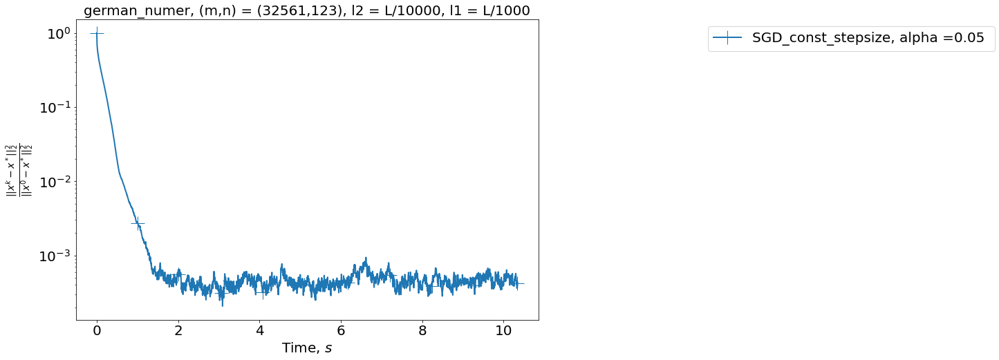

100%|██████████| 4/4 [00:00<00:00,  4.01it/s]


In [117]:
for a in tqdm(arr_1):
    dataset = "german_numer"
    filename=dataset+"_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = a/((L+l2))
    
    methods = [
             ['SGD_const_stepsize', [gamma, l2, l1, S, 10], 
               f', alpha ={a} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

In [118]:
gamma = 10 / (6 * (L + l2))
gammas = [[gamma, 10, 0.8],[gamma, 10, 0.5],[gamma, 5, 0.5],[gamma, 5, 0.9],[gamma, 2, 0.9],[gamma, 15, 0.9]]


for schedule in tqdm(gammas):
    filename=dataset+"_x_init_all_ones"
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2*m/batch_size)
    gamma = 10/(6*(L+l2))
    gamma_schedule = schedule
    x_star = read_solution(dataset, l2,l1)[0]
    f_star = read_solution(dataset, l2,l1)[1]
    S = 100
    save_info_period = 100
    sparse_full = False
    sparse_stoch = False
    res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

100%|██████████| 6/6 [01:01<00:00, 10.31s/it]


  0%|          | 0/6 [00:00<?, ?it/s]

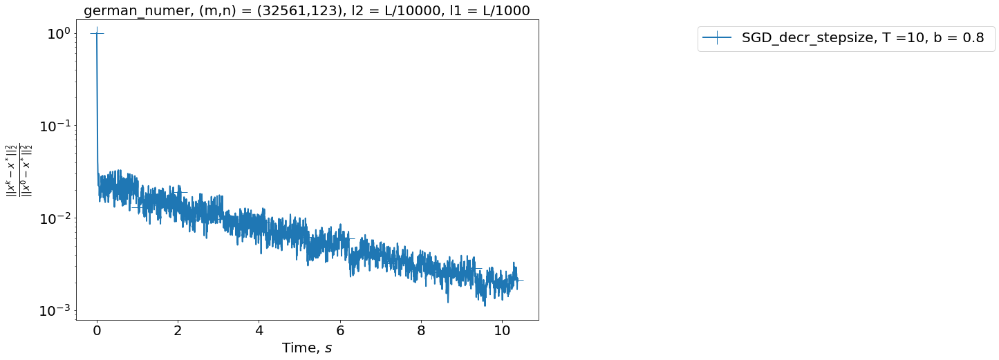

 17%|█▋        | 1/6 [00:00<00:01,  3.01it/s]

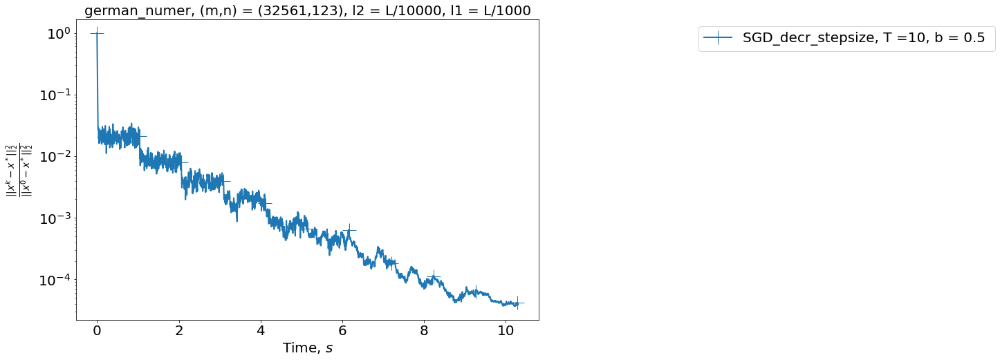

 33%|███▎      | 2/6 [00:00<00:01,  3.15it/s]

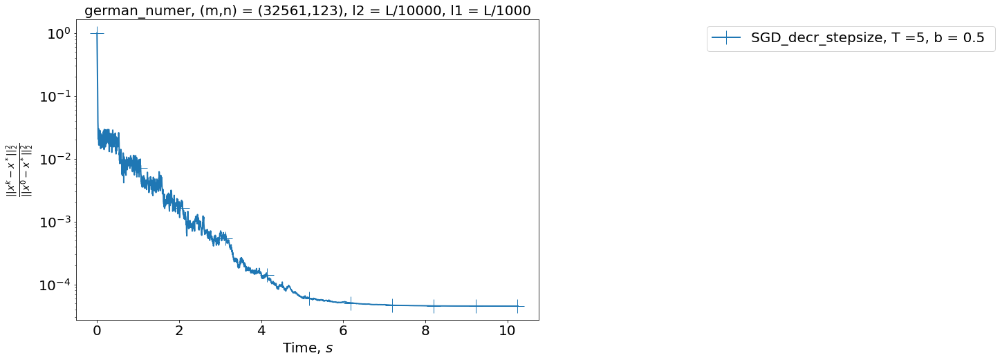

 50%|█████     | 3/6 [00:00<00:00,  3.30it/s]

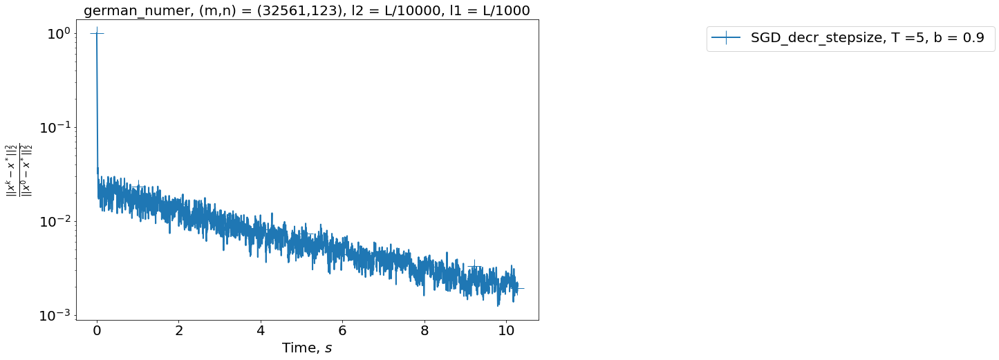

 67%|██████▋   | 4/6 [00:01<00:00,  3.48it/s]

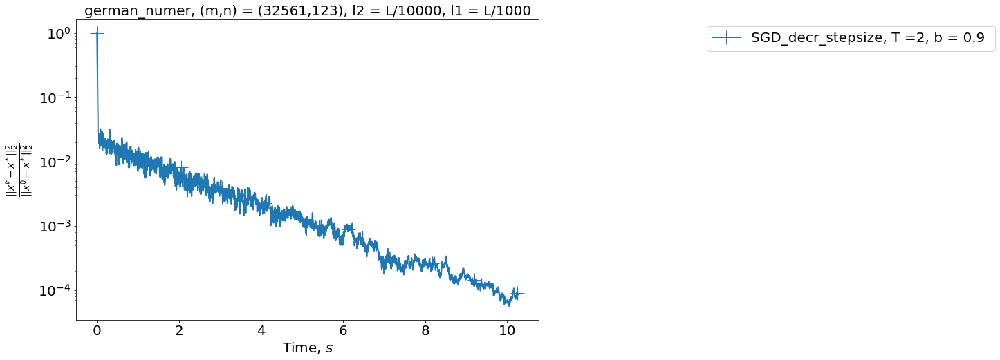

 83%|████████▎ | 5/6 [00:01<00:00,  3.48it/s]

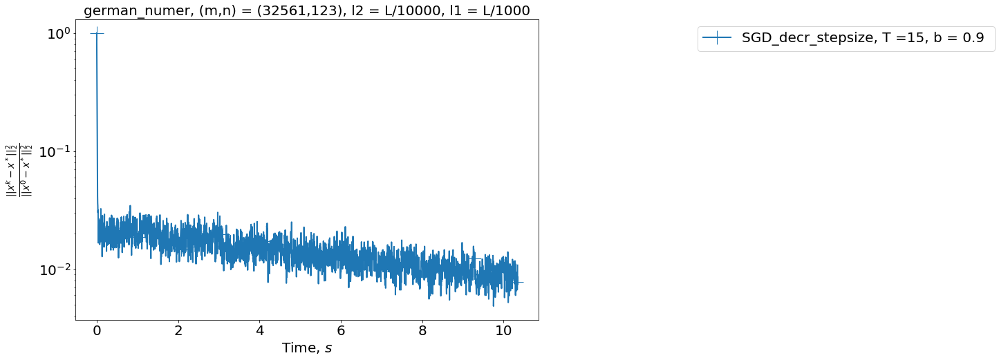

100%|██████████| 6/6 [00:01<00:00,  3.40it/s]


In [119]:
for schedule in tqdm(gammas):
    dataset = "german_numer"
    filename=dataset + "_x_init_all_ones"
    l2 = L / 10000
    l1 = L / 1000
    batch_size = 10
    M = int(2 * m / batch_size)
    gamma = 10 / (6 * (L + l2))
    gamma_schedule = schedule
    S = 100
    save_info_period = 100
    
    methods = [
             ['SGD_decr_stepsize', [schedule, l2, l1, S, 10], 
               f', T ={schedule[1]}, b = {schedule[2]} ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset + ", (m,n) = (" + str(m)+ "," + str(n) + "), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.3.3 german_numer L-SVRG

In [120]:
dataset = "german_numer"
x_init = np.ones(n)
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S=np.sqrt(L/l2)*np.log((delta_f+l2*res['squared_distances'][0])/epsilon)

In [121]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
S = int(S)
save_info_period = 10
sparse = True
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

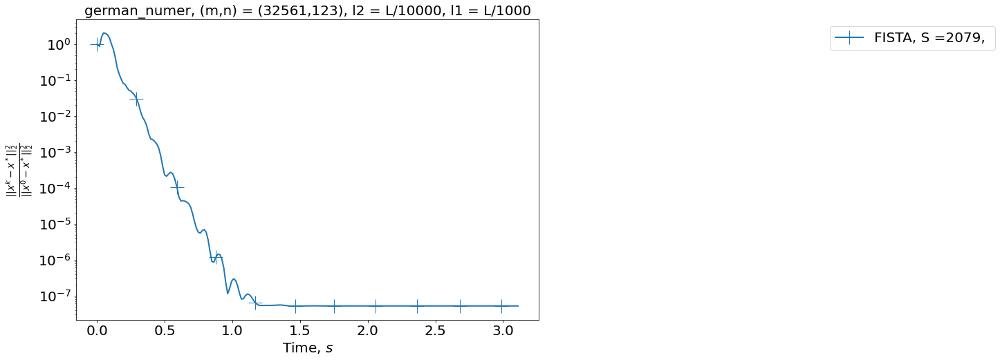

In [122]:

filename=dataset+"_x_init_all_ones"

methods = [
         ['FISTA', [l2, l1, S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

In [123]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = read_solution(dataset, l2,l1)[0]
f_star = read_solution(dataset, l2,l1)[1]
save_info_period = 10


In [124]:
delta_f = res['func_vals'][0]-f_star
epsilon=10**-8
S = np.sqrt(L / l2) * np.log((delta_f + l2 * res['squared_distances'][0]) / epsilon)
S = int(S)

In [125]:
sparse = False
gamma = 1/L
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

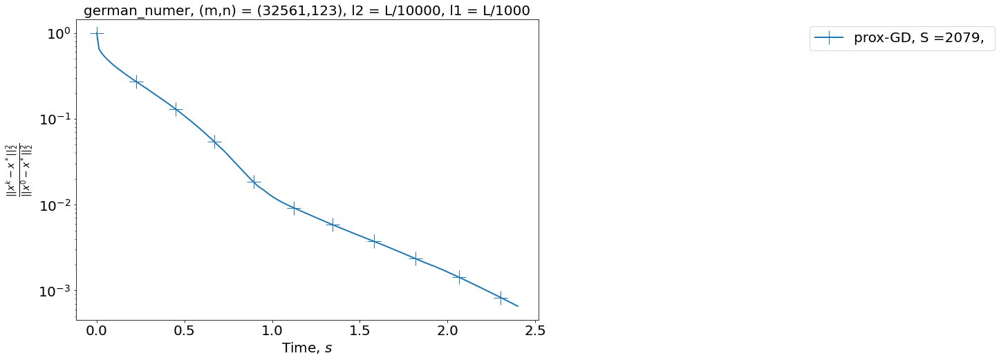

In [126]:

filename=dataset+"_x_init_all_ones"

methods = [
         ['prox-GD', [gamma, l2, l1,S], 
           f', S ={S}, ', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)
plt.show()

сходится хуже предыдущего

In [127]:
gamma_arr = [0.1, 0.5, 1.5, 2., 2.3, 2.5, 2.8, 3, 3.1]

In [128]:
for g in tqdm(gamma_arr):
    x_init = np.ones(n)
    l2 = L / 10000
    l1 = L / 1000
    gamma = g / (L + l2)
    S = 12000
    save_info_period = 10
    sparse = False
    res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
         sparse=sparse, l1=l1, S=S, max_t=np.inf,
         save_info_period=save_info_period, 
         x_star=x_star, f_star=f_star)

100%|██████████| 9/9 [02:06<00:00, 14.00s/it]


  0%|          | 0/9 [00:00<?, ?it/s]

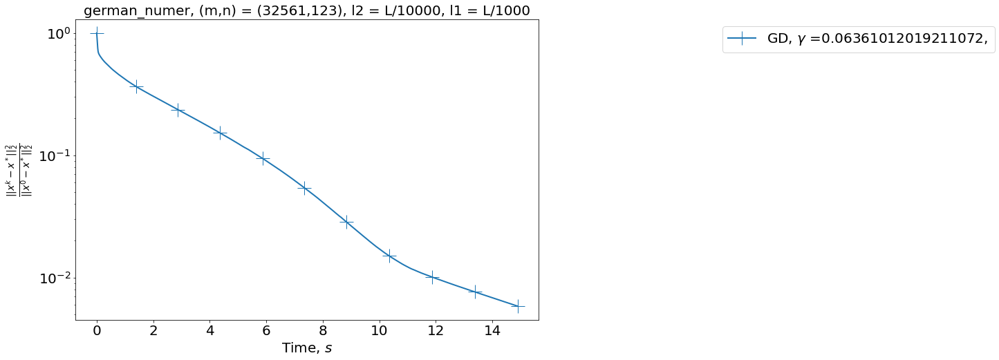

 11%|█         | 1/9 [00:00<00:01,  4.36it/s]

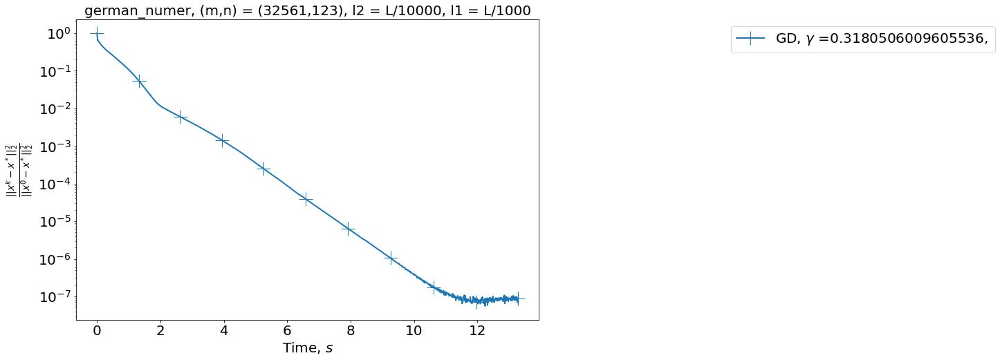

 22%|██▏       | 2/9 [00:00<00:02,  3.49it/s]

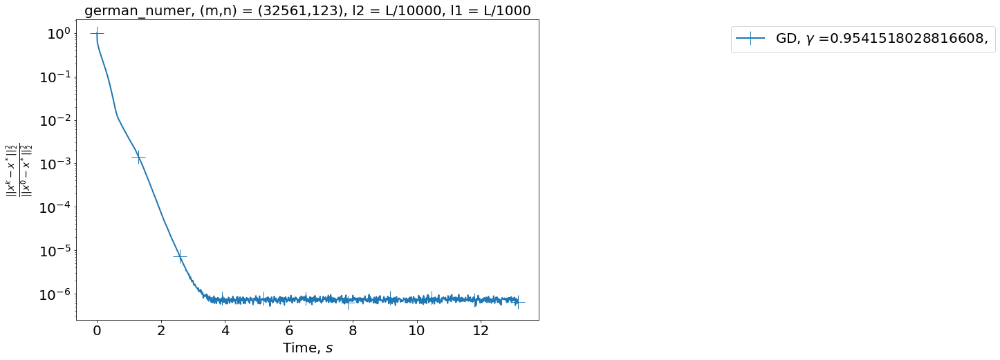

 33%|███▎      | 3/9 [00:00<00:01,  3.35it/s]

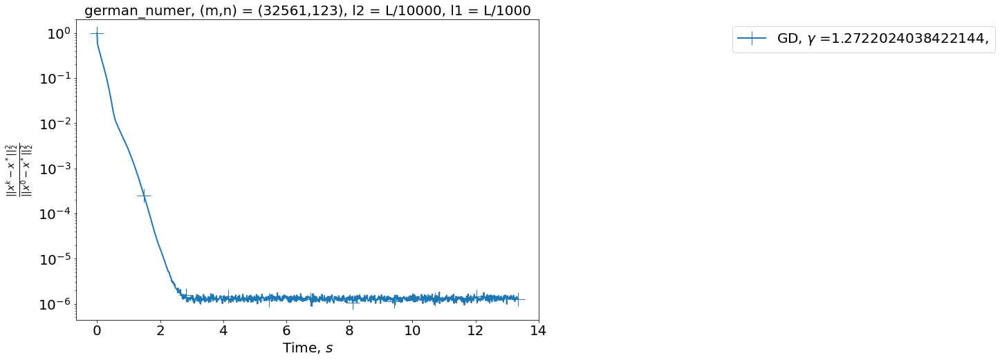

 44%|████▍     | 4/9 [00:01<00:01,  3.23it/s]

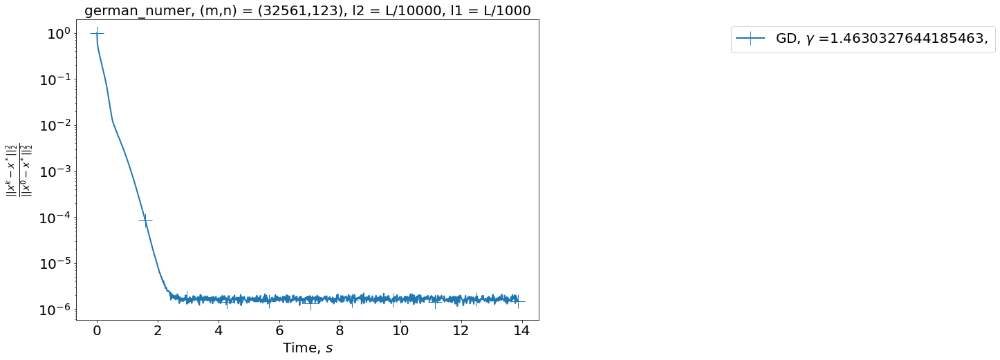

 56%|█████▌    | 5/9 [00:01<00:01,  3.20it/s]

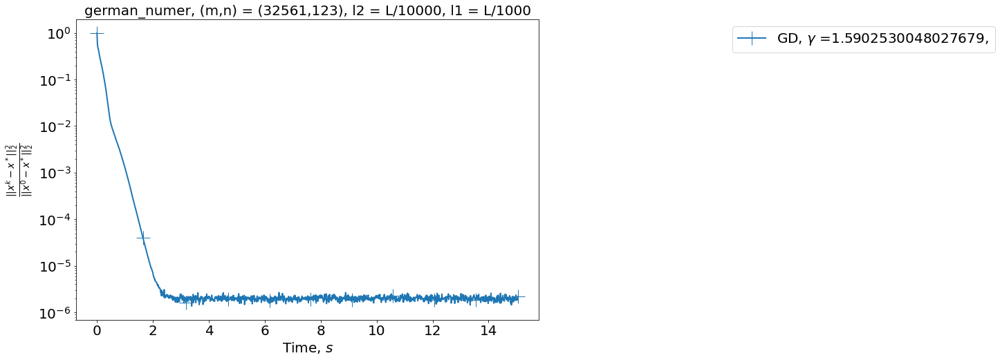

 67%|██████▋   | 6/9 [00:01<00:00,  3.22it/s]

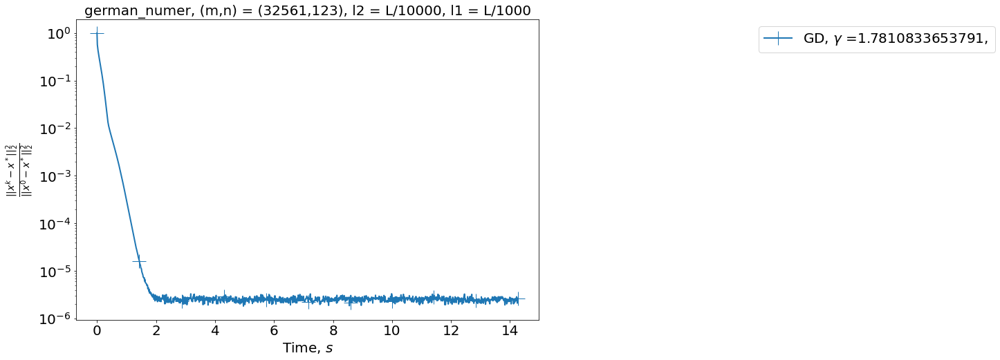

 78%|███████▊  | 7/9 [00:02<00:00,  2.99it/s]

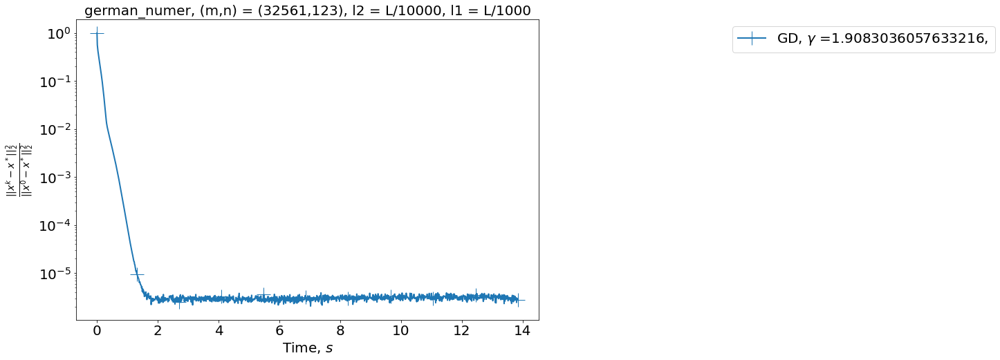

 89%|████████▉ | 8/9 [00:02<00:00,  3.10it/s]

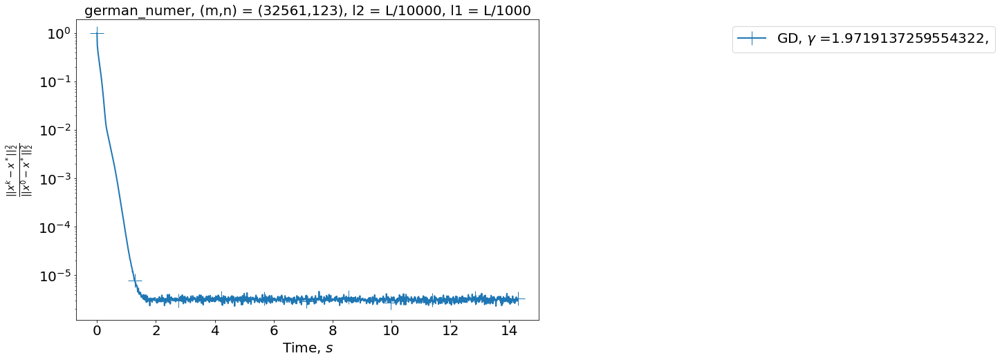

100%|██████████| 9/9 [00:02<00:00,  3.09it/s]


In [129]:
for g in tqdm(gamma_arr):
    gamma = g / (L + l2)
    methods = [
             ['GD', [gamma,l2, l1, S], 
               f', $\gamma$ ={gamma}, ', None],
    ]
    mode_y = 'squared_distances'
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))

    args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args=args_for_plots)
    plt.show()

#### 8.3.4 Сравнение

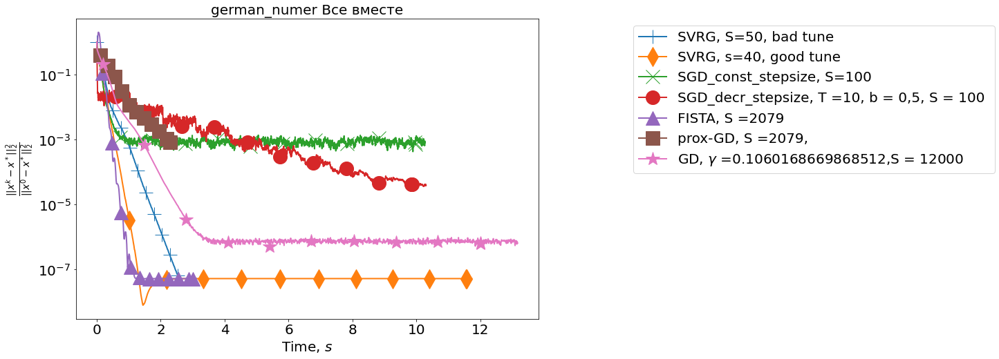

In [130]:
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 100
gamma = 1.0/(6*(L+l2))
S=50
methods = [
    ['SVRG', [gamma, L / 10000, L / 1000, 50, int(2*m/100), 100], f', S=50, bad tune', None],
    ['SVRG', [gamma, L/10000, L / 1000, 40, int(2*m/10), 10], f', s=40, good tune', None],
    ['SGD_const_stepsize', [0.1/((L+l2)), l2, l1, 100, 10], f', S=100 ', None],
    ['SGD_decr_stepsize', [[10/(6*(L+l2)), 10, 0.5], l2, l1, 100, 10], f', T =10, b = 0,5, S = 100 ', None],
    ['FISTA', [l2, l1, 2079], f', S =2079 ', None],
    ['prox-GD', [1/L, l2, l1, 2079], f', S =2079, ', None],
    ['GD', [1.5/((L+l2)),l2, l1, 12000], f', $\gamma$ ={gamma},S = 12000 ', None]
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = dataset+" Все вместе"

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Либо я что то делаю не так, либо FISTA и SGD с постоянным шагом универсальные методы, которые работает лучше остальных для всех датасетов (Особенно SGD по S). Так же важно было потюнить SVRG, так как это дает ощутимый прирост, у него определенно есть потенциал

Интуиция подсказывает, что нужно осторожно подходить к выбору алгоритма, но в задании я этого не почувствовал. Ощущение, что стох. град. спуска достаточно в большинстве случаев, а остальные методы нужны в очень редких (возможно я с ними никогда не сталкнусь) случаях, но конечно огромную роль играет опыт в решении таких проблем

# Задача наименьших квадратов

Для удобства продублируем здесь задачу, которую мы решаем
$$
f(x) = \frac{1}{2m}\|Ax - b\|_2^2 = \frac{1}{m}\sum\limits_{i=1}^m\underbrace{\frac{1}{2}(a_i^\top x - b_i)^2}_{f_i(x)} \to \min\limits_{x\in\mathbb{R}^n}
$$
$$
A = \begin{pmatrix}a_1^\top\\ \vdots\\ a_m^\top \end{pmatrix},\quad a_1,\ldots,a_m \in \mathbb{R}^n
$$

## Генерируем задачу

Строки матрицы выбираются случайно из стандартного нормального распределения (как и столбец $b$). Затем матрица нормируется так, что максимальное собственное число матрицы было равно единице.

In [131]:
def construct_least_squares(m=100, n=1000):
    A = np.array([norm_d.rvs(size=n)])
    for i in range(m-1):
        A = np.row_stack((A, norm_d.rvs(size=n)))
    A /= norm(A, ord=2)
    ATA = A.T.dot(A)
    sigmas_A = svdvals(ATA)
    mu_all = sigmas_A.min() * 1.0 / m
    L_all = 1.0 / m
        
    L_max = 0
    for i in range(m):
        cut_A = A[[i]]
        sigmas = svdvals(cut_A.T.dot(cut_A))
        test_L = sigmas.max()
        if test_L > L_max:
            L_max = test_L
    
    b = norm_d.rvs(size=m)
    A_pinv = scipy.linalg.pinv(A)
    x_star = A_pinv.dot(b)
    
    f_star = least_squares_val(x_star, [A, b])
    return A, b, mu_all, L_all, L_max, x_star, f_star

In [132]:
%%time
m = 200
n = 400
A, b, mu_all, L_all, L_max, x_star, f_star = construct_least_squares(m, n)
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

Константа сильной выпуклости всей функции:  5.569373309229629e-21
Константа гладкости всей функции         :  0.005
Худшая константа гладкости               :  0.430933774522507
Значение функции в решении               :  7.004704978773709e-30
CPU times: user 13.7 s, sys: 92 ms, total: 13.8 s
Wall time: 2.31 s


In [133]:
max_norm = 0
for i in range(m):
    test_norm = norm(least_squares_grad(x_star, [A[[i]], b[[i]]]))
    if test_norm > max_norm:
        max_norm = test_norm
print("Максимальная норма градиента слагаемого в найденном решении: ", max_norm)

Максимальная норма градиента слагаемого в найденном решении:  5.504866556192334e-15


Как видим, решение, посчитанное при помощи псевдообратной матрицы, найдено очень точно

## Задание 1. SGD и SVRG

Перепишите методы $\texttt{SGD}$ с константным шагом и $\texttt{SVRG}$ (создайте новые функции, используя образцы), которые будут работать с задачей наименьших квадратов

Для начала выгрузим тестовую задачу

In [134]:
with open("dump/test_ls_problem.txt", 'rb') as file:
    A, b, mu_all, L_all, L_max, x_star, f_star = pickle.load(file)
m, n = A.shape
print("(m,n) = (",m,",",n,")")
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

(m,n) = ( 200 , 400 )
Константа сильной выпуклости всей функции:  6.5096642865727495e-21
Константа гладкости всей функции         :  0.005
Худшая константа гладкости               :  0.43427025053659135
Значение функции в решении               :  5.2024818649839586e-30


Загрузим стартовую точку

In [135]:
with open("dump/test_starting_point.txt", 'rb') as file:
    x_init = pickle.load(file)

In [136]:
with open("dump/indices_test_ls.txt", 'rb') as file:
    test_indices = pickle.load(file)

batch_size = 1
gamma_sgd = 1.0/L_max
S = 10
save_info_period = 10

In [137]:
%%time
res = sgd_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

CPU times: user 46.9 ms, sys: 0 ns, total: 46.9 ms
Wall time: 46.3 ms


In [138]:
res['func_vals'][-1]

0.012365487542244046

In [139]:
sgd_ls_test(res)

Тесты пройдены!


0

In [144]:
with open("dump/indices_test_ls.txt", 'rb') as file:
    test_indices = pickle.load(file)

batch_size = 1
gamma_svrg = 1.0/(6*L_max)
M = int(2 * m / batch_size)
S = 10
save_info_period = 10

In [145]:
%%time
res = svrg_ls(x_init=x_init, A=A, b=b, gamma=gamma_svrg, S=S, M=M, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

CPU times: user 116 ms, sys: 0 ns, total: 116 ms
Wall time: 116 ms


In [146]:
res['func_vals'][-1]

0.08689704491523315

In [147]:
svrg_ls_test(res)

Некорректная последняя точка


1

## Задание 2. SGD-star

Для начала выгрузим тестовую задачу

In [148]:
with open("dump/test_ls_problem_2.txt", 'rb') as file:
    A, b, mu_all, L_all, L_max, x_star, f_star = pickle.load(file)
m, n = A.shape
print("(m,n) = (",m,",",n,")")
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

(m,n) = ( 300 , 100 )
Константа сильной выпуклости всей функции:  0.00024905911686002083
Константа гладкости всей функции         :  0.0033333333333333335
Худшая константа гладкости               :  0.18781048838384848
Значение функции в решении               :  0.34467839429707253


Загрузим стартовую точку

In [149]:
with open("dump/test_starting_point_2.txt", 'rb') as file:
    x_init = pickle.load(file)

In [150]:
with open("dump/indices_test_ls_2.txt", 'rb') as file:
    test_indices = pickle.load(file)

batch_size = 1
gamma_sgd = 1.0/L_max
S = 10
save_info_period = 10

In [151]:
%%time
res = sgd_star_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

CPU times: user 136 ms, sys: 1e+03 ns, total: 136 ms
Wall time: 135 ms


In [152]:
res['func_vals'][-1]

1.9960705136545798e-06

In [153]:
sgd_star_ls_test(res)

Тесты пройдены!


0

## Задание 3. SLCM

Для начала выгрузим тестовую задачу

In [154]:
with open("dump/test_ls_problem.txt", 'rb') as file:
    A, b, mu_all, L_all, L_max, x_star, f_star = pickle.load(file)
m, n = A.shape
print("(m,n) = (",m,",",n,")")
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

(m,n) = ( 200 , 400 )
Константа сильной выпуклости всей функции:  6.5096642865727495e-21
Константа гладкости всей функции         :  0.005
Худшая константа гладкости               :  0.43427025053659135
Значение функции в решении               :  5.2024818649839586e-30


Загрузим стартовую точку

In [155]:
with open("dump/test_starting_point.txt", 'rb') as file:
    x_init = pickle.load(file)

In [156]:
with open("dump/indices_test_ls.txt", 'rb') as file:
    test_indices = pickle.load(file)

batch_size_slcm = 7
eta = 30
S_slcm = 10
save_info_period = 1

In [157]:
%%time
res = slcm_ls(x_init=x_init, A=A, b=b, L=L_all, 
              eta=eta, S=S_slcm, batch_size=batch_size_slcm, 
              indices=test_indices, x_star=x_star, f_star=f_star)

CPU times: user 12.3 ms, sys: 0 ns, total: 12.3 ms
Wall time: 11.5 ms


In [158]:
res['func_vals'][-1]

0.03016885114243636

In [159]:
slcm_ls_test(res)

Тесты пройдены!


0

## Задание 4. Эксперименты с разными матрицами

Проведите эксперименты, указанные в задании.

Постройте графики. Воспользуйтесь функциями ниже.

In [160]:
def read_results_from_file(method, args):
    if method == 'SVRG':
        with open('dump/SVRG_ls_m_'+str(args[0])+'_n_'+str(args[1])
                  +'_gamma_'+str(args[2])+"_num_of_epochs_"+str(args[3])
              +"_epoch_length_"+str(args[4])+"_batch_size_"+str(args[5])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == 'SGD':
        with open('dump/SGD_ls_m_'+str(args[0])+'_n_'+str(args[1])
                  +'_gamma_'+str(args[2])+"_num_of_epochs_"+str(args[3])
              +"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == 'SGD_star':
        with open('dump/SGD_star_ls_m_'+str(args[0])+'_n_'+str(args[1])
                  +'_gamma_'+str(args[2])+"_num_of_epochs_"+str(args[3])
              +"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == 'SLCM':
        with open('dump/SLCM_ls_m_'+str(args[0])+'_n_'+str(args[1])
                  +'_eta_'+str(args[2])+"_num_of_epochs_"+str(args[3])
              +"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)

In [161]:
def make_plots(args):
    supported_modes_y = ['squared_distances', 'func_vals']
    supported_modes_x = ['time', 'data_passes', 'iters']
    
    mode_y = args[0]
    mode_x = args[1]
    figsize = args[2]
    fontsize = args[3]
    title = args[4]
    methods = args[5]
    
    assert(mode_y in supported_modes_y)
    assert(mode_x in supported_modes_x)
    
    plt.figure(figsize=figsize)
    plt.title(title, fontsize=fontsize)
    marker = itertools.cycle(('+', 'd', 'x', 'o', '^', 's', '*', 'p', '<', '>', '^'))
    
    num_of_methods = len(methods)
    for idx, method in enumerate(methods):
        res = read_results_from_file(method[0], method[1])
        if method[3] == None:
            length = len(res['iters'])
        else:
            length = method[3]
        plt.semilogy(res[mode_x][0:length], res[mode_y][0:length] / res[mode_y][0], linewidth=2, marker=next(marker), 
            markersize = 20, 
            markevery=range(-idx*int(length/(10*num_of_methods)), len(res[mode_x][0:length]), int(length/10)), 
            label = method[0]+method[2])
        
    
    plt.legend(bbox_to_anchor=(2,1), loc="upper right", fontsize=fontsize)
    if mode_x == 'time':
        plt.xlabel(r"Time, $s$", fontsize=fontsize)
    if mode_x == 'sampled_grads':
        plt.xlabel(r"Number of sampled gradients / number of data samples", fontsize=fontsize)
    if mode_x == 'iters':
        plt.xlabel(r"Number of iterations", fontsize=fontsize)
    if mode_y == 'squared_distances':
        plt.ylabel(r"$\frac{||x^k - x^*||_2^2}{||x^0 - x^*||_2^2}$", fontsize=fontsize)
    if mode_y == 'func_vals':
        plt.ylabel(r"$\frac{f(x^k)-f(x^())}{f(x^0)-f(x^*)}$", fontsize=fontsize)
    
    plt.xticks(fontsize=fontsize)
    _ = plt.yticks(fontsize=fontsize)

Пример использования функции для построения графиков

In [162]:
methods = [
          ['SVRG', [m,n, gamma_svrg, 10, int(2*m/1), 1], 
            " текст", None],
          ['SGD', [m,n, gamma_sgd, 10, 1], 
           " текст", None],
          ]
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]

In [164]:
# make_plots(args_for_plots)

## 4.1 n > m

### n=200, m=100

Константа сильной выпуклости всей функции:  2.2407581591052514e-21
Константа гладкости всей функции         :  0.01
Худшая константа гладкости               :  0.45679693220634054
Значение функции в решении               :  6.050349428768226e-30


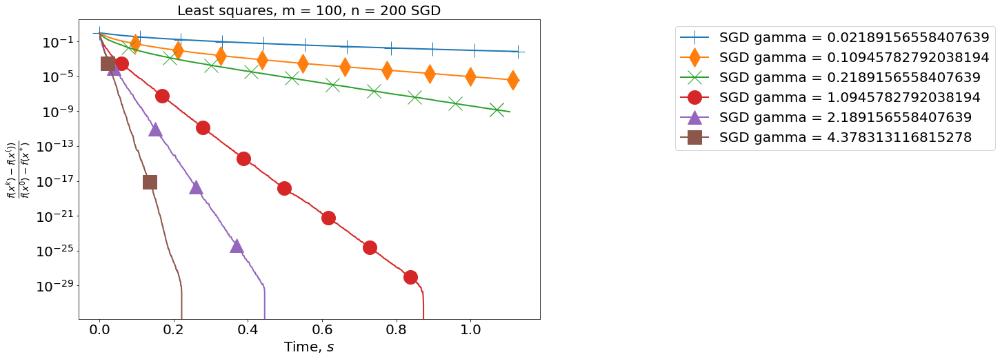

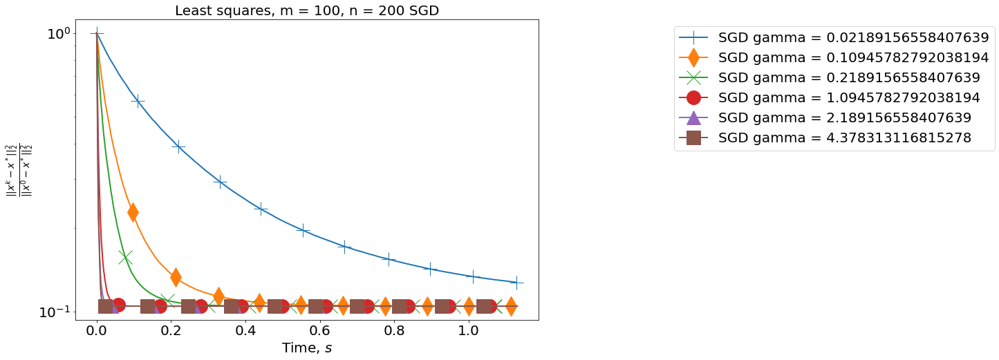

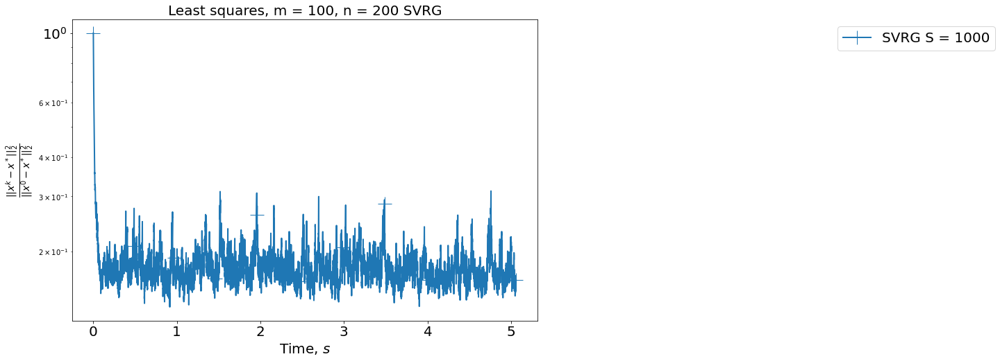

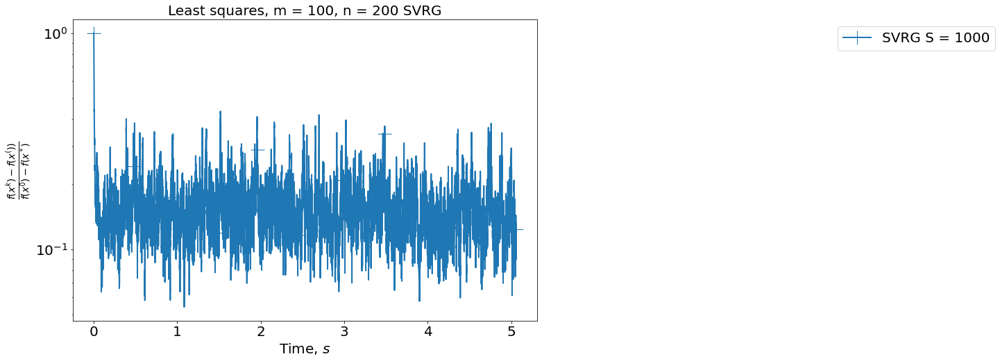

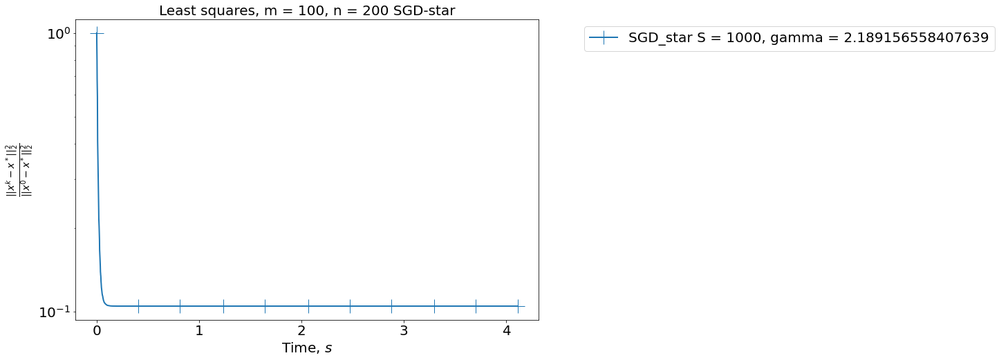

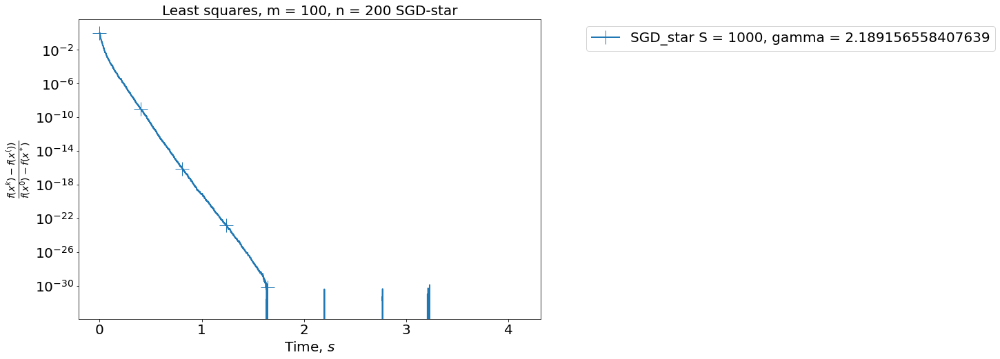

In [165]:
m = 100
n = 200
A, b, mu_all, L_all, L_max, x_star, f_star = construct_least_squares(m, n)
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

gammas = [0.01,0.05,0.1,0.5,1.,2]
for gamma in gammas:
    batch_size = 1
    gamma_sgd = gamma/L_max
    S = 1000
    save_info_period = 5
    x_init = np.ones(n)
    res = sgd_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
                 batch_size=batch_size,
                 x_star=x_star, f_star=f_star)

methods =[]
for gamma in [0.01,0.05,0.1,0.5,1.,2]: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()
batch_size = 1
gamma_svrg = 2.0/(6*L_max)
M = int(2 * m / batch_size)
S=1000
save_info_period = 10
res = svrg_ls(x_init=x_init, A=A, b=b, gamma=gamma_svrg, S=S, M=M, 
             batch_size=batch_size,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

gamma_sgd = 1.0/L_max
res = sgd_star_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD_star', [m,n, gamma_sgd, S, 1], f" S = {S}, gamma = {gamma_sgd}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD-star'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()




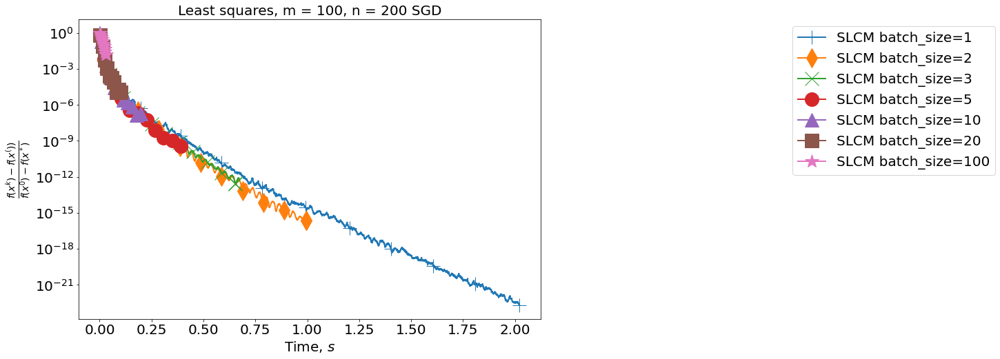

In [166]:
arr_b = [1,2,3,5,10,20,100]

for size_b in arr_b:
    batch_size_slcm = size_b
    eta = 100
    S_slcm = 1000
    save_info_period = 10
    res = slcm_ls(x_init=x_init, A=A, b=b, L=L_all, 
                  eta=eta, S=S_slcm, batch_size=batch_size_slcm, x_star=x_star, f_star=f_star)

methods = []
for size_b in arr_b:
    methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch_size={size_b}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

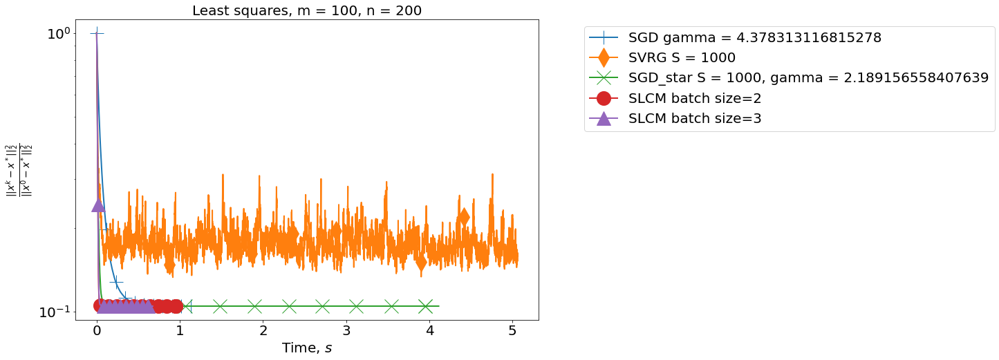

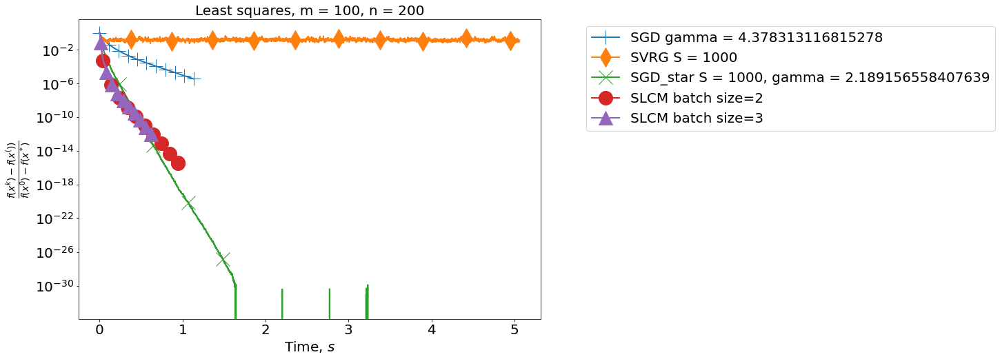

In [168]:
for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD', [m,n, 0.05/L_max, 1000, 1], 
               f" gamma = {gamma/L_max}", None],
             ['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None],['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]
    for size_b in[2,3]:
        methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch size={size_b}", None])

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

SLCM разы быстрее! Но что то не так

###  n=400, m=100

Константа сильной выпуклости всей функции:  3.7133373299694005e-21
Константа гладкости всей функции         :  0.01
Худшая константа гладкости               :  0.559292537861698
Значение функции в решении               :  3.5402709053093524e-30


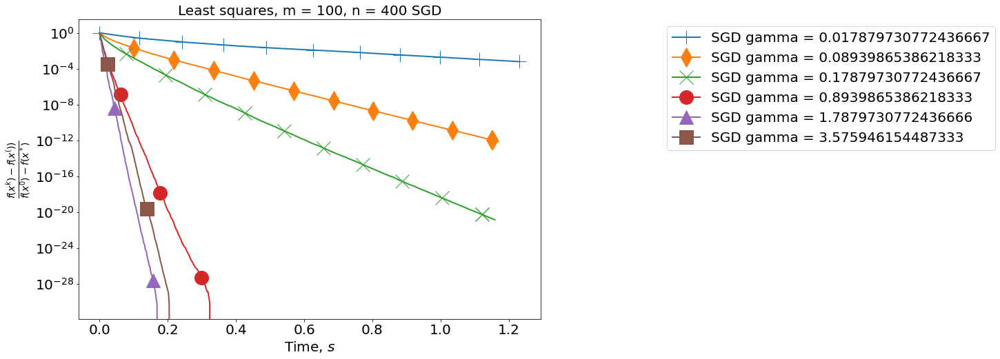

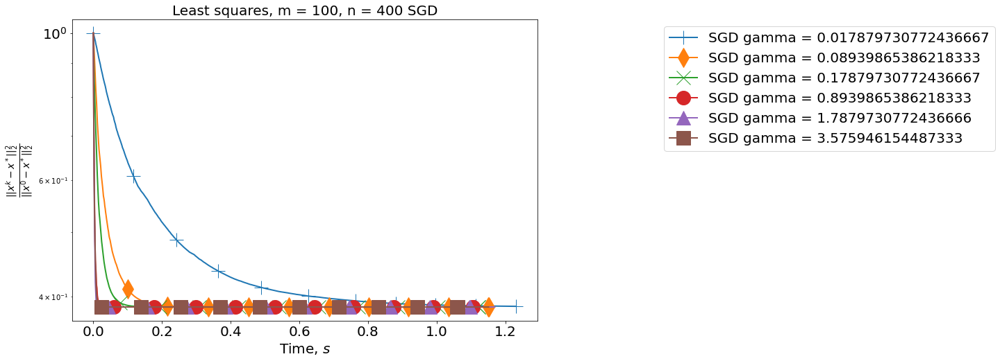

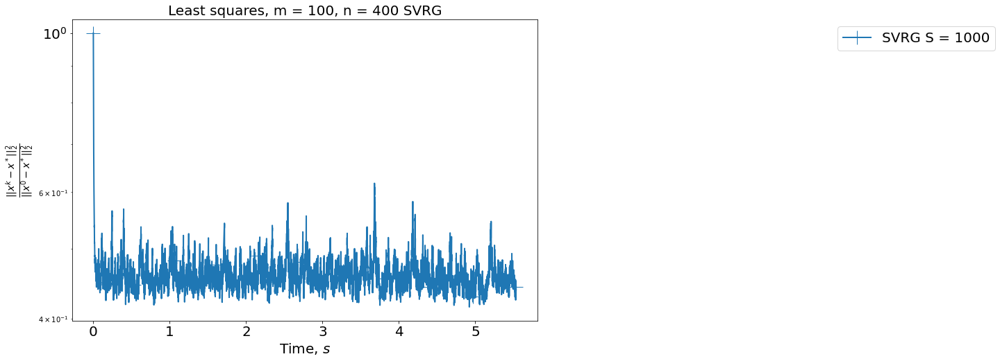

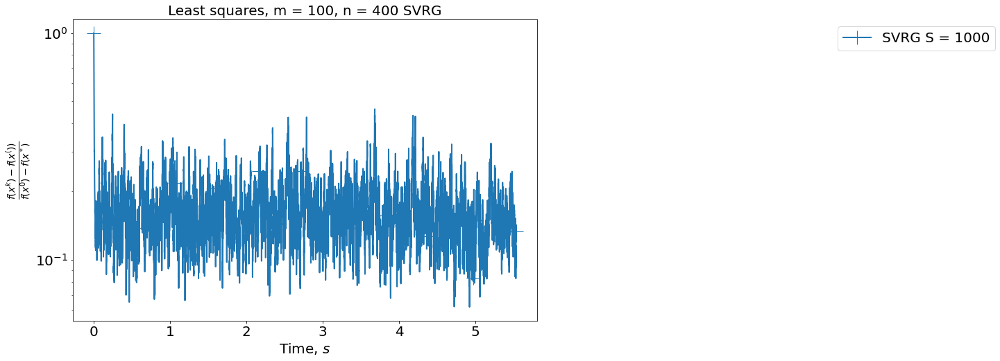

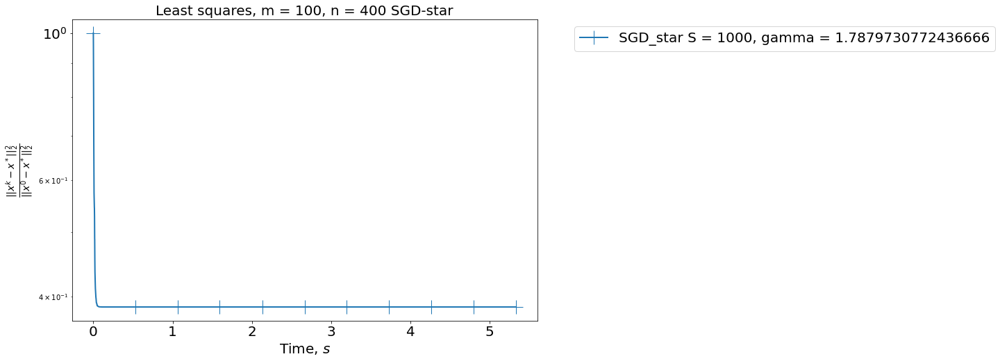

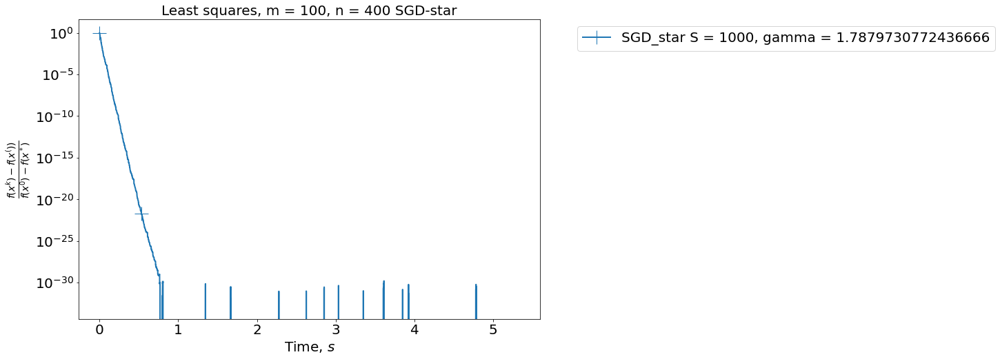

In [170]:
m = 100
n = 400
A, b, mu_all, L_all, L_max, x_star, f_star = construct_least_squares(m, n)
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

for gamma in [0.01,0.05,0.1,0.5,1.,2]:
    batch_size = 1
    gamma_sgd = gamma/L_max
    S = 1000
    save_info_period = 5
    x_init = np.ones(n)
    res = sgd_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
                 batch_size=batch_size,
                 x_star=x_star, f_star=f_star)

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()
batch_size = 1
gamma_svrg = 2.0/(6*L_max)
M = int(2 * m / batch_size)
S=1000
save_info_period = 10
res = svrg_ls(x_init=x_init, A=A, b=b, gamma=gamma_svrg, S=S, M=M, 
             batch_size=batch_size,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

gamma_sgd = 1.0/L_max
res = sgd_star_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD-star'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()




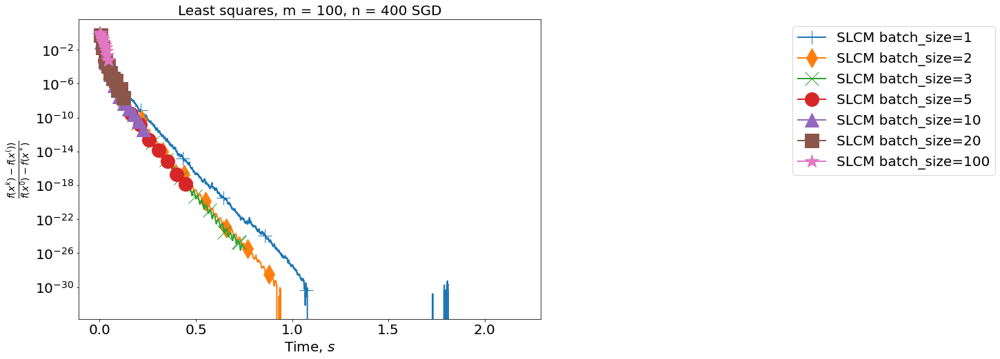

In [173]:
for size_b in arr_b:
    batch_size_slcm = size_b
    eta = 100
    S_slcm = 1000
    save_info_period = 10
    res = slcm_ls(x_init=x_init, A=A, b=b, L=L_all, 
                  eta=eta, S=S_slcm, batch_size=batch_size_slcm, x_star=x_star, f_star=f_star)

methods =[]
for size_b in[1,2,3,5,10,20,100]:
    methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch_size={size_b}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

нет разницы между батчами 2, 3... 100?

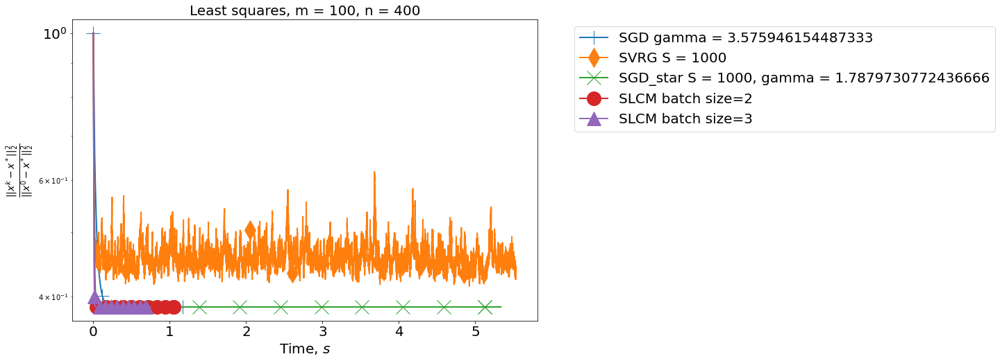

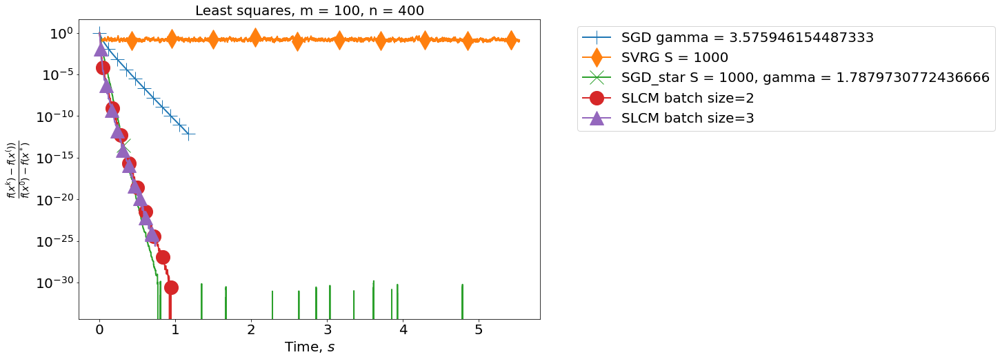

In [174]:
for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD', [m,n, 0.05/L_max, 1000, 1], 
               f" gamma = {gamma/L_max}", None],
             ['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None],['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]
    for size_b in[2,3]:
        methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch size={size_b}", None])

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

## n < m

Константа сильной выпуклости всей функции:  0.00018852082097354307
Константа гладкости всей функции         :  0.005
Худшая константа гладкости               :  0.24923504194392782
Значение функции в решении               :  0.23788254712396845
CPU times: user 7.09 s, sys: 36 ms, total: 7.12 s
Wall time: 6.38 s


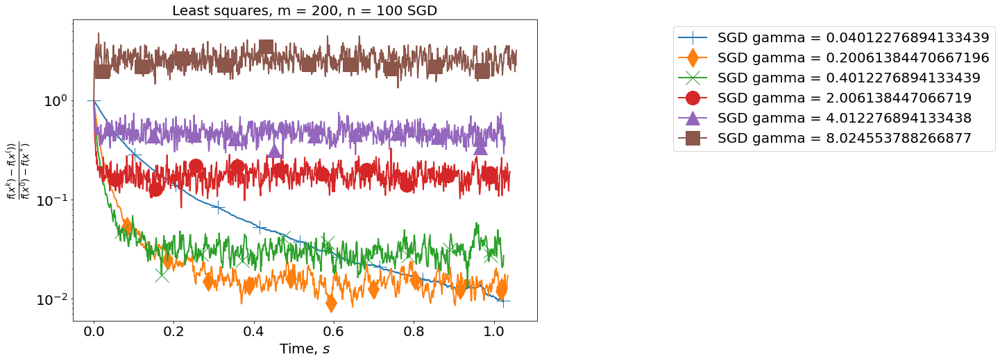

In [175]:
%%time
m = 200
n = 100
A, b, mu_all, L_all, L_max, x_star, f_star = construct_least_squares(m, n)
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

for gamma in gammas:
    batch_size = 1
    gamma_sgd = gamma/L_max
    S = 500
    save_info_period = 5
    x_init = np.ones(n)
    res = sgd_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
                 batch_size=batch_size,
                 x_star=x_star, f_star=f_star)
    
methods =[]
for gamma in [0.01,0.05,0.1,0.5,1.,2]: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

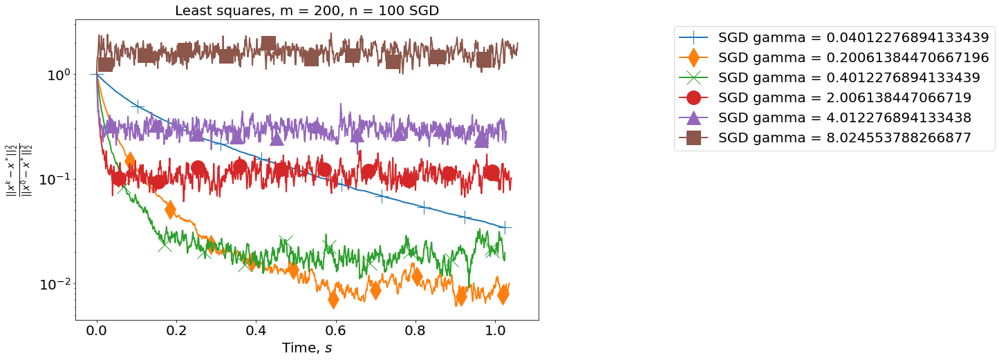

In [176]:
methods =[]
for gamma in [0.01,0.05,0.1,0.5,1.,2]: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

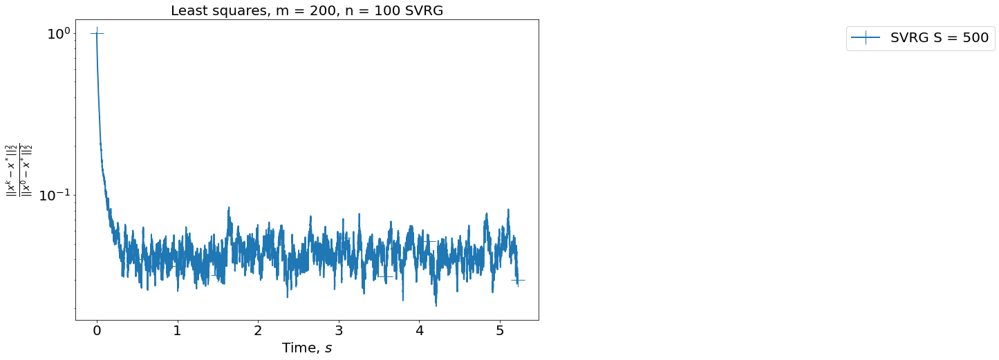

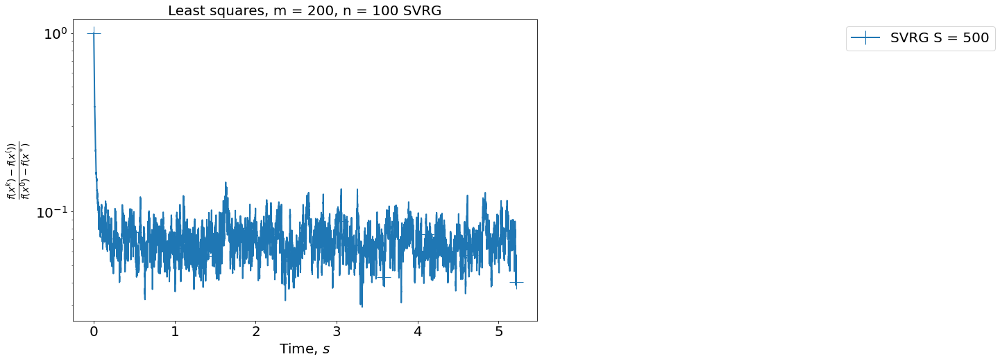

In [177]:
batch_size = 1
gamma_svrg = 1.0/(6*L_max)
M = int(2 * m / batch_size)
S=500
save_info_period = 10
res = svrg_ls(x_init=x_init, A=A, b=b, gamma=gamma_svrg, S=S, M=M, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

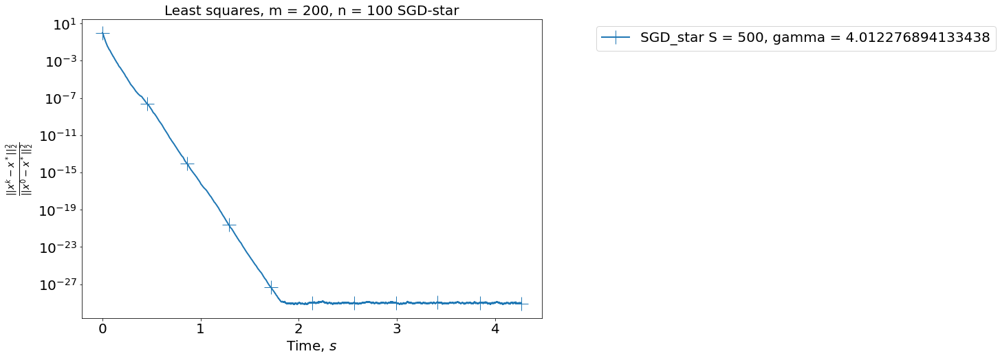

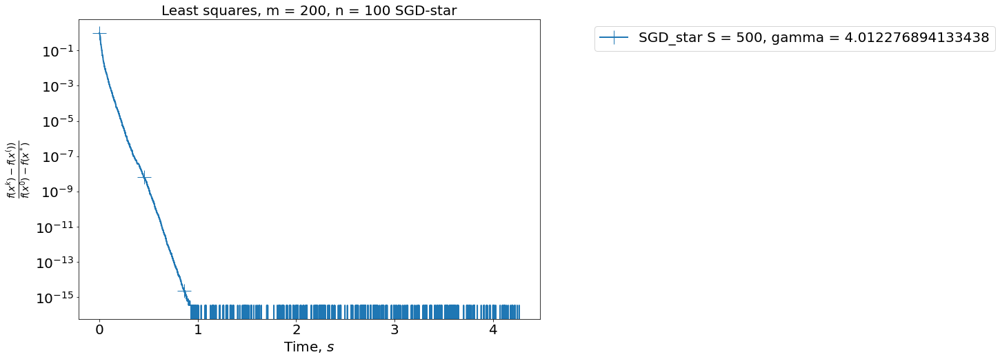

In [178]:
gamma_sgd = 1.0/L_max
res = sgd_star_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD-star'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

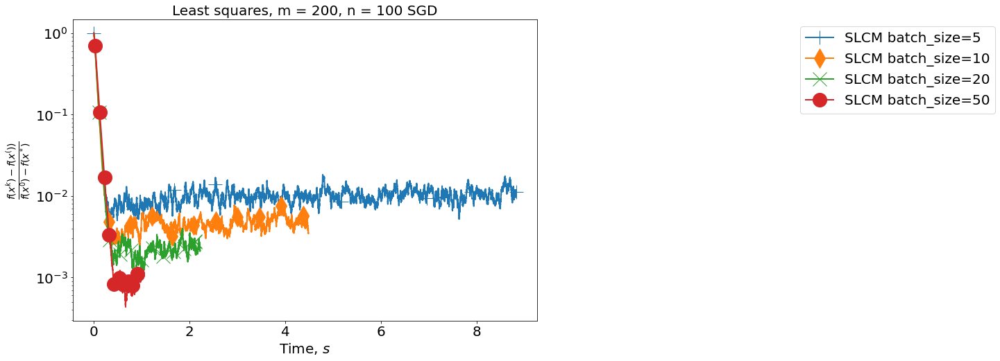

In [179]:
for size_b in [5,10,20,50]:
    batch_size_slcm = size_b
    eta = 1000
    S_slcm = 10000
    save_info_period = 10
    res = slcm_ls(x_init=x_init, A=A, b=b, L=L_all, 
                  eta=eta, S=S_slcm, batch_size=batch_size_slcm, 
                  indices=test_indices, x_star=x_star, f_star=f_star)
    
methods =[]
for size_b in[5,10,20,50]:
    methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch_size={size_b}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

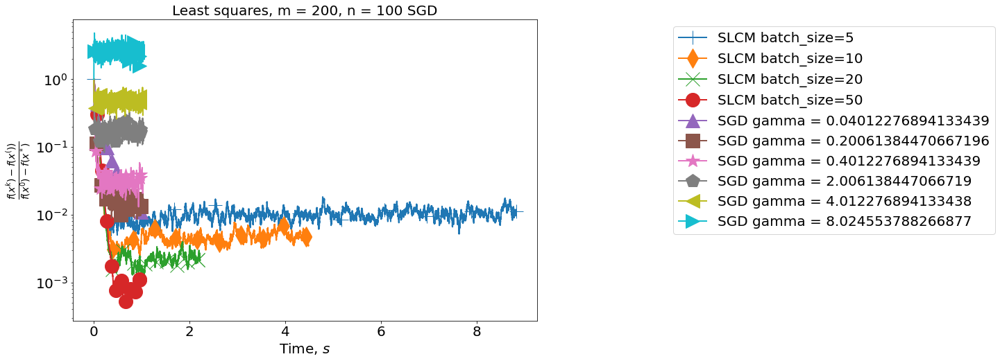

In [180]:
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

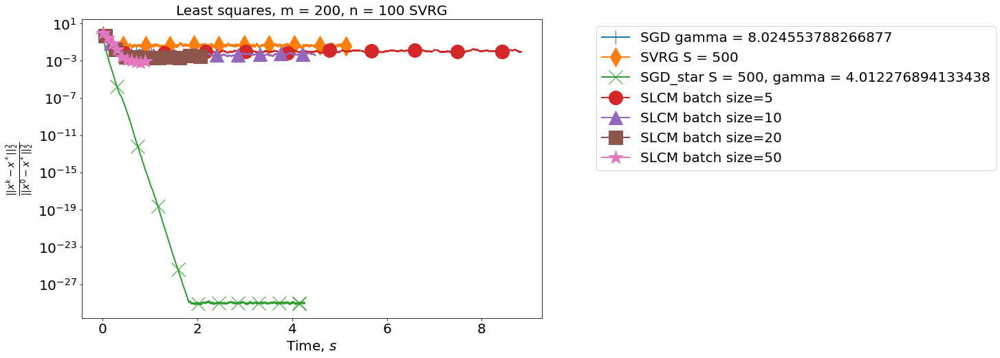

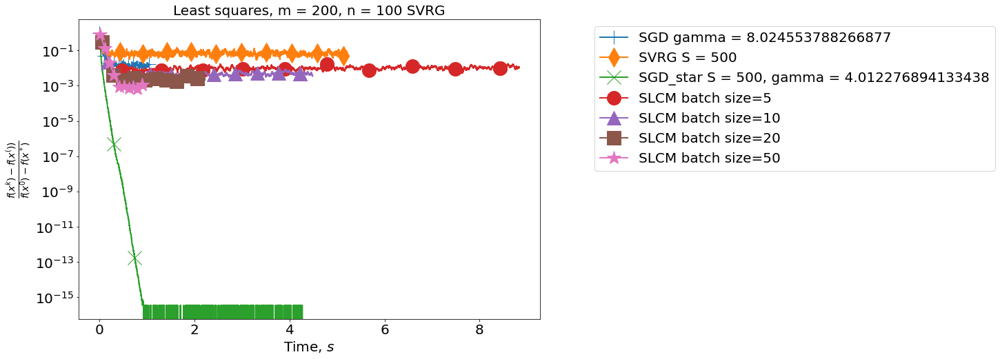

In [181]:
for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD', [m,n, 0.05/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None],
             ['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None],['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]
    for size_b in[5,10,20,50]:
        methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch size={size_b}", None])

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

SGD-star лучше всех

Константа сильной выпуклости всей функции:  0.00027128780388119435
Константа гладкости всей функции         :  0.0033333333333333335
Худшая константа гладкости               :  0.20108219158451188
Значение функции в решении               :  0.3403449955055243


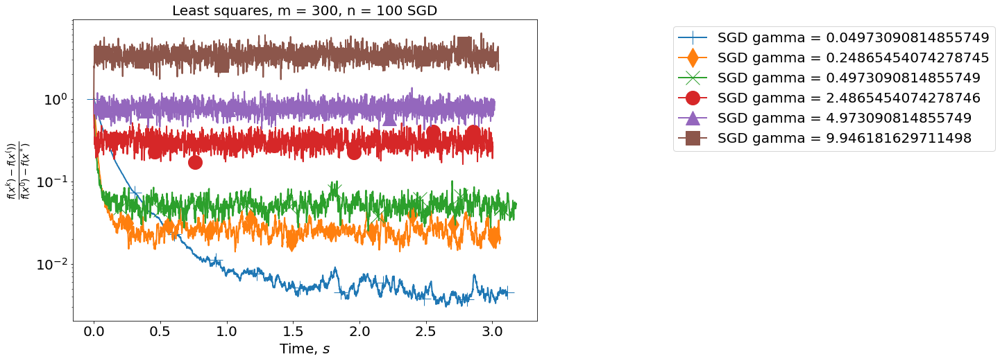

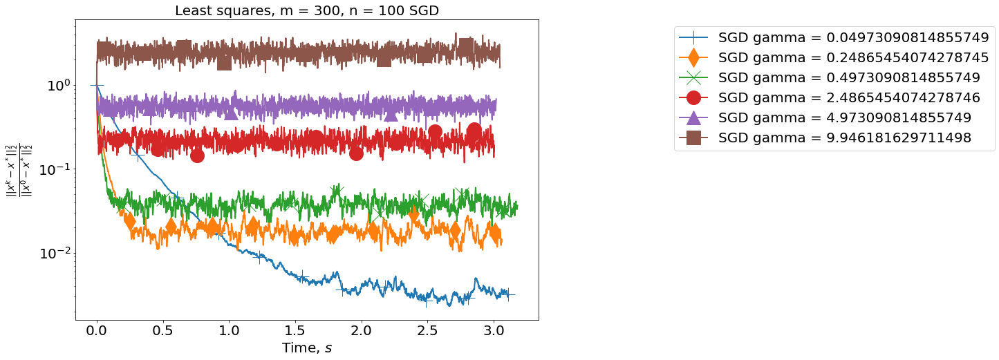

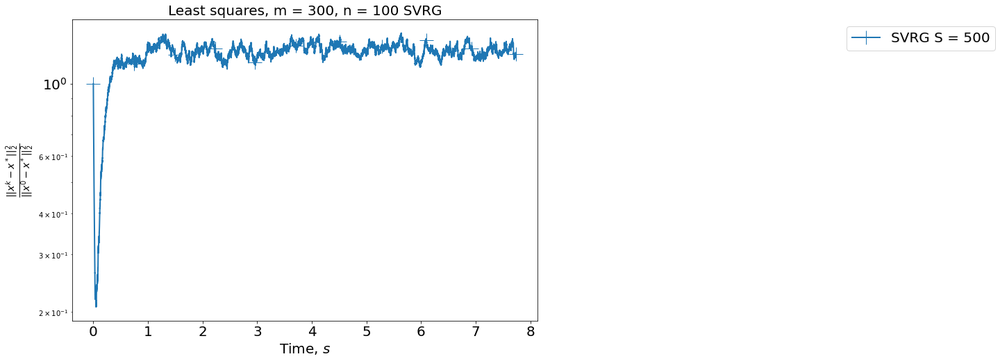

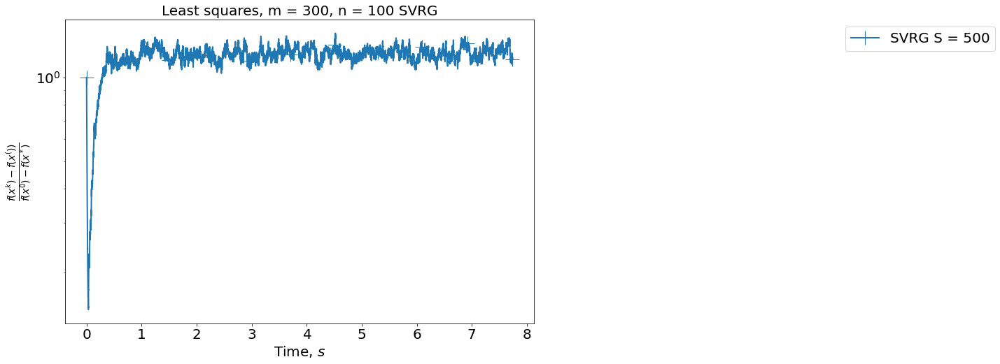

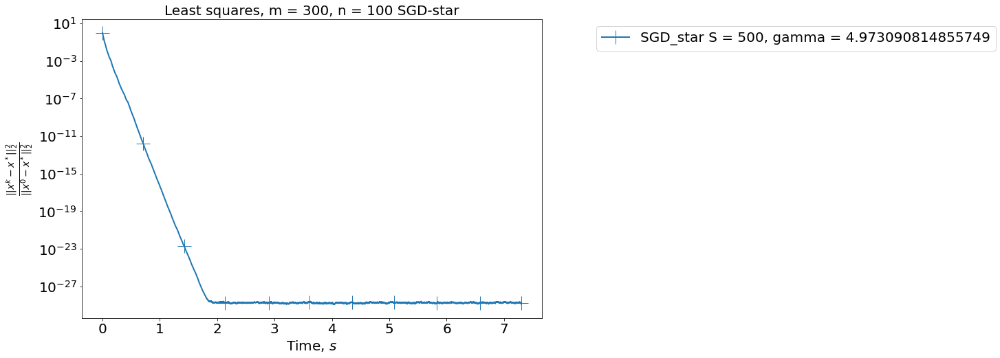

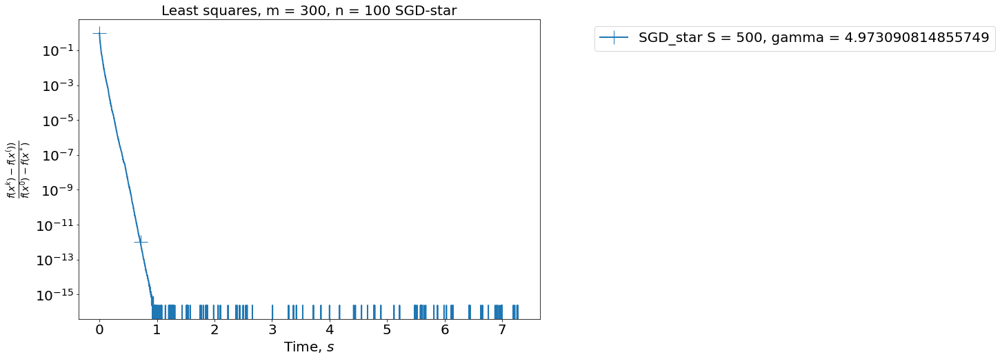

In [182]:
m = 300
n = 100
A, b, mu_all, L_all, L_max, x_star, f_star = construct_least_squares(m, n)
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

for gamma in gammas:
    batch_size = 1
    gamma_sgd = gamma/L_max
    S = 1000
    save_info_period = 5
    x_init = np.ones(n)
    res = sgd_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
                 batch_size=batch_size,
                 x_star=x_star, f_star=f_star)

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()
batch_size = 1
gamma_svrg = 1.0/(6*L_max)
M = int(2 * m / batch_size)
S=500
save_info_period = 10
res = svrg_ls(x_init=x_init, A=A, b=b, gamma=gamma_svrg, S=S, M=M, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

gamma_sgd = 1.0/L_max
res = sgd_star_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size, indices=test_indices,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD-star'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()


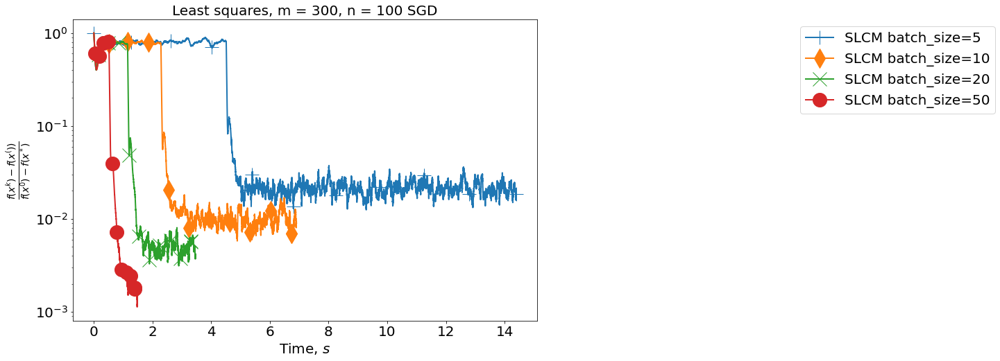

In [183]:
for size_b in [5,10,20,50]:
    batch_size_slcm = size_b
    eta = 1000
    S_slcm = 10000
    save_info_period = 10
    res = slcm_ls(x_init=x_init, A=A, b=b, L=L_all, 
                  eta=eta, S=S_slcm, batch_size=batch_size_slcm, 
                  indices=test_indices, x_star=x_star, f_star=f_star)

methods =[]
for size_b in[5,10,20,50]:
    methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch_size={size_b}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)


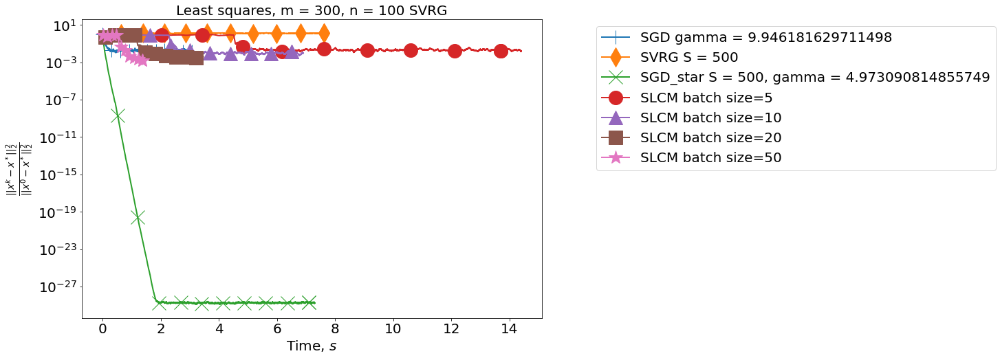

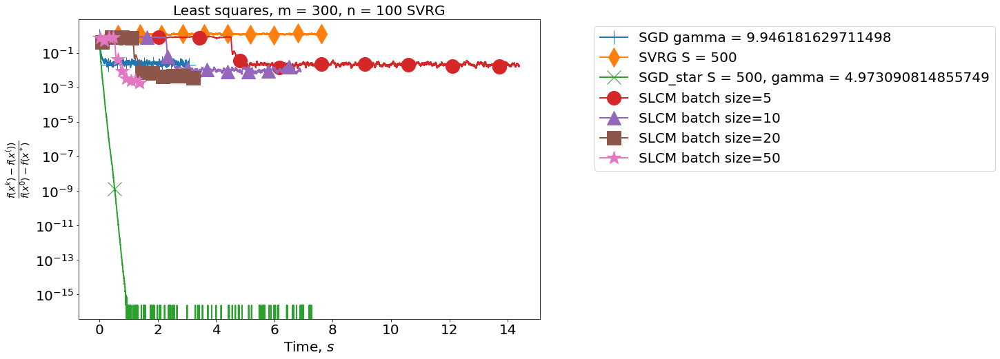

In [184]:
for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD', [m,n, 0.05/L_max, 1000, 1], 
               f" gamma = {gamma/L_max}", None],
             ['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None],['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]
    for size_b in[5,10,20,50]:
        methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch size={size_b}", None])

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

### m = 700, n = 100

Константа сильной выпуклости всей функции:  0.00030032530929511073
Константа гладкости всей функции         :  0.00125
Худшая константа гладкости               :  0.10189124120675835
Значение функции в решении               :  0.4272210919297532


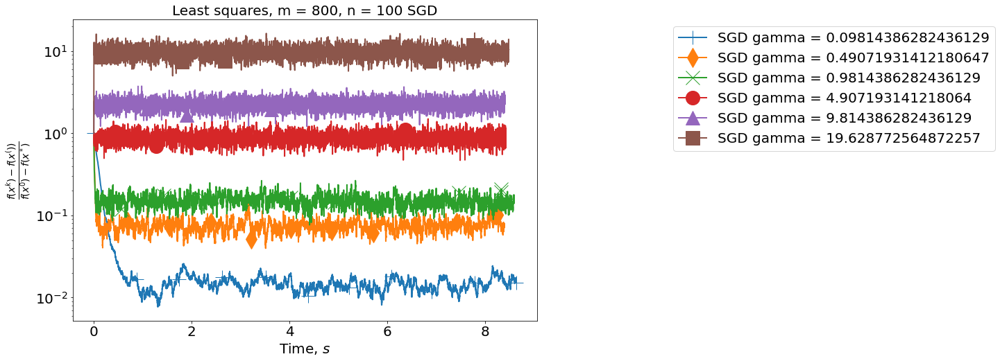

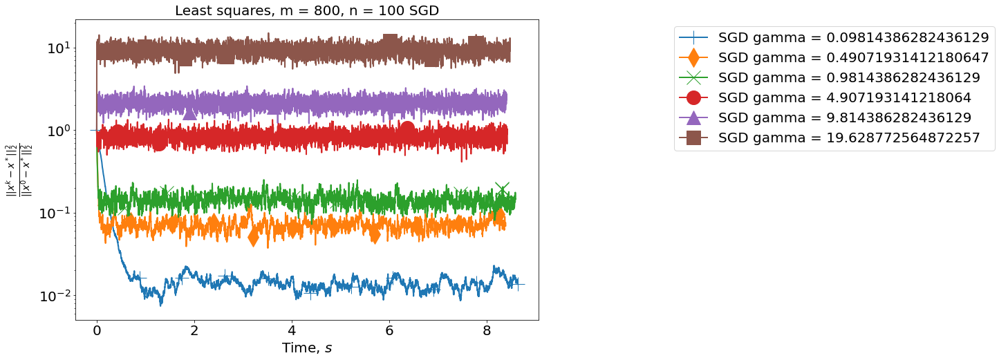

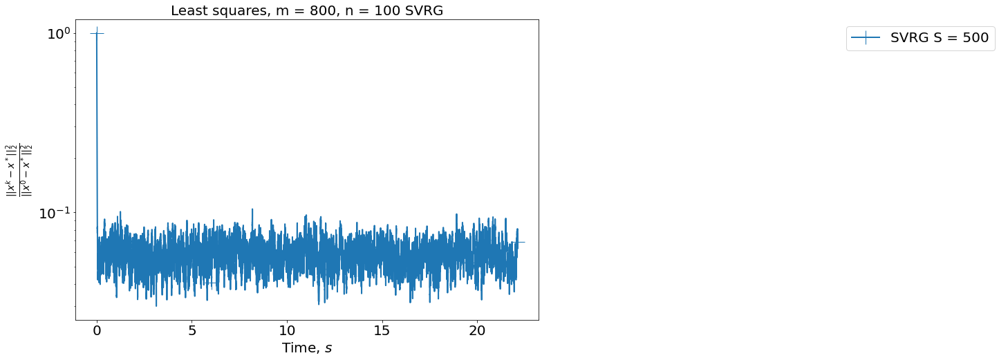

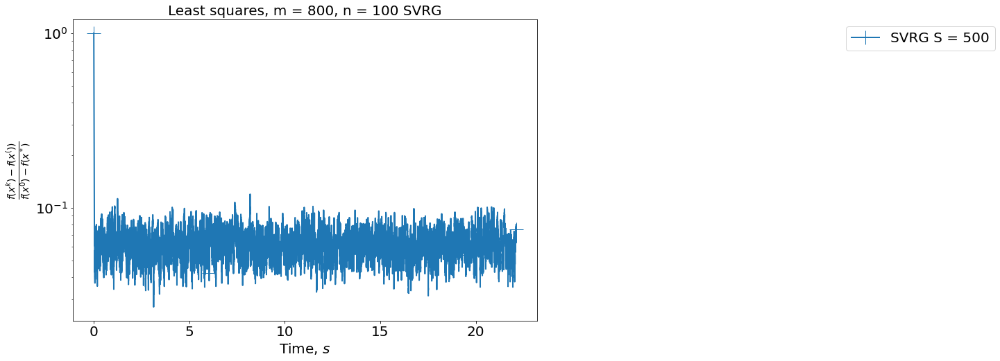

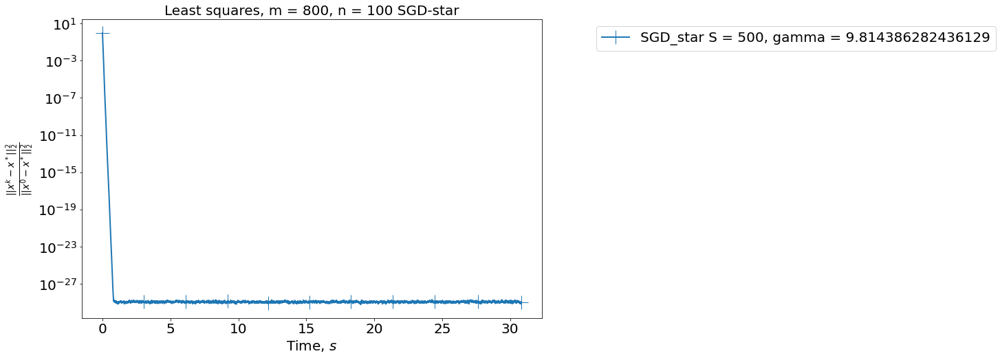

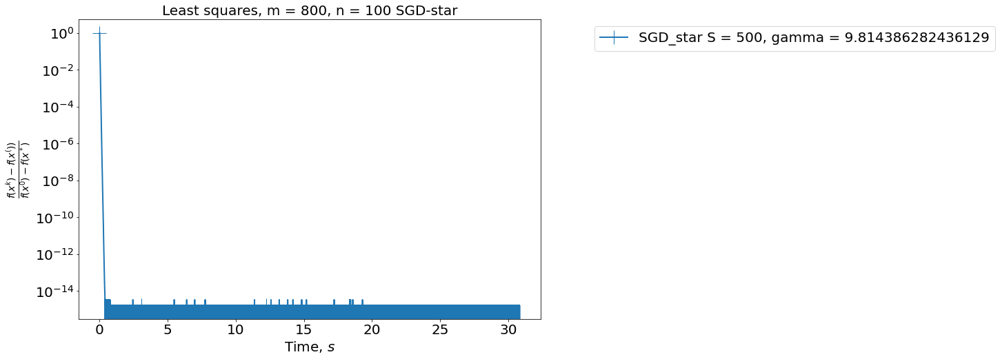

In [185]:
m = 800
n = 100
A, b, mu_all, L_all, L_max, x_star, f_star = construct_least_squares(m, n)
print("Константа сильной выпуклости всей функции: ", mu_all)
print("Константа гладкости всей функции         : ",L_all)
print("Худшая константа гладкости               : ",L_max)
print("Значение функции в решении               : ", f_star)

for gamma in gammas:
    batch_size = 1
    gamma_sgd = gamma/L_max
    S = 1000
    save_info_period = 5
    x_init = np.ones(n)
    res = sgd_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
                 batch_size=batch_size,
                 x_star=x_star, f_star=f_star)

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()

methods =[]
for gamma in gammas: 
    methods.append(['SGD', [m,n, gamma/L_max, S, 1], 
               f" gamma = {gamma/L_max}", None])
              
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)
plt.show()
batch_size = 1
gamma_svrg = 1.0/(6*L_max)
M = int(2 * m / batch_size)
S=500
save_info_period = 10
res = svrg_ls(x_init=x_init, A=A, b=b, gamma=gamma_svrg, S=S, M=M, 
             batch_size=batch_size,
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SVRG'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

gamma_sgd = 1.0/L_max
res = sgd_star_ls(x_init=x_init, A=A, b=b, gamma=gamma_sgd, S=S, 
             batch_size=batch_size, 
             save_info_period=save_info_period,
             x_star=x_star, f_star=f_star)

for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD-star'

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

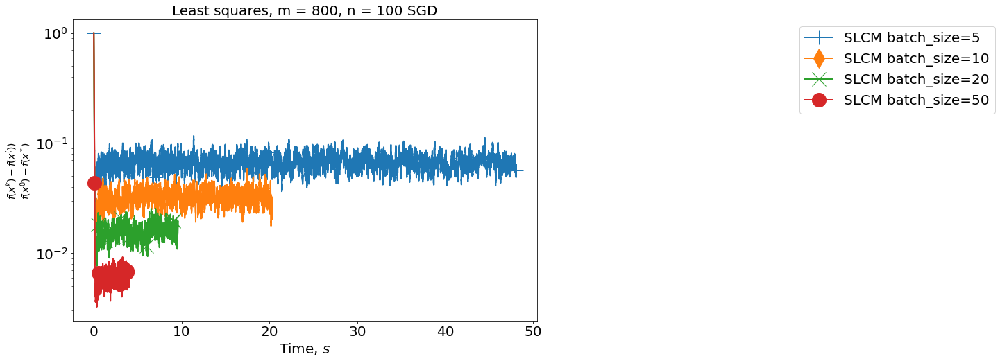

In [186]:
for size_b in [5,10,20,50]:
    batch_size_slcm = size_b
    eta = 1000
    S_slcm = 10000
    save_info_period = 10
    res = slcm_ls(x_init=x_init, A=A, b=b, L=L_all, 
                  eta=eta, S=S_slcm, batch_size=batch_size_slcm, x_star=x_star, f_star=f_star)

methods =[]
for size_b in [5,10,20,50]:
    methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch_size={size_b}", None])
              
mode_y = 'func_vals'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
title = 'Least squares, m = '+str(m)+', n = '+str(n)+' SGD'

args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args_for_plots)

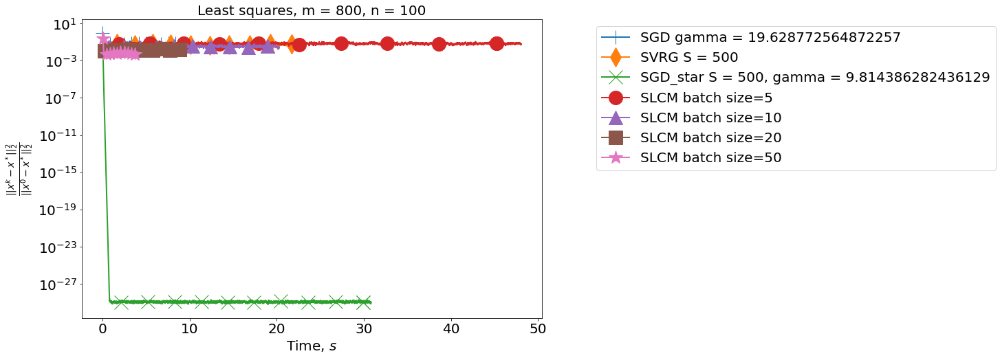

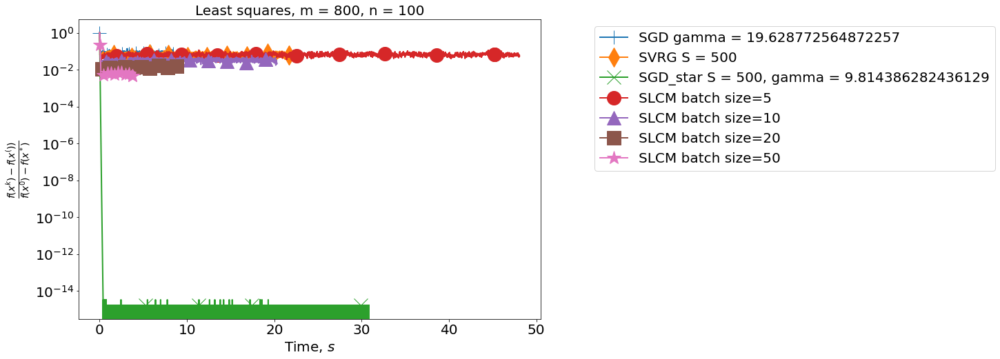

In [187]:
for mode_y in ['squared_distances', 'func_vals']:
    methods=[['SGD', [m,n, 0.05/L_max, 1000, 1], 
               f" gamma = {gamma/L_max}", None],
             ['SVRG', [m,n, gamma_svrg, S, int(2*m/1), 1], 
                f" S = {S}", None],['SGD_star', [m,n, gamma_sgd, S, 1], 
                f" S = {S}, gamma = {gamma_sgd}", None]]
    for size_b in[5,10,20,50]:
        methods.append(['SLCM', [m,n, eta, S_slcm, size_b], 
               f" batch size={size_b}", None])

    
    mode_x = 'time'
    figsize = (12, 8)
    fontsize = 20
    title = 'Least squares, m = '+str(m)+', n = '+str(n)

    args_for_plots = [mode_y, mode_x, figsize, fontsize, title, methods]
    make_plots(args_for_plots)
    plt.show()

SGD star все еще лучший. для SLCM лучше всего подходит размер батча 20-50